In [1]:
import os
import pandas as pd

def preprocess_excel_files(folder_path):
    # Get a list of all Excel files in the folder
    excel_files = [f for f in os.listdir(folder_path) if f.endswith('.xlsx')]

    for file_name in excel_files:
        file_path = os.path.join(folder_path, file_name)
        
        # Read the Excel file into a DataFrame
        df = pd.read_excel(file_path)
        
        # Replace 'None' values with the column-wise average
        for column in df.columns:
            if df[column].dtype != 'object':  # Only process numeric columns
                column_mean = df[column].mean()
                df[column] = df[column].apply(lambda x: column_mean if pd.isna(x) else x)
        
        # Save the modified DataFrame back to the Excel file
        df.to_excel(file_path, index=False)
        print(f"Processed {file_name}")

In [23]:
folder_path = r"C:\Users\Moh\Downloads\pre process"
preprocess_excel_files(folder_path)

Processed 1.xlsx
Processed 2.xlsx
Processed 3.xlsx
Processed 4.xlsx
Processed 5.xlsx
Processed 6.xlsx
Processed 7.xlsx
Processed 8.xlsx


In [24]:
import os
import pandas as pd

def merge_excel_files(folder_path, output_file_path):
    # Get a list of all Excel files in the folder
    excel_files = [f for f in os.listdir(folder_path) if f.endswith('.xlsx')]
    
    # Initialize an empty list to store DataFrames
    dataframes = []

    for file_name in excel_files:
        file_path = os.path.join(folder_path, file_name)
        
        # Read the Excel file into a DataFrame
        df = pd.read_excel(file_path)
        
        # Append the DataFrame to the list
        dataframes.append(df)

    # Concatenate all DataFrames into one
    merged_df = pd.concat(dataframes, ignore_index=True)
    
    # Save the merged DataFrame to a new Excel file
    merged_df.to_excel(output_file_path, index=False)
    print("Merged data saved to", output_file_path)

In [25]:
folder_path = r"C:\Users\Moh\Downloads\pre process"
output_file_path = 'C:/Users/Moh/Downloads/Final_pre_process/merged_data.xlsx'  # Change this to your desired output path
merge_excel_files(folder_path, output_file_path)

Merged data saved to C:/Users/Moh/Downloads/Final_pre_process/merged_data.xlsx


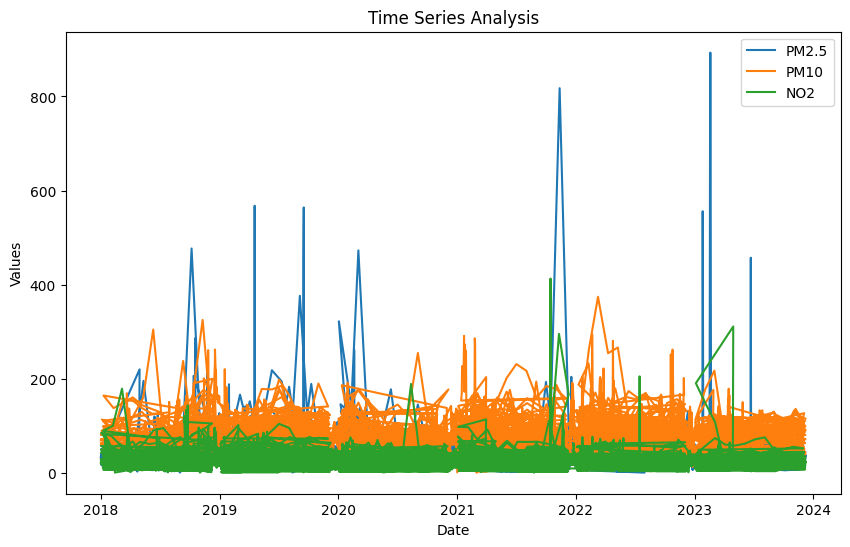

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the Excel file into a DataFrame
file_path = 'C:/Users/Moh/Downloads/Final_pre_process/merged_data.xlsx'  # Replace with the actual file path
df = pd.read_excel(file_path)

# Convert the 'From Date' column to a datetime format
df['From Date'] = pd.to_datetime(df['From Date'])

# Set the 'From Date' column as the index
df.set_index('From Date', inplace=True)

# Select the columns for analysis
columns_to_analyze = ['PM2.5', 'PM10', 'NO2']

# Plot the time series data for the selected columns
plt.figure(figsize=(10, 6))

for column in columns_to_analyze:
    plt.plot(df.index, df[column], label=column)

plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Time Series Analysis')
plt.legend()
plt.show()


In [16]:
df.head

<bound method NDFrame.head of                 PM2.5        PM10        NO2 Station_name
From Date                                                
2018-01-01  33.225109   68.578735  20.702477   BTM Layout
2018-02-01  33.225109   68.578735  20.702477   BTM Layout
2018-03-01  33.225109   68.578735  20.702477   BTM Layout
2018-04-01  33.225109   68.578735  20.702477   BTM Layout
2018-05-01  33.225109   68.578735  20.702477   BTM Layout
...               ...         ...        ...          ...
2023-08-08  20.580000  101.360000  16.530000   Silk Board
2023-09-08  21.950000  123.230000  18.650000   Silk Board
2023-10-08  21.350000  113.480000  17.490000   Silk Board
2023-11-08  25.040000  124.800000  19.030000   Silk Board
2023-12-08  31.000000  115.000000  22.500000   Silk Board

[16400 rows x 4 columns]>

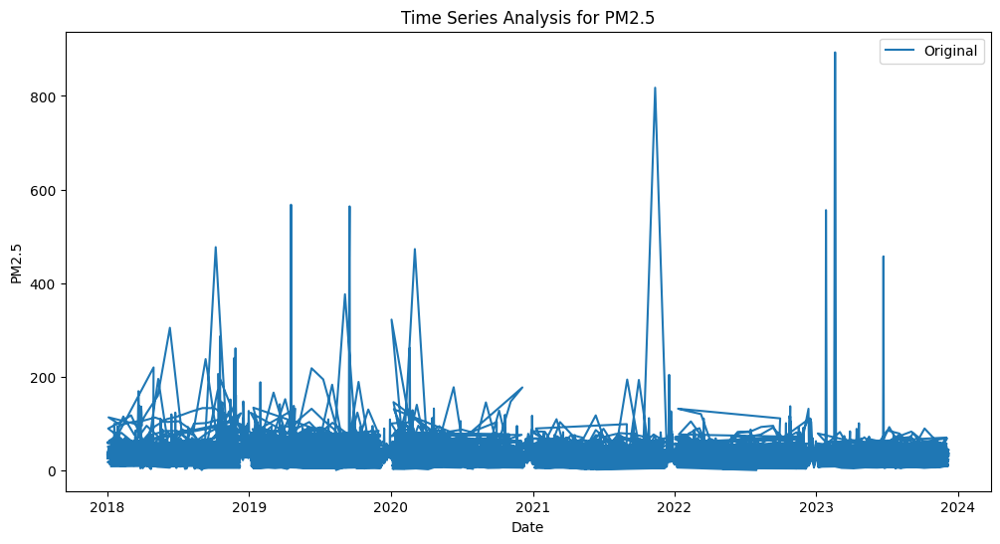

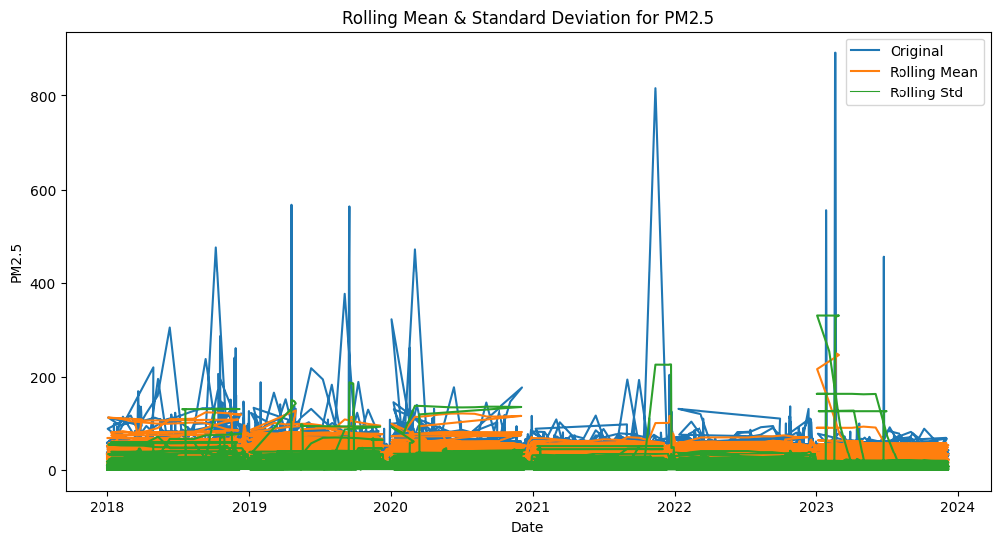

ADF Statistic for PM2.5: -12.317980142355282
p-value: 6.852615982075588e-23
Critical Values:
1%: -3.430749531197847
5%: -2.861716576590915
10%: -2.566863987269052


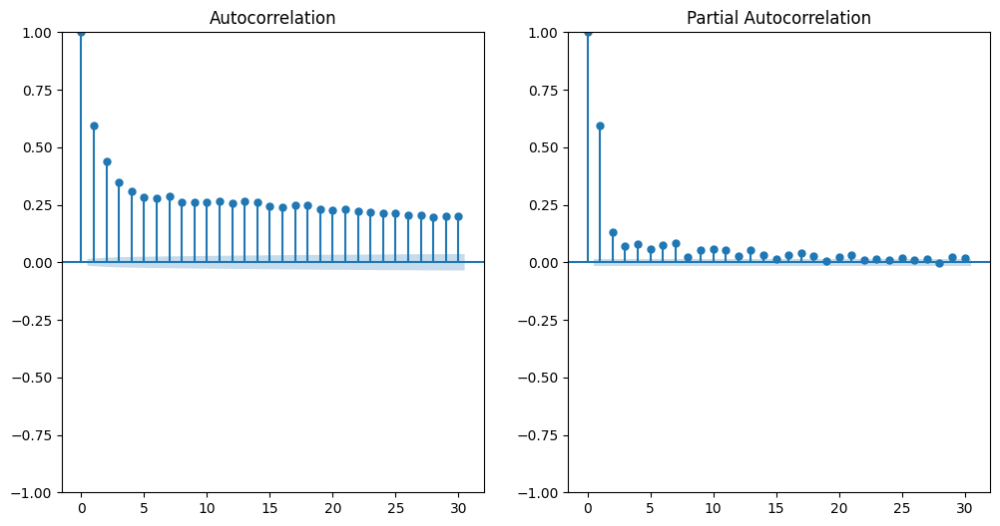

NameError: name 'p' is not defined

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Read the Excel file into a DataFrame
file_path = 'C:/Users/Moh/Downloads/Final_pre_process/merged_data.xlsx'  # Replace with the actual file path
df = pd.read_excel(file_path)

# Convert 'Date' column to datetime format and set as index
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Select the columns for analysis
columns_to_analyze = ['PM2.5', 'PM10', 'NO2']

# Loop through columns for time series analysis
for column in columns_to_analyze:
    # Visualize the time series data
    plt.figure(figsize=(12, 6))
    plt.plot(df.index, df[column], label='Original')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.title(f'Time Series Analysis for {column}')
    plt.legend()
    plt.show()

    # Check for stationarity using rolling statistics
    rolling_mean = df[column].rolling(window=12).mean()
    rolling_std = df[column].rolling(window=12).std()
    
    plt.figure(figsize=(12, 6))
    plt.plot(df.index, df[column], label='Original')
    plt.plot(rolling_mean, label='Rolling Mean')
    plt.plot(rolling_std, label='Rolling Std')
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.title(f'Rolling Mean & Standard Deviation for {column}')
    plt.legend()
    plt.show()
    
    # Perform Augmented Dickey-Fuller test for stationarity
    from statsmodels.tsa.stattools import adfuller
    adf_result = adfuller(df[column], autolag='AIC')
    print(f'ADF Statistic for {column}: {adf_result[0]}')
    print(f'p-value: {adf_result[1]}')
    print('Critical Values:')
    for key, value in adf_result[4].items():
        print(f'{key}: {value}')

    # If needed, perform differencing to achieve stationarity
    # For example: df[f'{column}_diff'] = df[column].diff().dropna()

    # Determine p and q values using ACF and PACF plots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    plot_acf(df[column], ax=ax1, lags=30)
    plot_pacf(df[column], ax=ax2, lags=30)
    plt.show()

    # Fit ARIMA model
    model = ARIMA(df[column], order=(p, d, q))  # Replace p, d, q with determined values
    results = model.fit()

    # Make predictions
    forecast, stderr, conf_int = results.forecast(steps=10)  # Replace 10 with desired number of forecast steps

    # Plot predictions along with original data
    plt.figure(figsize=(12, 6))
    plt.plot(df.index, df[column], label='Original')
    plt.plot(pd.date_range(start=df.index[-1], periods=10, freq='D'), forecast, label='Forecast')
    plt.fill_between(pd.date_range(start=df.index[-1], periods=10, freq='D'), forecast - stderr, forecast + stderr, color='gray', alpha=0.2)
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.title(f'Original and Forecast for {column}')
    plt.legend()
    plt.show()


In [28]:
file_path = 'C:/Users/Moh/Downloads/Final_pre_process/merged_data.xlsx'  # Replace with the actual file path
df = pd.read_excel(file_path)
df.isnull().sum()

Date            0
PM2.5           0
PM10            0
NO2             0
Station_name    0
dtype: int64

In [30]:
import pmdarima as pm
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

In [31]:
def predict_with_auto_arima(data_series):
    # Fit Auto ARIMA model
    automodel = pm.auto_arima(data_series,
                              start_p=3,
                              start_q=3,
                              max_p=5,
                              max_q=5,
                              test='adf',
                              seasonal=True,
                              trace=True)
    
    # Forecast the next steps using Auto ARIMA model
    forecast_steps = 10  # Adjust as needed
    forecast = automodel.predict(n_periods=forecast_steps)
    
    return forecast


In [46]:
def visualize_forecast(data_series, forecast, column_name):
    plt.figure(figsize=(16, 8))
    plt.plot(data_series.index, data_series, label='Actual ' + column_name)
    plt.plot(pd.date_range(start=data_series.index[-1], periods=len(forecast), freq='D'), forecast,
             label='Predicted ' + column_name, linestyle='dashed')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('Original vs Predicted ' + column_name)
    plt.legend()
    plt.show()


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
plt.figure(figsize = (16,8))
model2 = ARIMA(df, order = (3,0,3))
results_ARIMA2 = model2.fit()
plt.plot(df)
plt.plot(results_ARIMA2.fittedvalues, color = 'red')
plt.title("Original vs Predicted graph")

In [47]:
data = pd.read_excel(r"C:\Users\Moh\Downloads\pre process\1.xlsx")

In [48]:
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)  # Convert to datetime format (assuming day/month/year order)


In [49]:
data.sort_values(by='From Date', inplace=True)


In [50]:
print(data)


      From Date           To Date      PM2.5       PM10        NO2   
0    2018-01-01  02-01-2018 00:00  33.225109  68.578735  20.702477  \
31   2018-01-02  02-02-2018 00:00  33.820000  68.578735  48.160000   
59   2018-01-03  02-03-2018 00:00  28.720000  68.578735  25.130000   
90   2018-01-04  02-04-2018 00:00  33.225109  68.578735  20.702477   
120  2018-01-05  02-05-2018 00:00  40.060000  68.578735  18.090000   
...         ...               ...        ...        ...        ...   
1927 2023-12-04  13-04-2023 00:00  21.820000  46.430000  18.470000   
1957 2023-12-05  13-05-2023 00:00  14.950000  31.800000  24.430000   
1988 2023-12-06  13-06-2023 00:00  10.340000  22.010000  24.440000   
2018 2023-12-07  13-07-2023 00:00  11.680000  24.850000  24.450000   
2049 2023-12-08  12-08-2023 10:20  22.990000  39.660000  24.620000   

     Station_name  
0      BTM Layout  
31     BTM Layout  
59     BTM Layout  
90     BTM Layout  
120    BTM Layout  
...           ...  
1927   BTM Layout  

In [51]:
data['From Date']

0      2018-01-01
31     2018-01-02
59     2018-01-03
90     2018-01-04
120    2018-01-05
          ...    
1927   2023-12-04
1957   2023-12-05
1988   2023-12-06
2018   2023-12-07
2049   2023-12-08
Name: From Date, Length: 2050, dtype: datetime64[ns]

In [52]:
pollutants = ['PM2.5', 'PM10', 'NO2']

Performing stepwise search to minimize aic
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=18100.902, Time=3.09 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=18669.527, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18206.870, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18354.499, Time=0.40 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=20983.315, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=18100.601, Time=2.47 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=18064.691, Time=2.22 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=18183.655, Time=0.71 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=18101.527, Time=2.22 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=18054.017, Time=3.16 sec
 ARIMA(0,0,4)(0,0,0)[0] intercept   : AIC=18166.195, Time=1.08 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=inf, Time=2.95 sec
 ARIMA(1,0,5)(0,0,0)[0] intercept   : AIC=18054.875, Time=3.24 sec
 ARIMA(0,0,5)(0,0,0)[0] intercept   : AIC=18166.107, Time=1.41 sec
 ARIMA(2,0,5)(0,0,0)[0] i

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


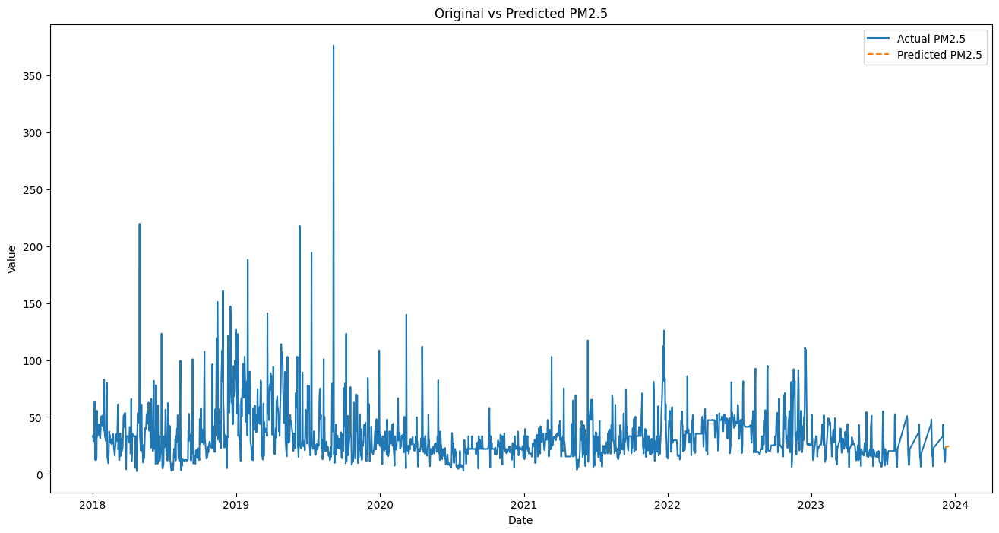

Performing stepwise search to minimize aic
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=18704.274, Time=3.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=19179.996, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18836.838, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18937.077, Time=0.36 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=23429.712, Time=0.02 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=18651.219, Time=2.25 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=18655.452, Time=2.11 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=18701.860, Time=2.37 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=18645.572, Time=3.19 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=18655.007, Time=2.77 sec
 ARIMA(3,0,4)(0,0,0)[0] intercept   : AIC=inf, Time=3.65 sec
 ARIMA(2,0,5)(0,0,0)[0] intercept   : AIC=18645.668, Time=4.03 sec
 ARIMA(1,0,5)(0,0,0)[0] intercept   : AIC=18658.384, Time=3.20 sec
 ARIMA(3,0,5)(0,0,0)[0] intercept   : AIC=18653.417, Time=3.79 sec
 ARIMA(2,0,4)(0,0,0)[0]  

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


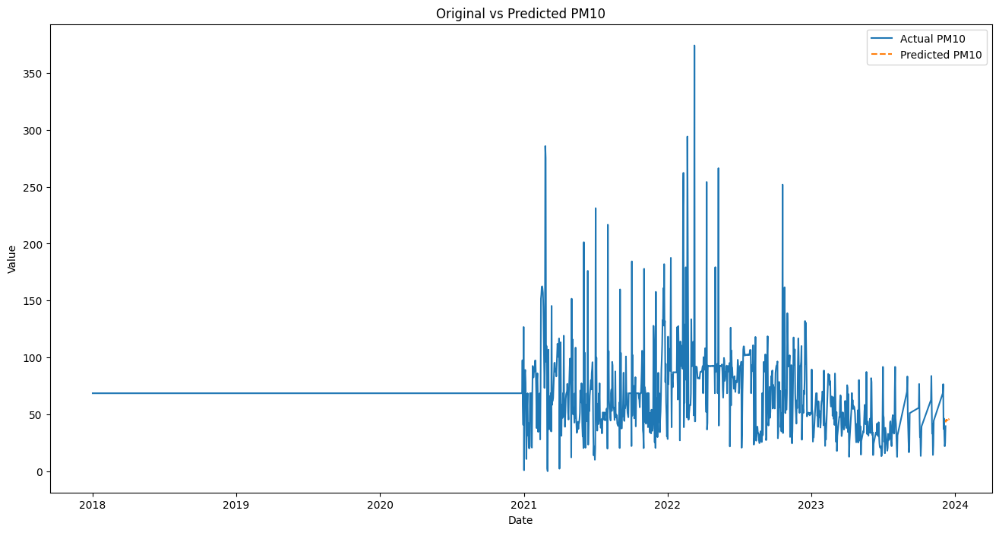

Performing stepwise search to minimize aic
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=15283.357, Time=2.80 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=15867.690, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=15345.819, Time=0.07 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=15483.237, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=18802.691, Time=0.03 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=15287.376, Time=2.88 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.15 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=15270.039, Time=2.98 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.88 sec
 ARIMA(5,0,3)(0,0,0)[0] intercept   : AIC=15276.645, Time=4.50 sec
 ARIMA(4,0,4)(0,0,0)[0] intercept   : AIC=15273.763, Time=4.08 sec
 ARIMA(3,0,4)(0,0,0)[0] intercept   : AIC=15279.564, Time=4.40 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=4.33 sec
 ARIMA(5,0,4)(0,0,0)[0] intercept   : AIC=15280.614, Time=5.12 sec
 ARIMA(4,0,3)(0,0,0)[0]             :

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


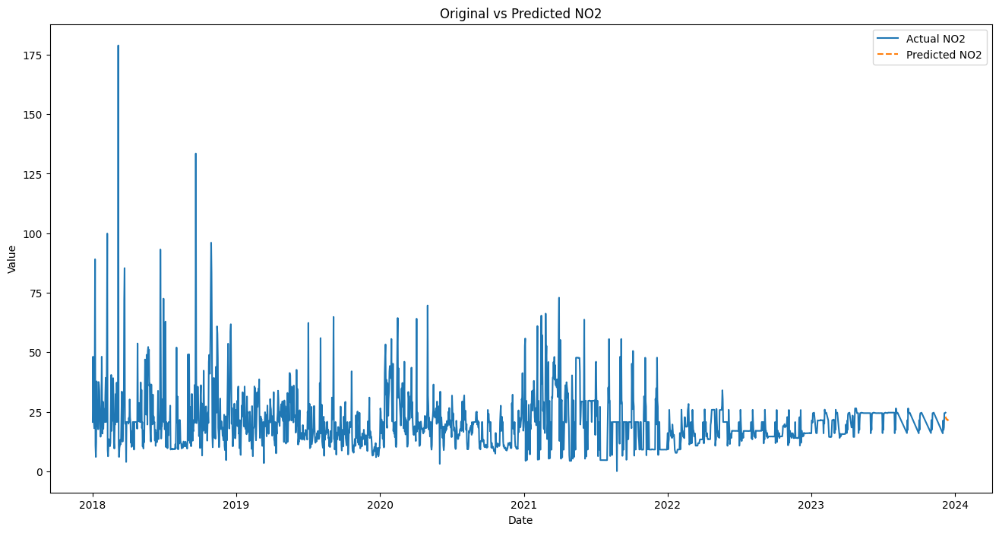

In [53]:
for pollutant in pollutants:
    data_series = data.set_index('From Date')[pollutant]
    forecast = predict_with_auto_arima(data_series)
    visualize_forecast(data_series, forecast, pollutant)

In [ ]:
# Separate columns for PM2.5, PM10, and NO2
pm25_forecast = predict_with_auto_arima(data, 'PM2.5')
pm10_forecast = predict_with_auto_arima(data, 'PM10')
no2_forecast = predict_with_auto_arima(data, 'NO2')


In [16]:
# Print the forecasts
print("PM2.5 Forecast:", pm25_forecast)
print("PM10 Forecast:", pm10_forecast)
print("NO2 Forecast:", no2_forecast)


NameError: name 'pm25_forecast' is not defined

In [ ]:
plt.figure(figsize=(16, 8))

In [54]:
def predict_with_auto_arima(data_series):
    # Fit Auto ARIMA model
    automodel = pm.auto_arima(data_series,
                              start_p=3,
                              start_q=3,
                              max_p=5,
                              max_q=5,
                              test='adf',
                              seasonal=True,
                              trace=True)
    
    # Forecast the next steps using Auto ARIMA model
    forecast_steps = 10  # Adjust as needed
    forecast = automodel.predict(n_periods=forecast_steps)
    
    return forecast

def visualize_forecast(data_series, forecast, column_name):
    plt.figure(figsize=(16, 8))
    plt.plot(data_series.index, data_series, label='Actual ' + column_name)
    plt.plot(pd.date_range(start=data_series.index[-1], periods=len(forecast), freq='D'), forecast,
             label='Predicted ' + column_name, linestyle='dashed')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.title('Original vs Predicted ' + column_name)
    plt.legend()
    plt.show()

Performing stepwise search to minimize aic
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=18100.902, Time=3.23 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=18669.527, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18206.870, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18354.499, Time=0.44 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=20983.315, Time=0.02 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=18100.601, Time=2.44 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=18064.691, Time=2.31 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=18183.655, Time=0.66 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=18101.527, Time=2.14 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=18054.017, Time=3.18 sec
 ARIMA(0,0,4)(0,0,0)[0] intercept   : AIC=18166.195, Time=1.15 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=inf, Time=3.58 sec
 ARIMA(1,0,5)(0,0,0)[0] intercept   : AIC=18054.875, Time=3.27 sec
 ARIMA(0,0,5)(0,0,0)[0] intercept   : AIC=18166.107, Time=1.31 sec
 ARIMA(2,0,5)(0,0,0)[0] i

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


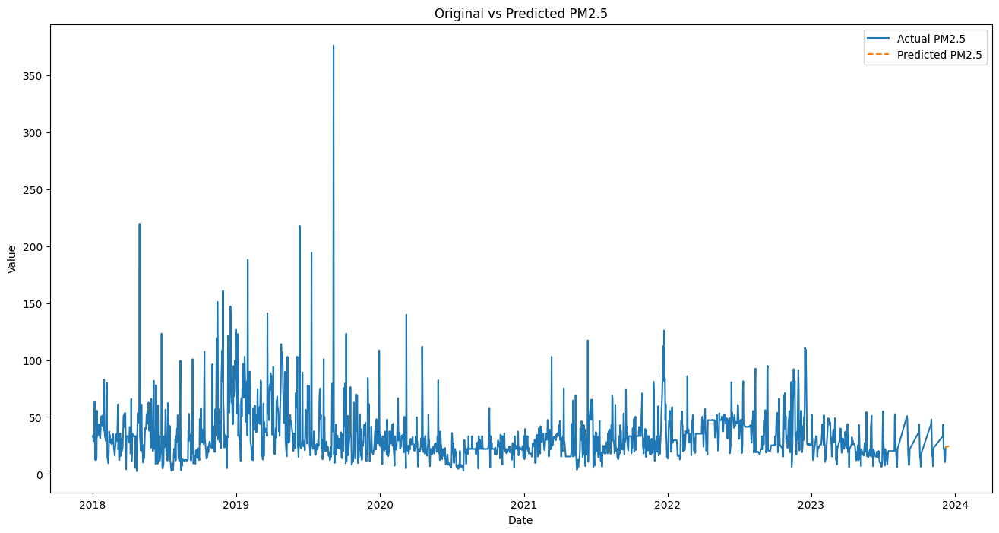

Performing stepwise search to minimize aic
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=18704.274, Time=2.94 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=19179.996, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=18836.838, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=18937.077, Time=0.35 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=23429.712, Time=0.02 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=18651.219, Time=2.32 sec
 ARIMA(1,0,3)(0,0,0)[0] intercept   : AIC=18655.452, Time=2.58 sec
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=18701.860, Time=2.57 sec
 ARIMA(2,0,4)(0,0,0)[0] intercept   : AIC=18645.572, Time=3.61 sec
 ARIMA(1,0,4)(0,0,0)[0] intercept   : AIC=18655.007, Time=3.11 sec
 ARIMA(3,0,4)(0,0,0)[0] intercept   : AIC=inf, Time=3.81 sec
 ARIMA(2,0,5)(0,0,0)[0] intercept   : AIC=18645.668, Time=4.71 sec
 ARIMA(1,0,5)(0,0,0)[0] intercept   : AIC=18658.384, Time=3.40 sec
 ARIMA(3,0,5)(0,0,0)[0] intercept   : AIC=18653.417, Time=4.04 sec
 ARIMA(2,0,4)(0,0,0)[0]  

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


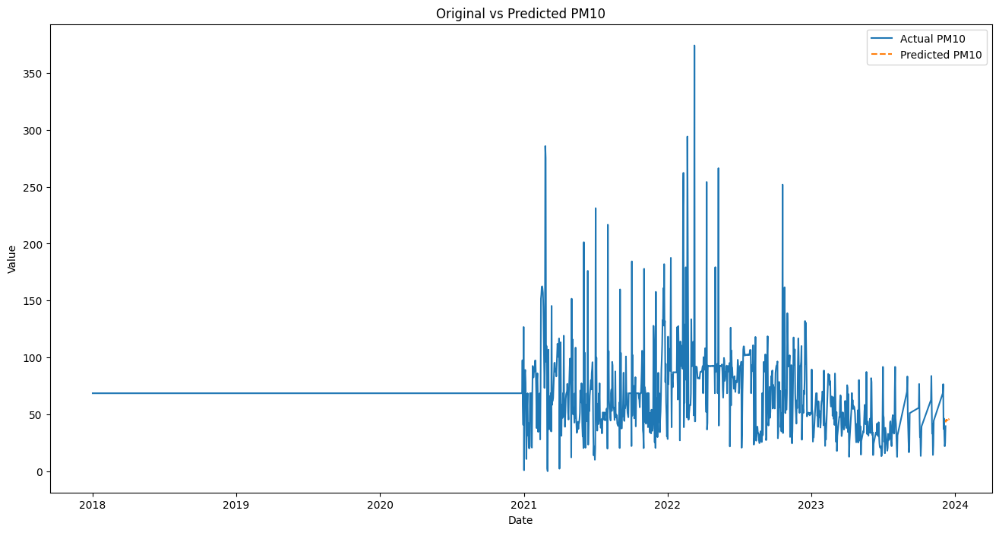

Performing stepwise search to minimize aic
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=15283.357, Time=2.63 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=15867.690, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=15345.819, Time=0.06 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=15483.237, Time=0.31 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=18802.691, Time=0.02 sec
 ARIMA(2,0,3)(0,0,0)[0] intercept   : AIC=15287.376, Time=2.12 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.22 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=15270.039, Time=2.71 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.39 sec
 ARIMA(5,0,3)(0,0,0)[0] intercept   : AIC=15276.645, Time=4.49 sec
 ARIMA(4,0,4)(0,0,0)[0] intercept   : AIC=15273.763, Time=3.84 sec
 ARIMA(3,0,4)(0,0,0)[0] intercept   : AIC=15279.564, Time=3.95 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=inf, Time=3.41 sec
 ARIMA(5,0,4)(0,0,0)[0] intercept   : AIC=15280.614, Time=4.09 sec
 ARIMA(4,0,3)(0,0,0)[0]             :

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


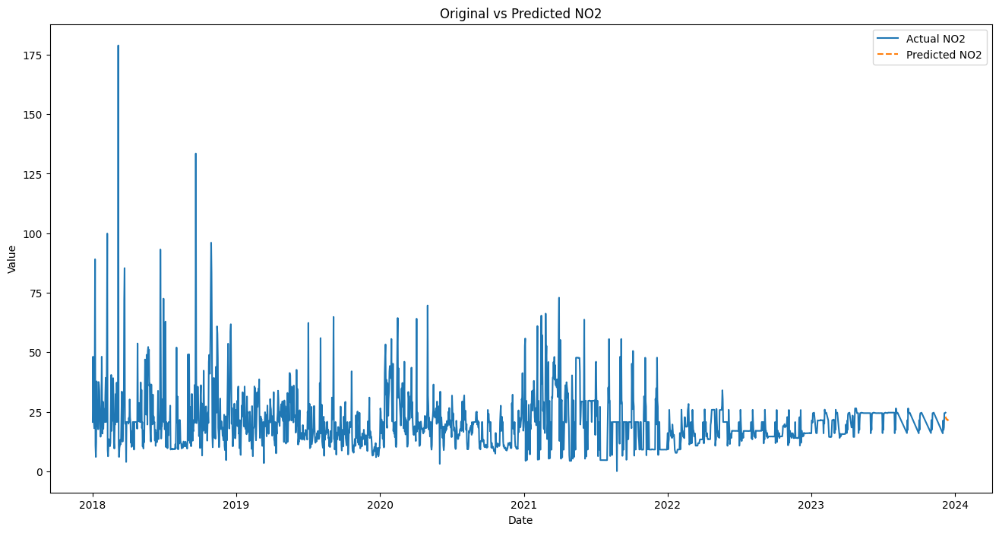

In [55]:
data = pd.read_excel(r"C:\Users\Moh\Downloads\pre process\1.xlsx")
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)  # Convert to datetime format (assuming day/month/year order)

data.sort_values(by='From Date', inplace=True)

pollutants = ['PM2.5', 'PM10', 'NO2']
for pollutant in pollutants:
    data_series = data.set_index('From Date')[pollutant]
    forecast = predict_with_auto_arima(data_series)
    visualize_forecast(data_series, forecast, pollutant)
    

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import pmdarima as pm

In [3]:
data = pd.read_excel(r"C:\Users\Moh\Downloads\pre process\1.xlsx")
data


,From Date,PM2.5,PM10,NO2,Station_name
0,01-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
1,02-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
2,03-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
3,04-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
4,05-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
...,...,...,...,...,...
2045,08-08-2023 00:00,21.860000,31.680000,24.640000,BTM Layout
2046,09-08-2023 00:00,21.870000,51.120000,24.640000,BTM Layout
2047,10-08-2023 00:00,18.760000,39.440000,24.620000,BTM Layout
2048,11-08-2023 00:00,23.010000,44.460000,24.650000,BTM Layout


In [4]:
data

,From Date,PM2.5,PM10,NO2,Station_name
0,01-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
1,02-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
2,03-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
3,04-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
4,05-01-2018 00:00,33.225109,68.578735,20.702477,BTM Layout
...,...,...,...,...,...
2045,08-08-2023 00:00,21.860000,31.680000,24.640000,BTM Layout
2046,09-08-2023 00:00,21.870000,51.120000,24.640000,BTM Layout
2047,10-08-2023 00:00,18.760000,39.440000,24.620000,BTM Layout
2048,11-08-2023 00:00,23.010000,44.460000,24.650000,BTM Layout


In [5]:
def fit_arima_and_forecast(data_col):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=(3, 0, 3))
    results_ARIMA = model.fit()

    # Forecast next 10 steps
    forecast_steps = 10
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def plot_data_forecast(data_col, results_ARIMA, forecast):
    plt.figure(figsize=(16, 8))
    plt.plot(data_col, label='Original Data')
    plt.plot(results_ARIMA.fittedvalues, color='red', label='Fitted Values')
    plt.plot(range(len(data_col), len(data_col) + len(forecast)), forecast, color='green', label='Forecast')
    plt.legend()
    plt.title("Original vs Fitted vs Forecast")
    plt.show()

def plot_extended_data(data_col, forecast, original_last_values):
    extended_data = pd.concat([data_col, pd.Series(forecast, index=range(len(data_col), len(data_col) + len(forecast)))])
    
    plt.figure(figsize=(16, 8))
    plt.plot(extended_data.tail(100), label='Extended Data')
    plt.plot(original_last_values, color='red', label='Last 40 Original Values')
    plt.legend()
    plt.title("Extended Data and Last 40 Original Values")
    plt.show()

def plot_combined_data(data_col, forecast, original_last_values, forecast_percentage=0.5):
    extended_data = pd.concat([data_col, pd.Series(forecast, index=range(len(data_col), len(data_col) + len(forecast)))])
    
    combined_values = original_last_values * (1 - forecast_percentage) + forecast * forecast_percentage
    
    plt.figure(figsize=(16, 8))
    plt.plot(extended_data, label='Extended Data')
    plt.plot(range(len(data_col), len(extended_data)), combined_values, color='green', label='Combined Forecast')
    plt.legend()
    plt.title("Extended Data and Combined Forecast")
    plt.show()


In [6]:
# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)


In [9]:
data

,From Date,PM2.5,PM10,NO2,Station_name
0,2018-01-01,33.225109,68.578735,20.702477,BTM Layout
1,2018-01-02,33.225109,68.578735,20.702477,BTM Layout
2,2018-01-03,33.225109,68.578735,20.702477,BTM Layout
3,2018-01-04,33.225109,68.578735,20.702477,BTM Layout
4,2018-01-05,33.225109,68.578735,20.702477,BTM Layout
...,...,...,...,...,...
2045,2023-08-08,21.860000,31.680000,24.640000,BTM Layout
2046,2023-08-09,21.870000,51.120000,24.640000,BTM Layout
2047,2023-08-10,18.760000,39.440000,24.620000,BTM Layout
2048,2023-08-11,23.010000,44.460000,24.650000,BTM Layout


c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


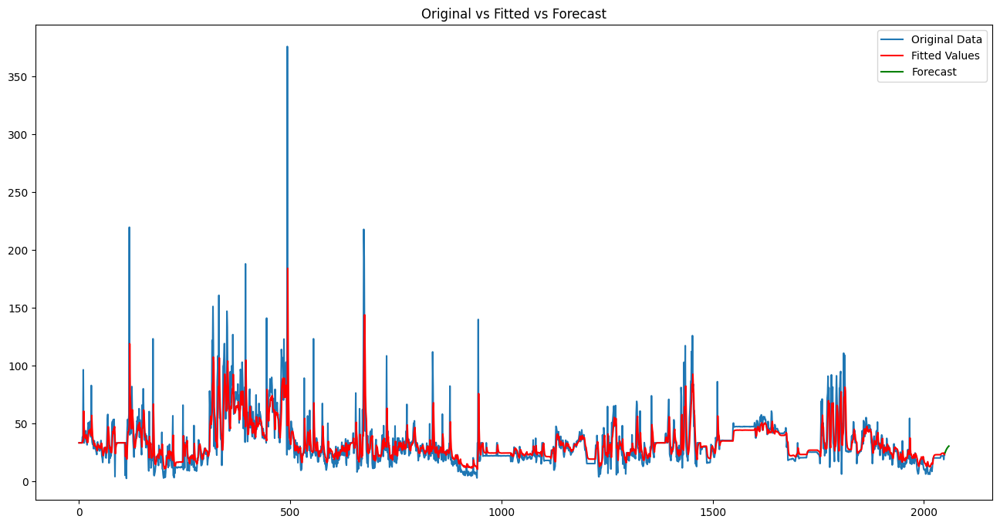

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


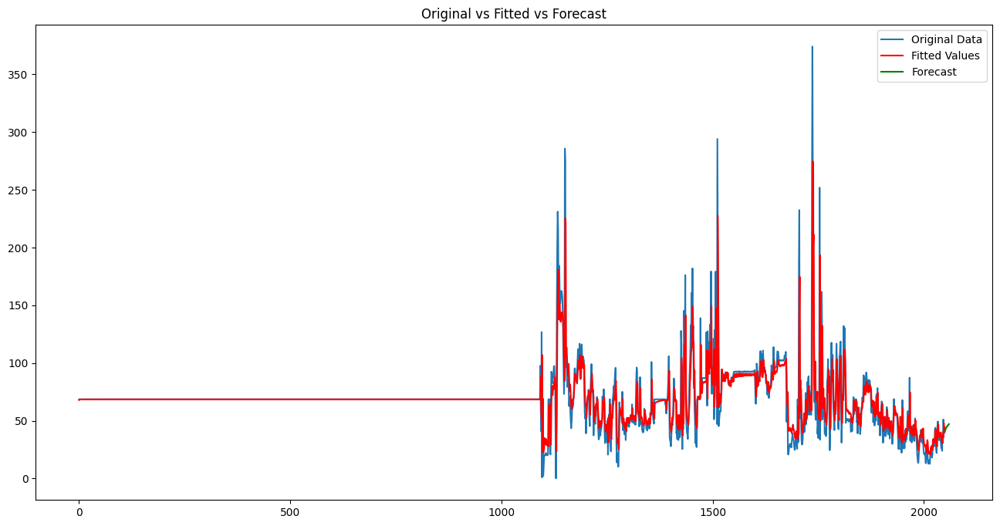

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


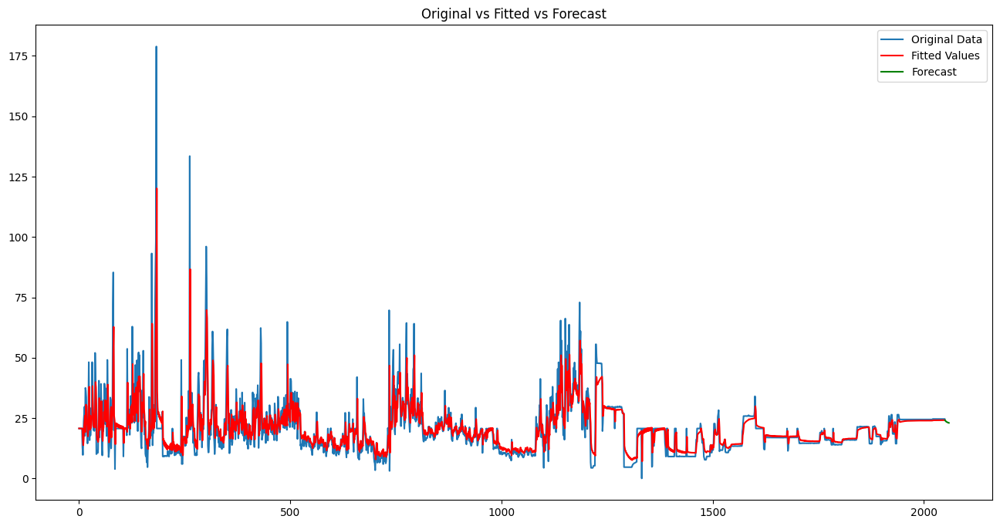

In [8]:
# For each pollutant column, fit ARIMA and forecast
pollutants = ['PM2.5', 'PM10', 'NO2']
for pollutant in pollutants:
    data_col = data[pollutant]
    
    results_ARIMA, forecast = fit_arima_and_forecast(data_col)
    
    plot_data_forecast(data_col, results_ARIMA, forecast)
    
    original_last_values = data_col[-40:]
    

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


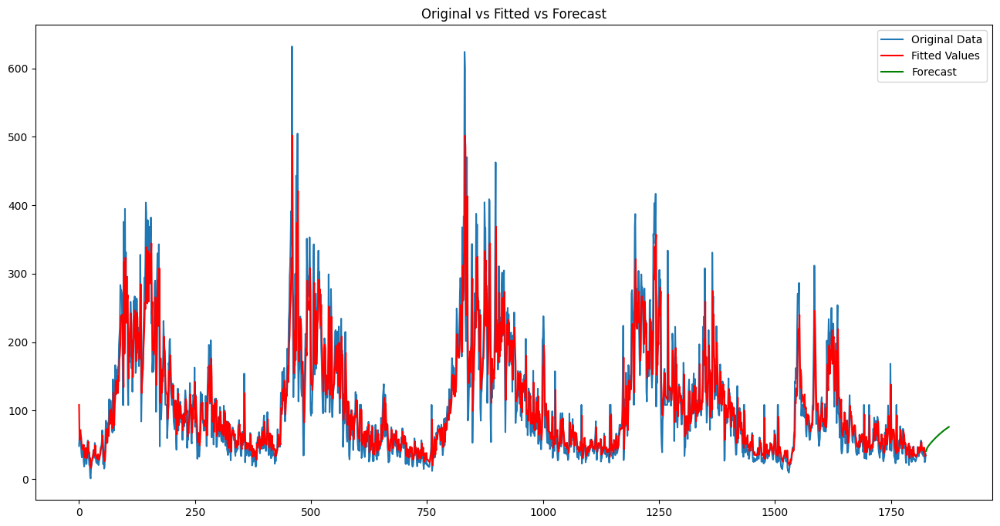

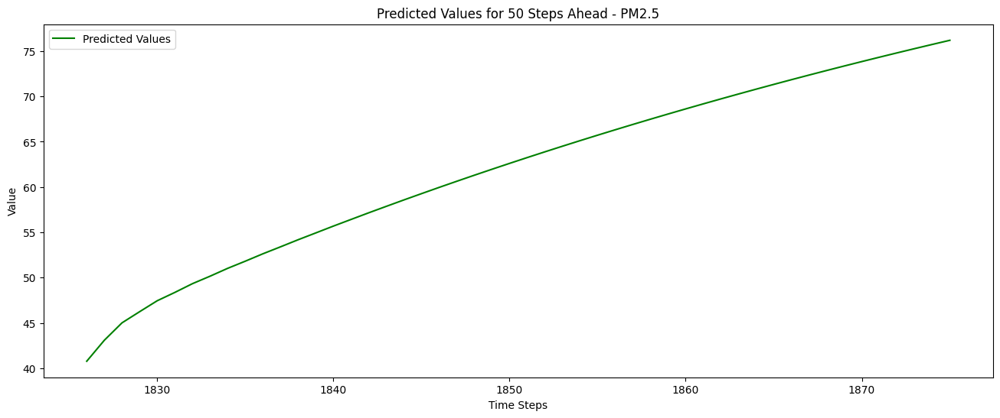

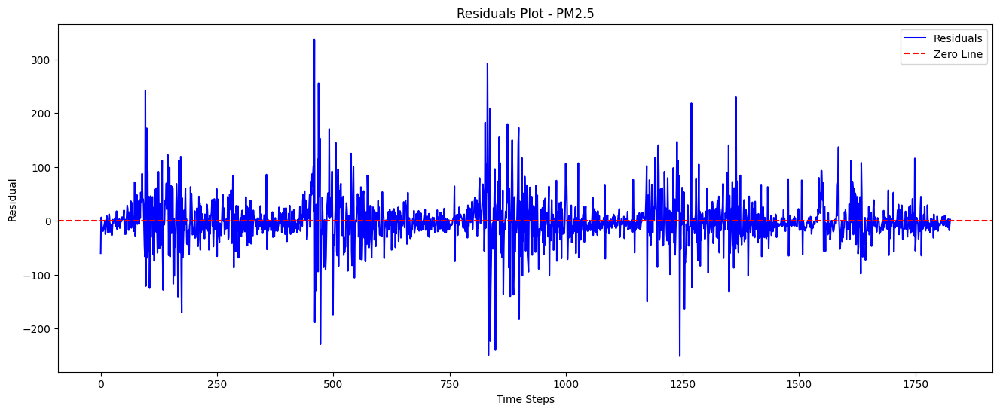

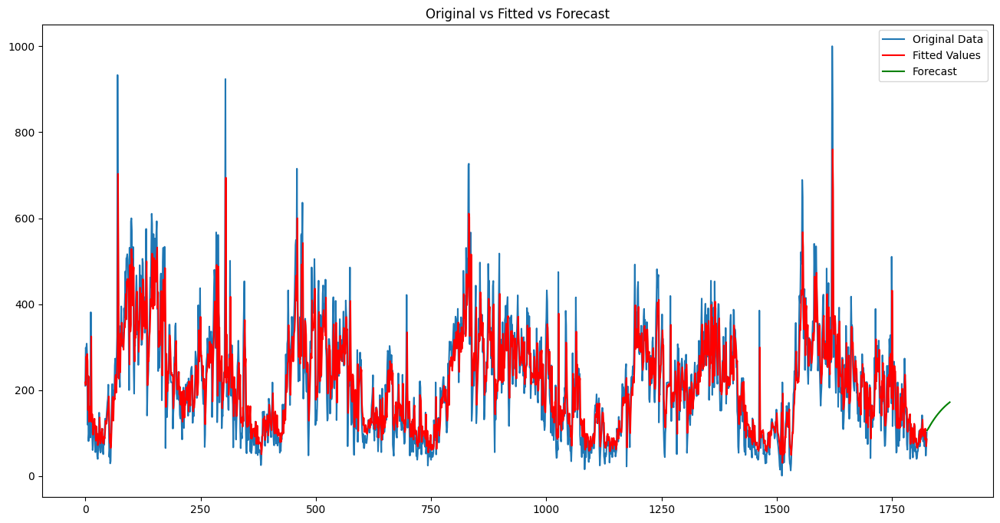

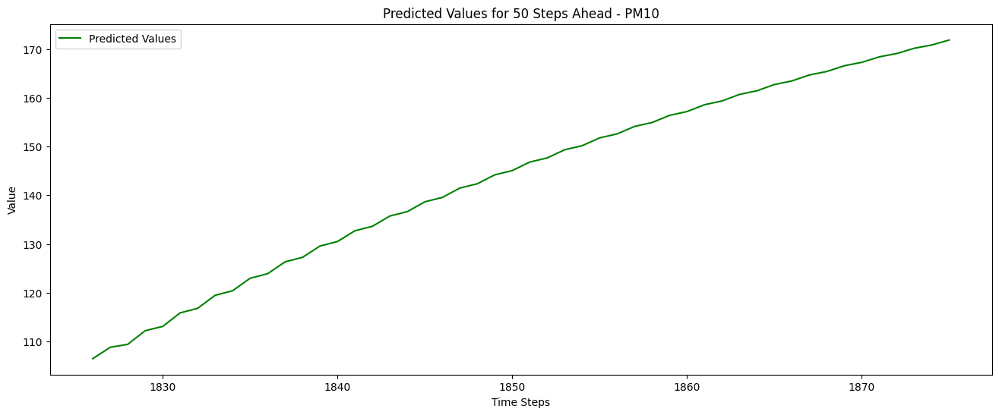

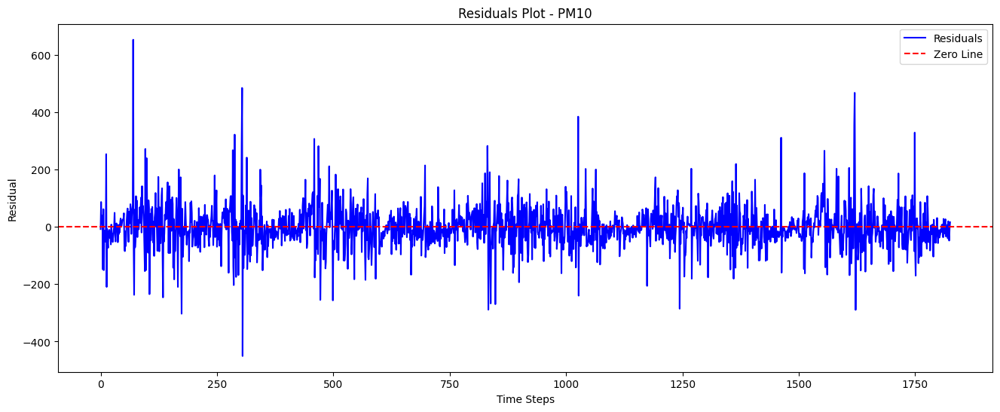

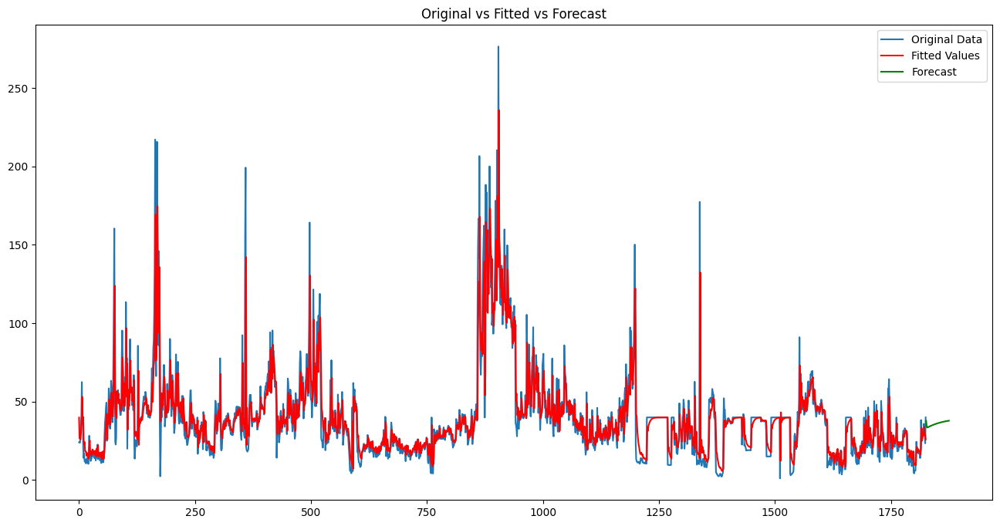

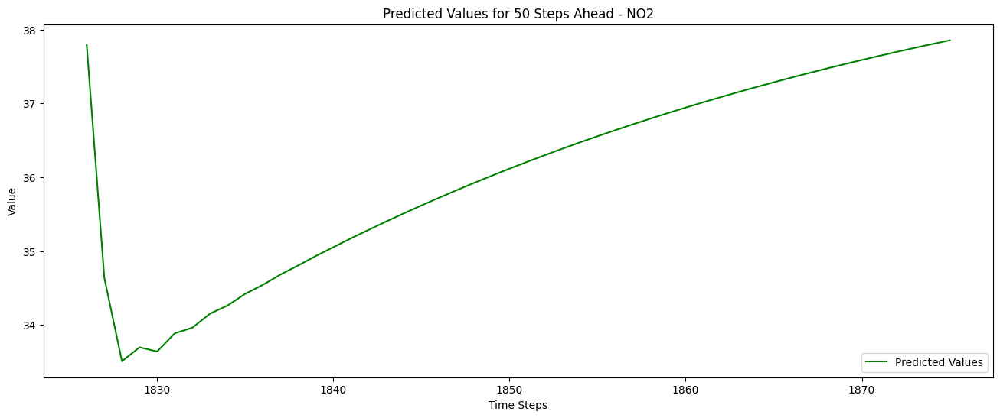

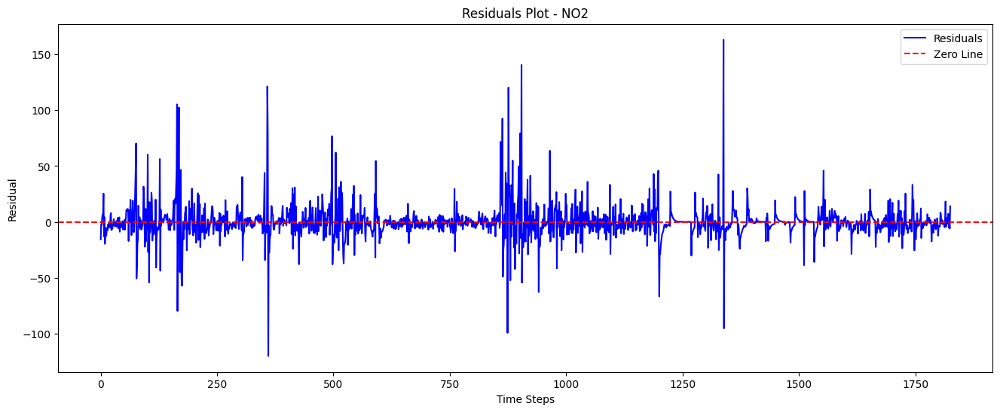

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


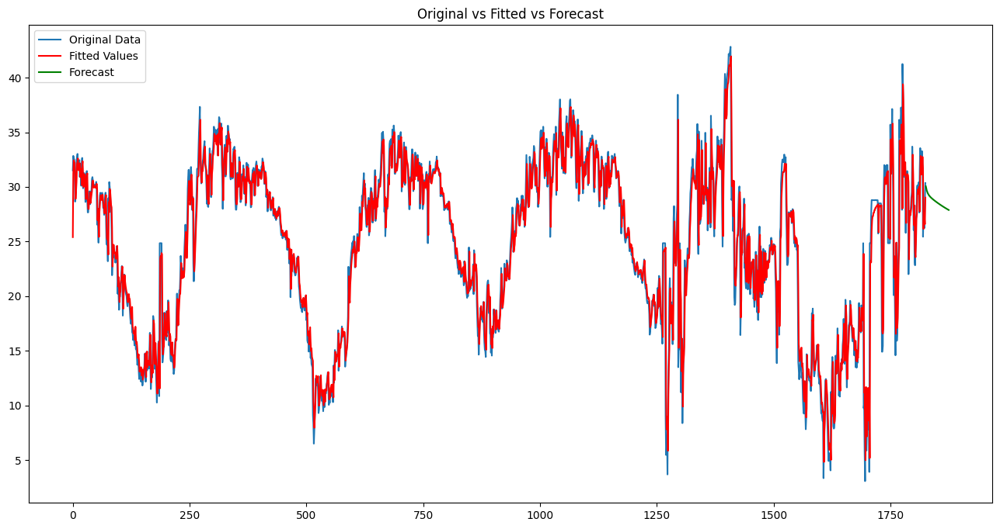

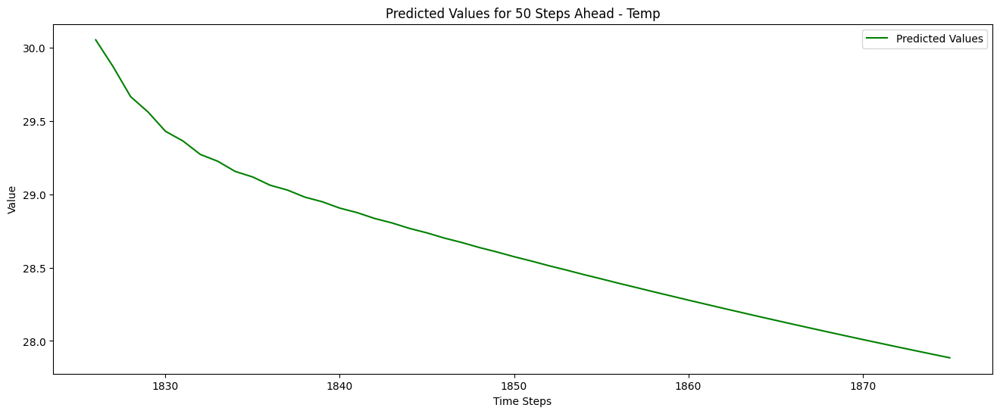

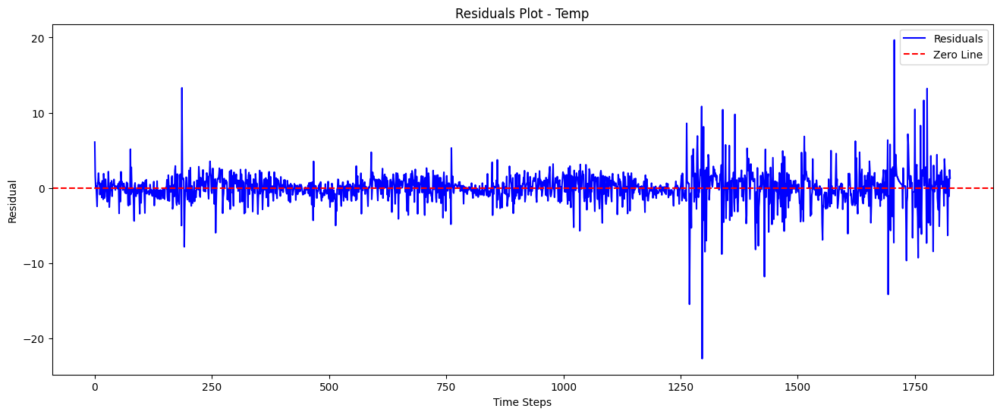

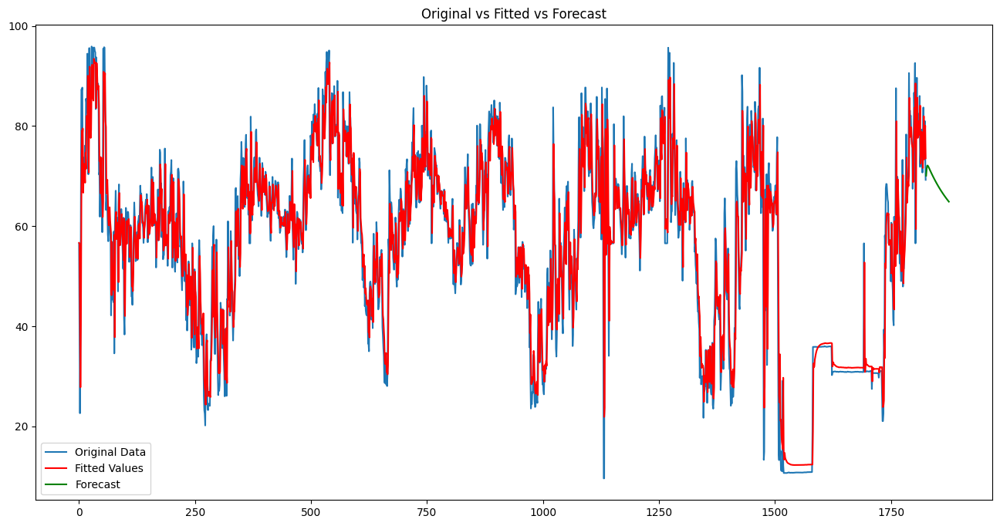

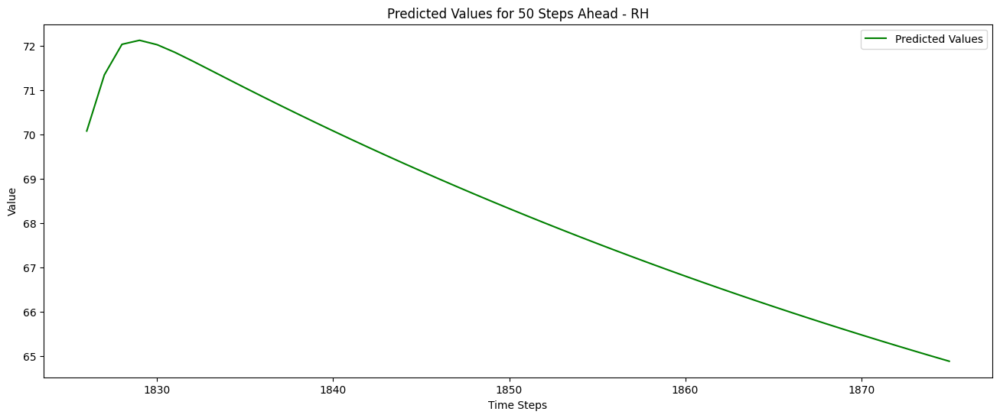

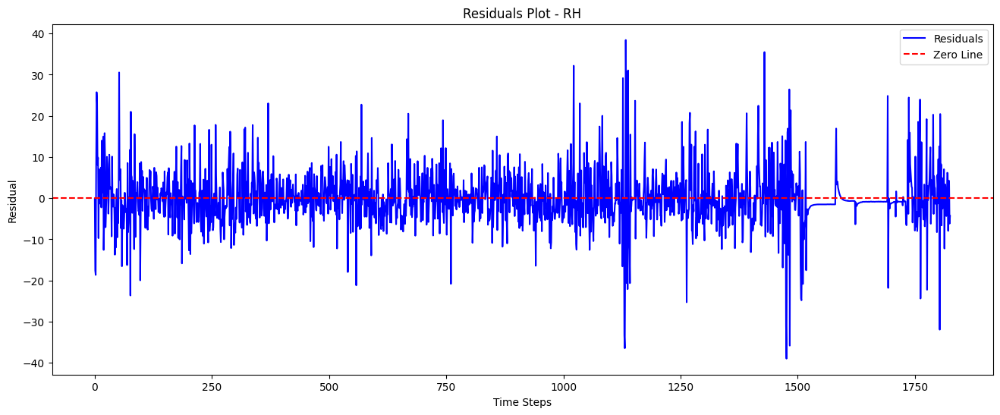

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\1.csv")

# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

def fit_arima_and_forecast(data_col, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=(3, 0, 3))
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def plot_data_forecast(data_col, results_ARIMA, forecast, forecast_steps):
    plt.figure(figsize=(16, 8))
    plt.plot(data_col, label='Original Data')
    plt.plot(results_ARIMA.fittedvalues, color='red', label='Fitted Values')
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Forecast')
    plt.legend()
    plt.title("Original vs Fitted vs Forecast")
    plt.show()



# For each pollutant column, fit ARIMA and forecast
pollutants = ['PM2.5', 'PM10', 'NO2' , 'Temp' , 'RH']
forecast_steps = 50  # Define the number of forecast steps

for pollutant in pollutants:
    data_col = data[pollutant]
    
    results_ARIMA, forecast = fit_arima_and_forecast(data_col, forecast_steps)
    
    plot_data_forecast(data_col, results_ARIMA, forecast, forecast_steps)
    
    # Visualize predicted values for 50 steps
    plt.figure(figsize=(16, 6))
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Predicted Values')
    plt.xlabel('Time Steps')
    plt.ylabel('Value')
    plt.title(f'Predicted Values for {forecast_steps} Steps Ahead - {pollutant}')
    plt.legend()
    plt.show()

    # Visualize residuals
    residuals = data_col - results_ARIMA.fittedvalues
    plt.figure(figsize=(16, 6))
    plt.plot(residuals, color='blue', label='Residuals')
    plt.axhline(y=0, color='red', linestyle='--', label='Zero Line')
    plt.xlabel('Time Steps')
    plt.ylabel('Residual')
    plt.title(f'Residuals Plot - {pollutant}')
    plt.legend()
    plt.show()


c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting M

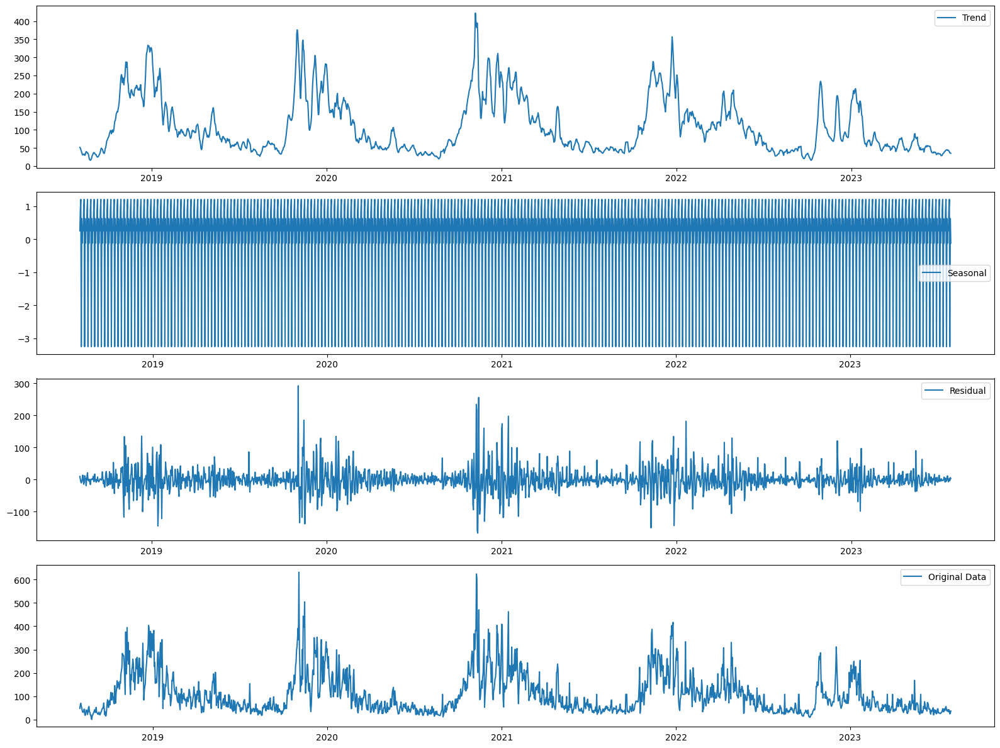

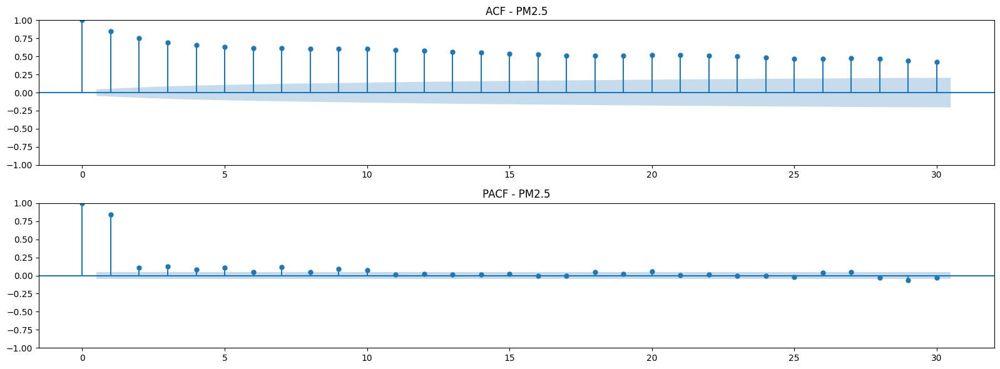

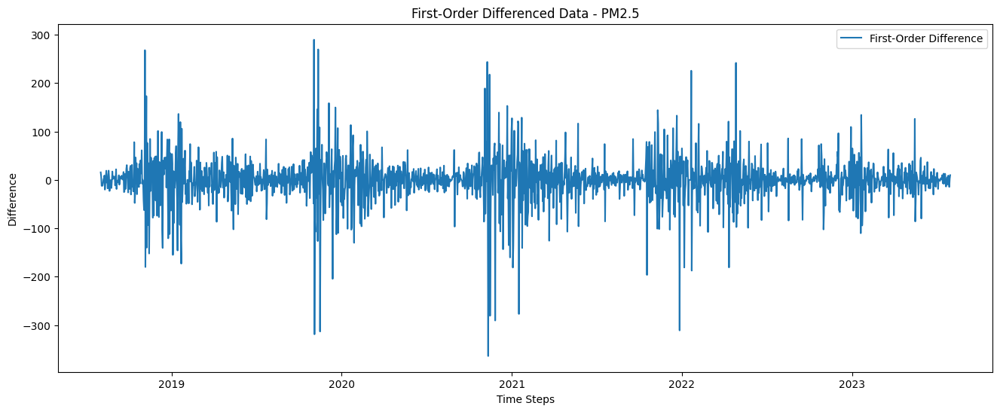

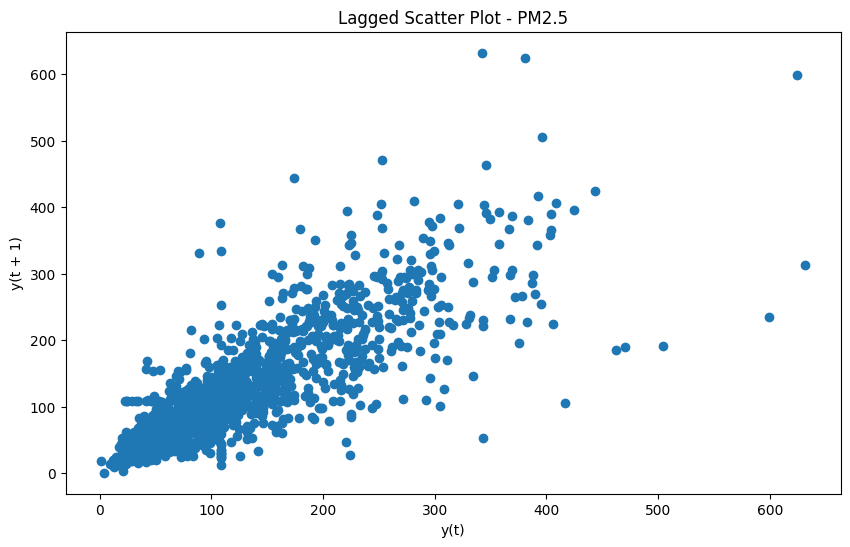

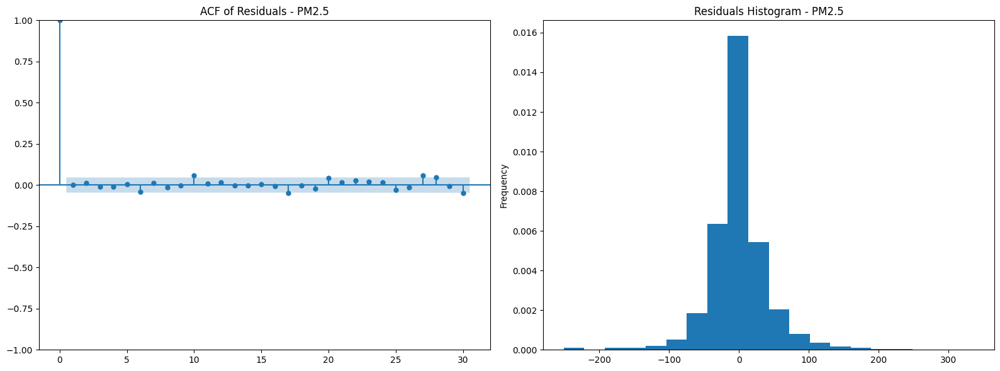

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


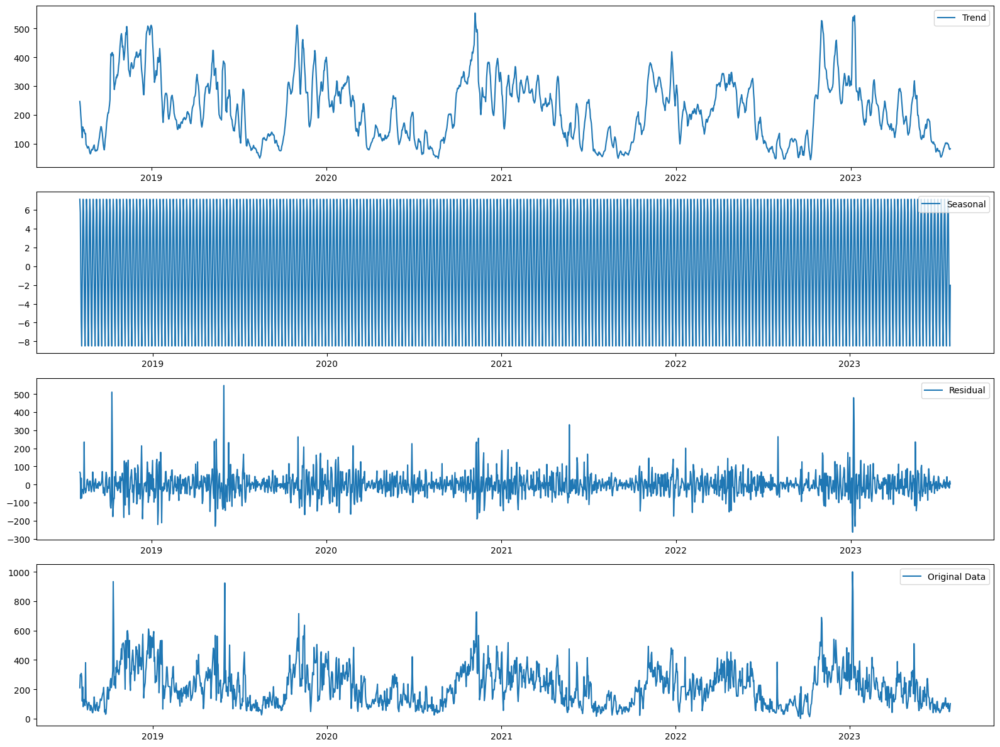

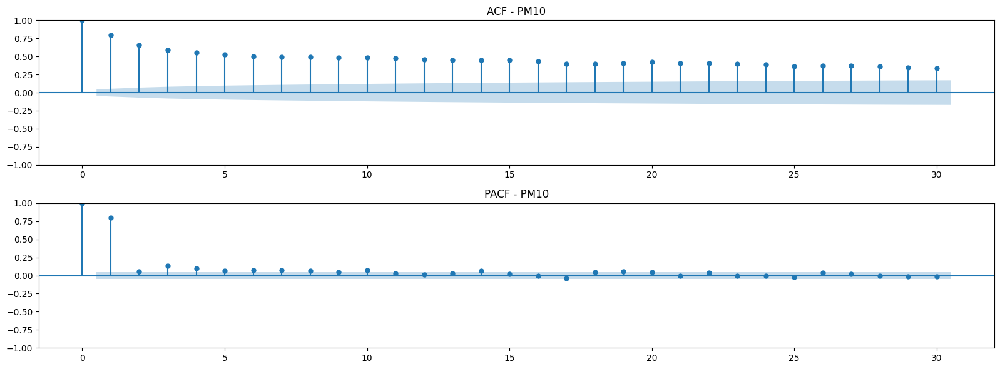

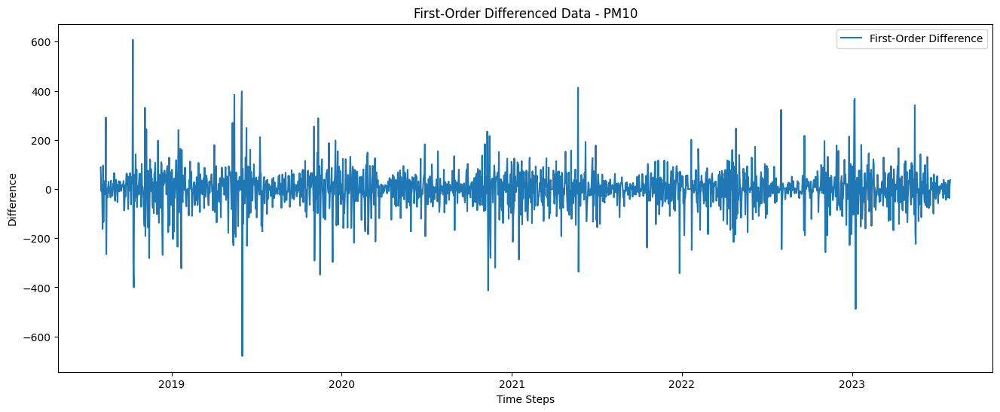

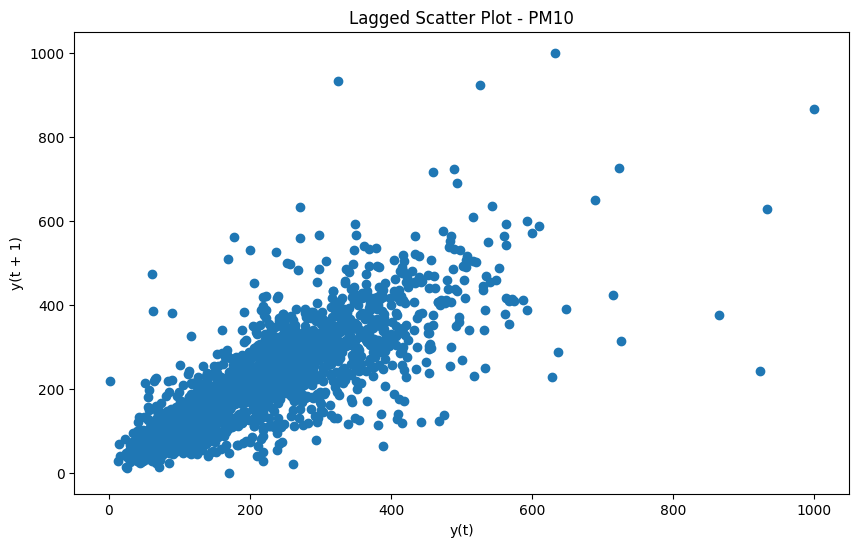

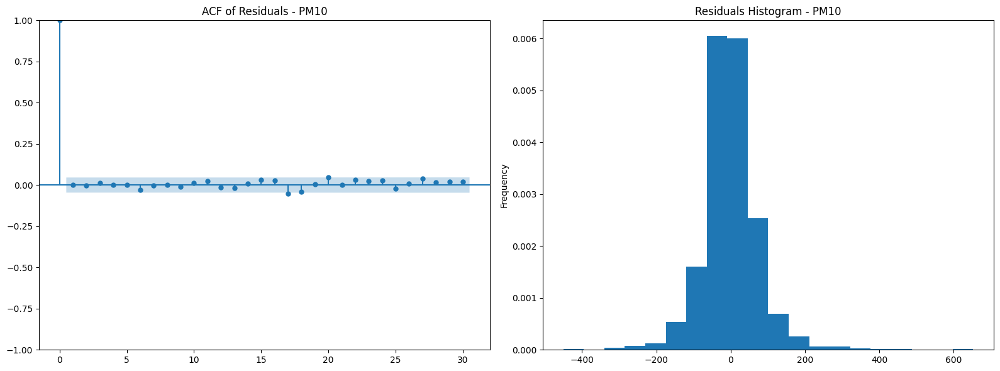

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


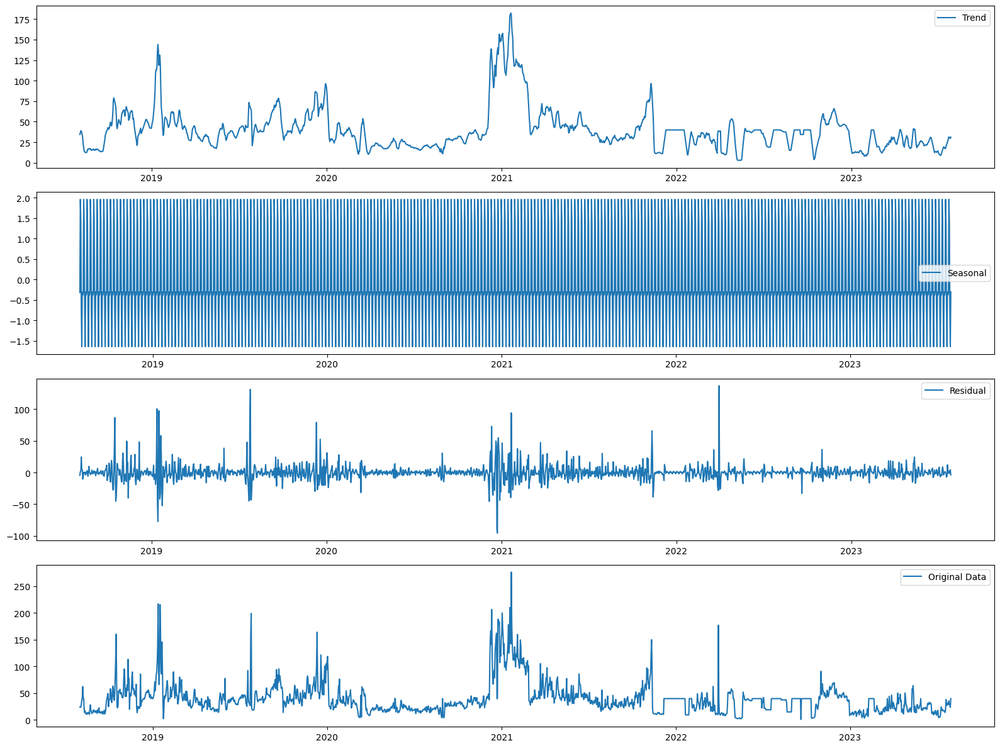

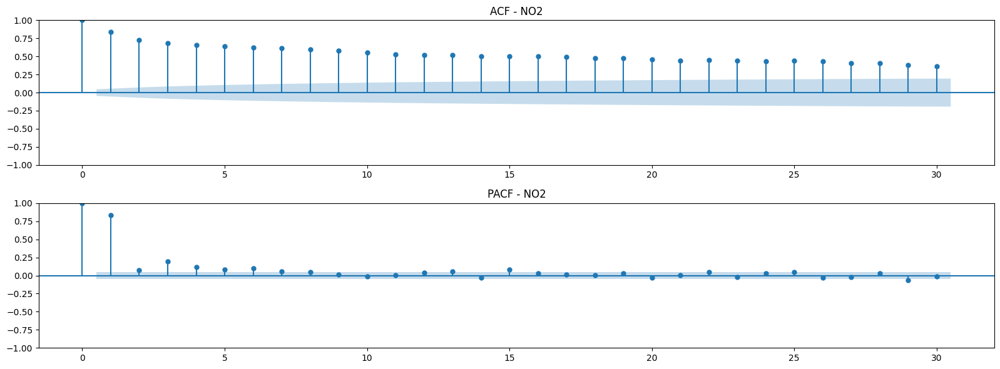

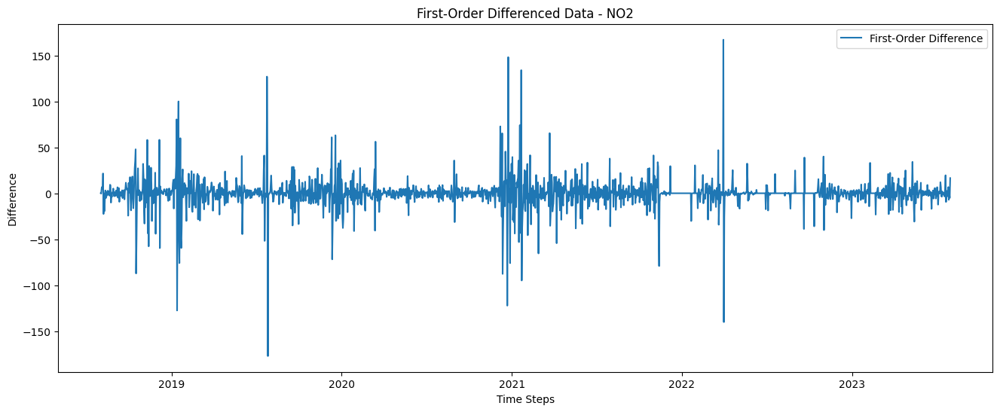

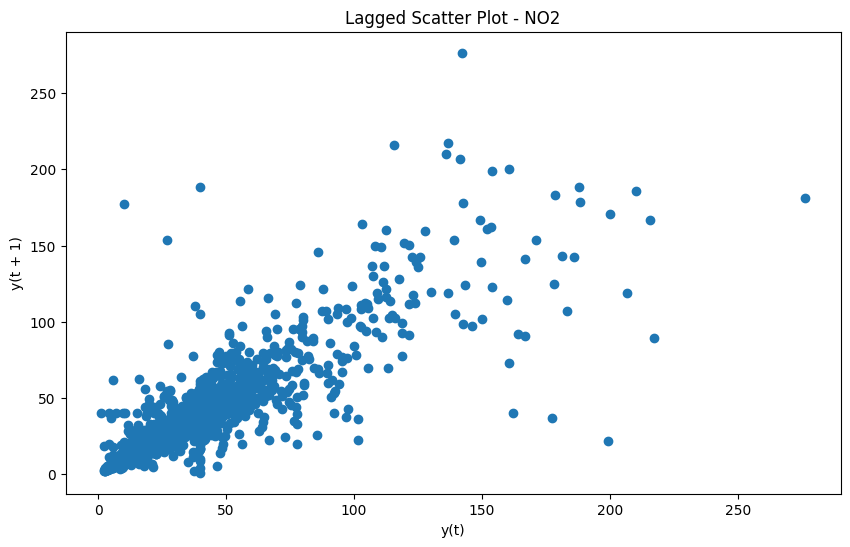

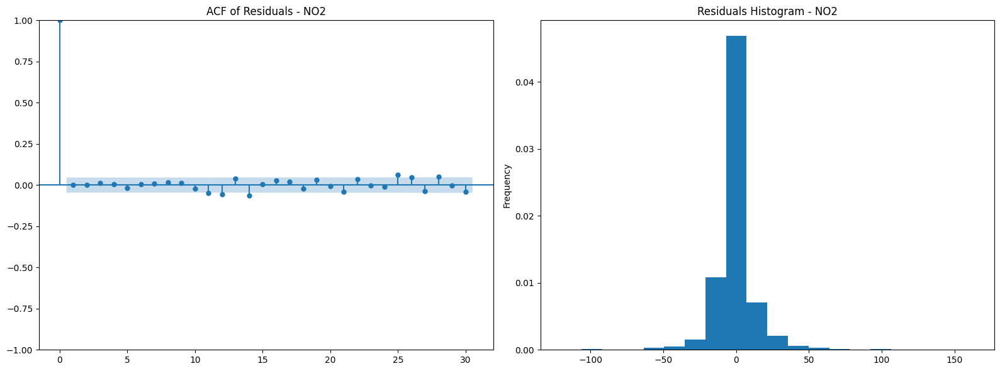

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


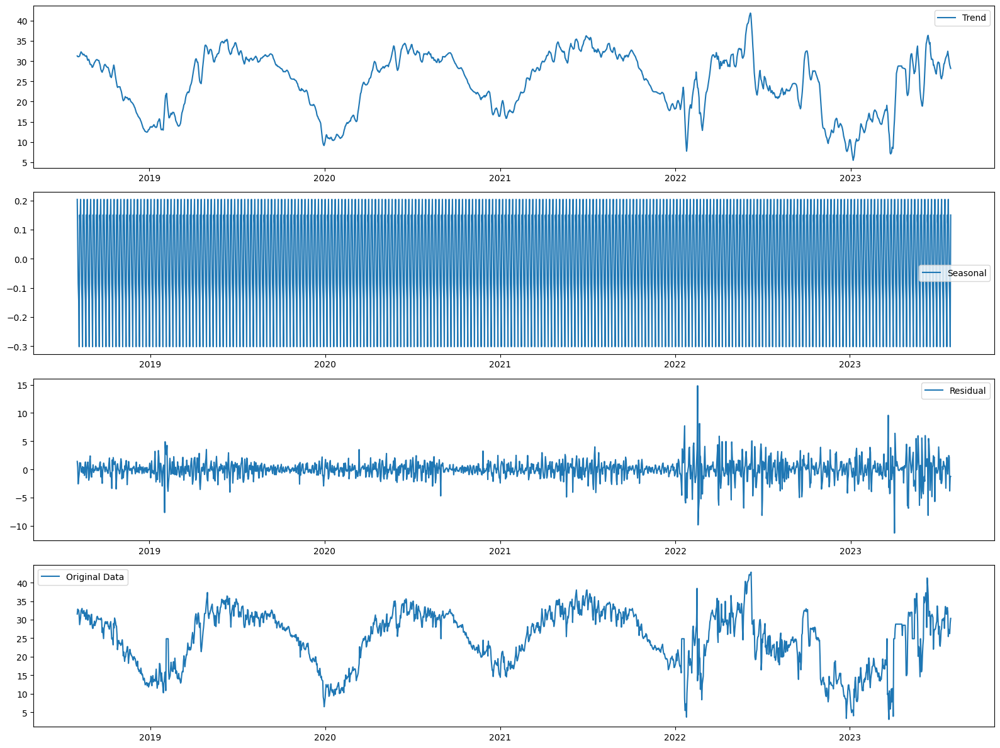

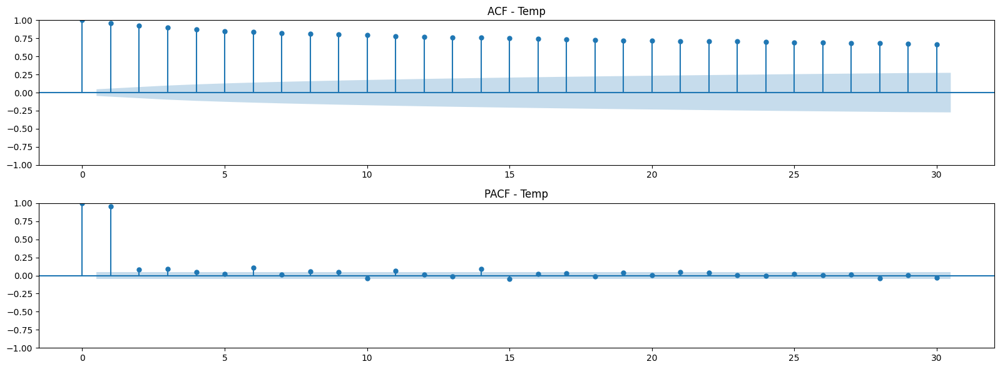

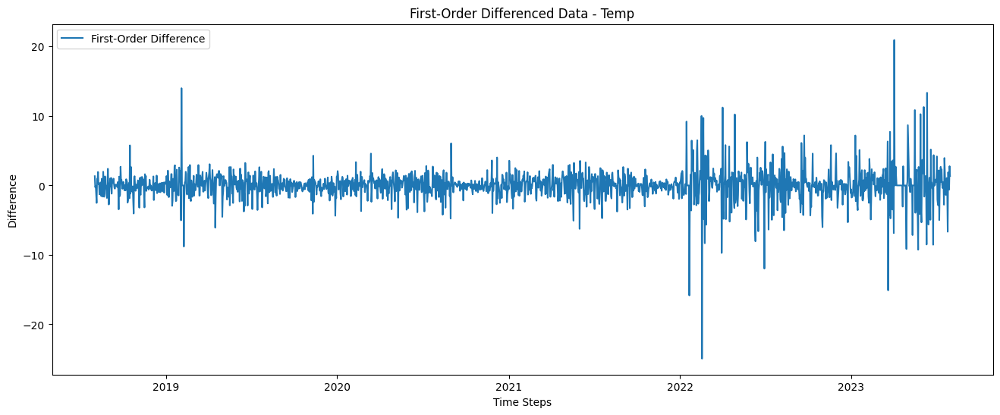

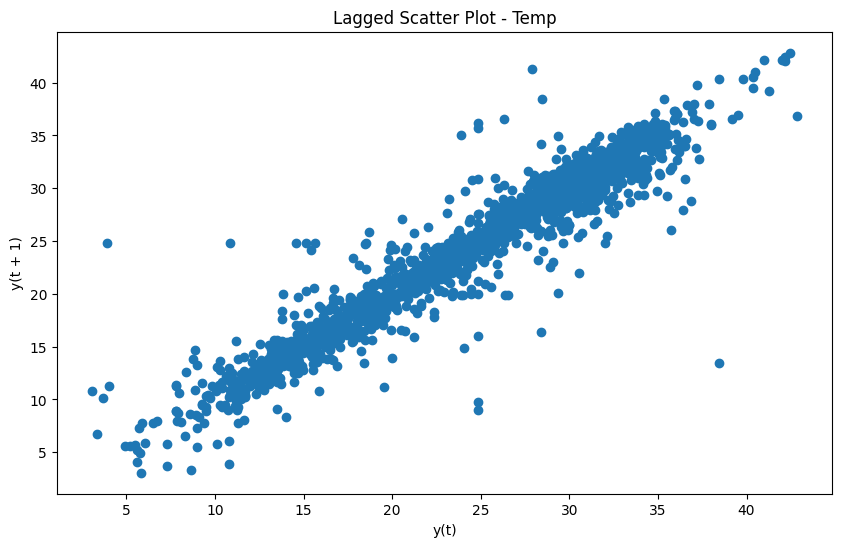

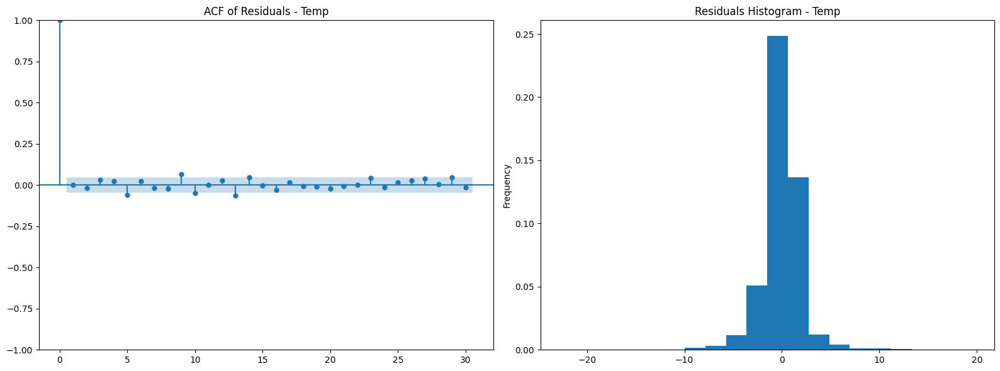

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


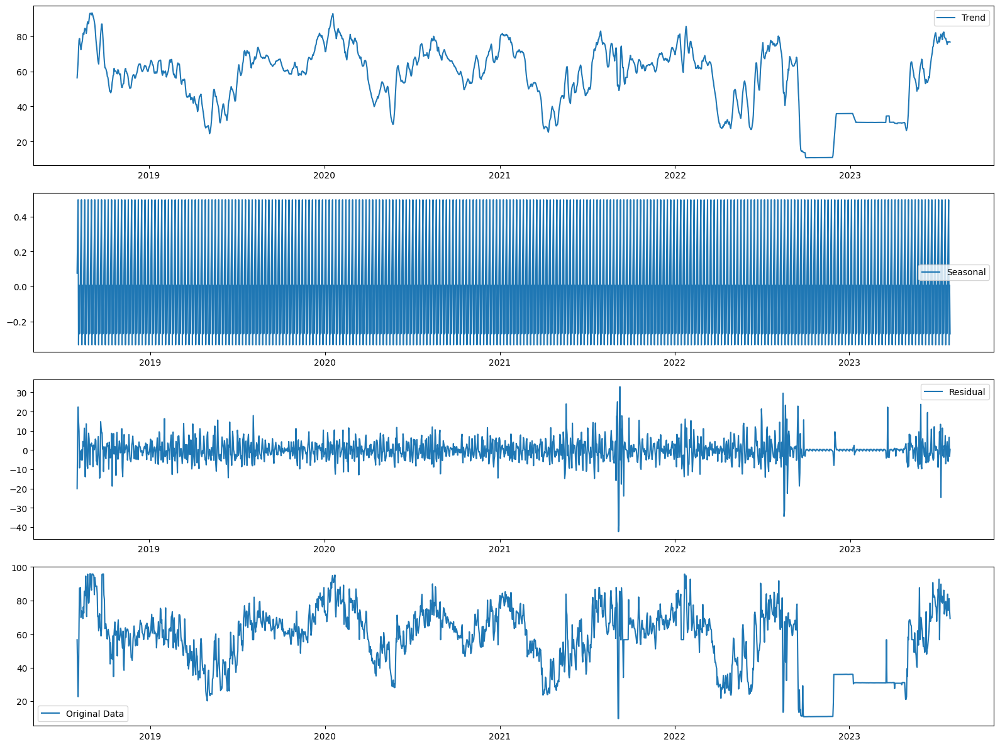

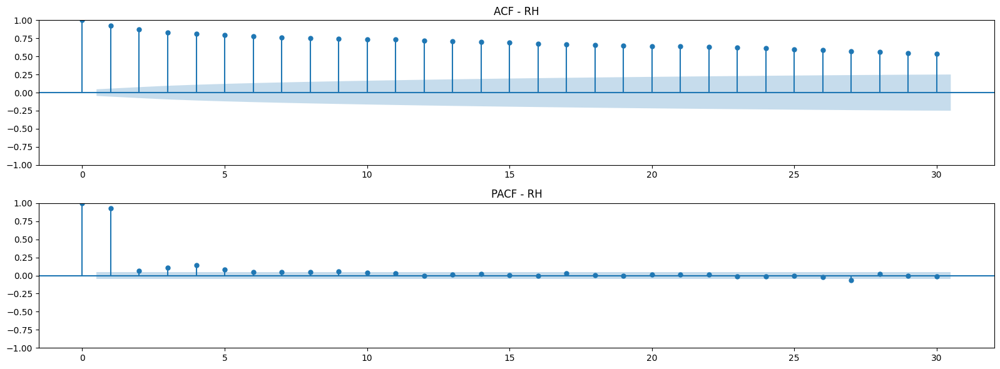

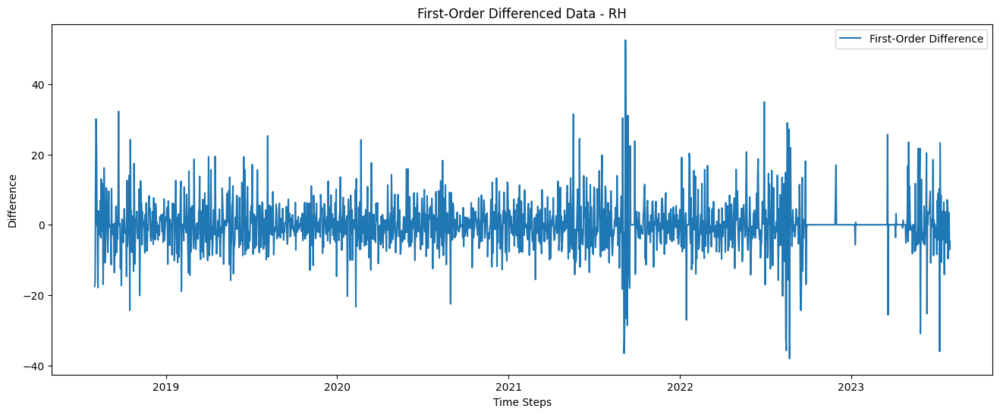

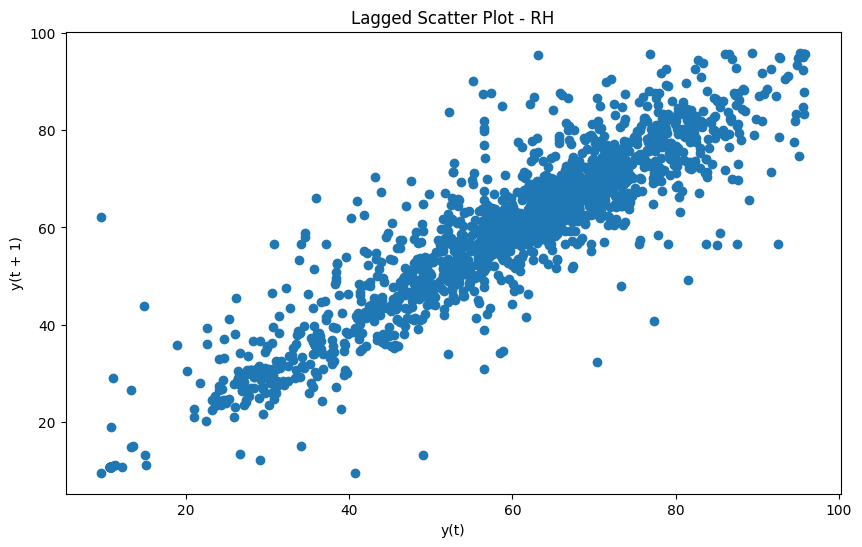

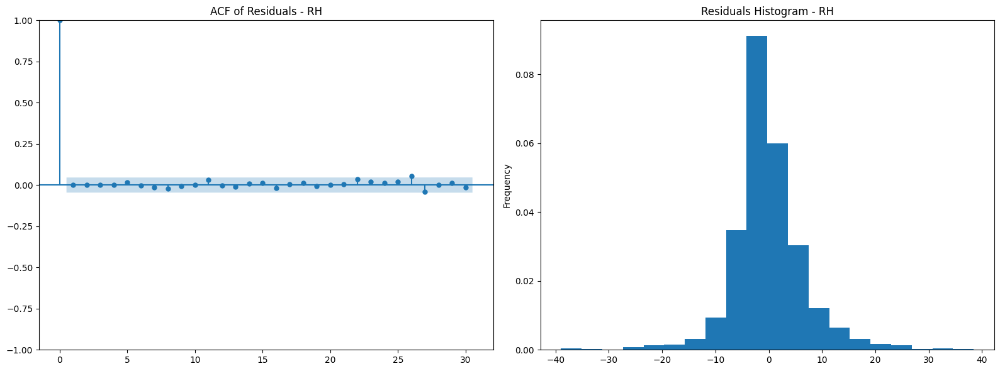

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\1.csv")

# Convert date column to datetime and set it as the index
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.set_index('From Date', inplace=True)


def fit_arima_and_forecast(data_col, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=(3, 0, 3))
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def plot_all_visualizations(data_col, results_ARIMA, forecast, forecast_steps, pollutant):
    

    # Seasonal Decomposition
    decomposition = seasonal_decompose(data_col, model='additive')
    plt.figure(figsize=(16, 12))
    plt.subplot(4, 1, 1)
    plt.plot(decomposition.trend, label='Trend')
    plt.legend()

    plt.subplot(4, 1, 2)
    plt.plot(decomposition.seasonal, label='Seasonal')
    plt.legend()

    plt.subplot(4, 1, 3)
    plt.plot(decomposition.resid, label='Residual')
    plt.legend()

    plt.subplot(4, 1, 4)
    plt.plot(data_col, label='Original Data')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # ACF and PACF plots
    plt.figure(figsize=(16, 6))
    plt.subplot(2, 1, 1)
    plot_acf(data_col, ax=plt.gca(), lags=30)
    plt.title(f'ACF - {pollutant}')

    plt.subplot(2, 1, 2)
    plot_pacf(data_col, ax=plt.gca(), lags=30)
    plt.title(f'PACF - {pollutant}')

    plt.tight_layout()
    plt.show()

    # Differenced Data
    diff_data = data_col.diff().dropna()
    plt.figure(figsize=(16, 6))
    plt.plot(diff_data, label='First-Order Difference')
    plt.xlabel('Time Steps')
    plt.ylabel('Difference')
    plt.title(f'First-Order Differenced Data - {pollutant}')
    plt.legend()
    plt.show()

    # Lagged Scatter Plot
    plt.figure(figsize=(10, 6))
    pd.plotting.lag_plot(data_col, lag=1)
    plt.title(f'Lagged Scatter Plot - {pollutant}')
    plt.show()

    # Residual Analysis
    residuals = data_col - results_ARIMA.fittedvalues
    plt.figure(figsize=(16, 6))
    plt.subplot(1, 2, 1)
    plot_acf(residuals, ax=plt.gca(), lags=30)
    plt.title(f'ACF of Residuals - {pollutant}')

    plt.subplot(1, 2, 2)
    residuals.plot(kind='hist', bins=20, density=True)
    plt.title(f'Residuals Histogram - {pollutant}')

    plt.tight_layout()
    plt.show()

# For each pollutant column, fit ARIMA and forecast
pollutants = ['PM2.5', 'PM10', 'NO2' , 'Temp' , 'RH']
forecast_steps = 50  # Define the number of forecast steps

for pollutant in pollutants:
    data_col = data[pollutant]
    
    results_ARIMA, forecast = fit_arima_and_forecast(data_col, forecast_steps)
    
    plot_all_visualizations(data_col, results_ARIMA, forecast, forecast_steps, pollutant)


 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
127.0.0.1 - - [15/Aug/2023 15:00:43] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [15/Aug/2023 15:00:44] "GET /favicon.ico HTTP/1.1" 404 -
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


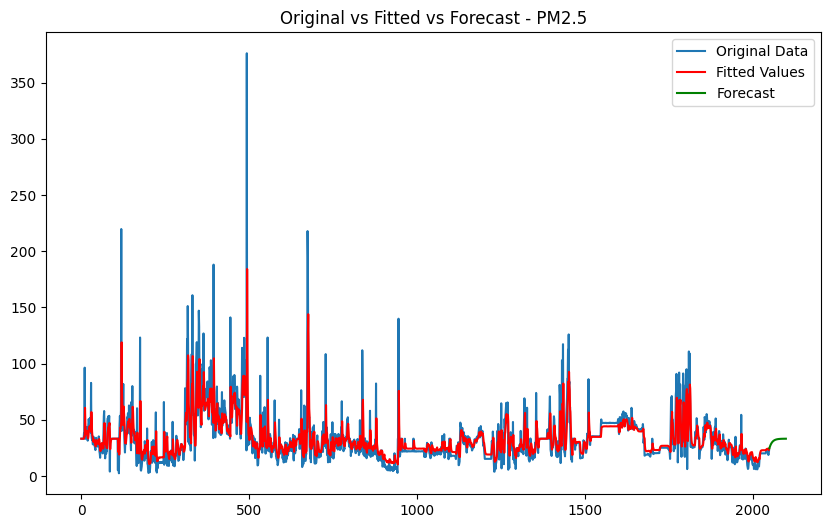

127.0.0.1 - - [15/Aug/2023 15:00:47] "GET /visualize/PM2.5 HTTP/1.1" 200 -
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


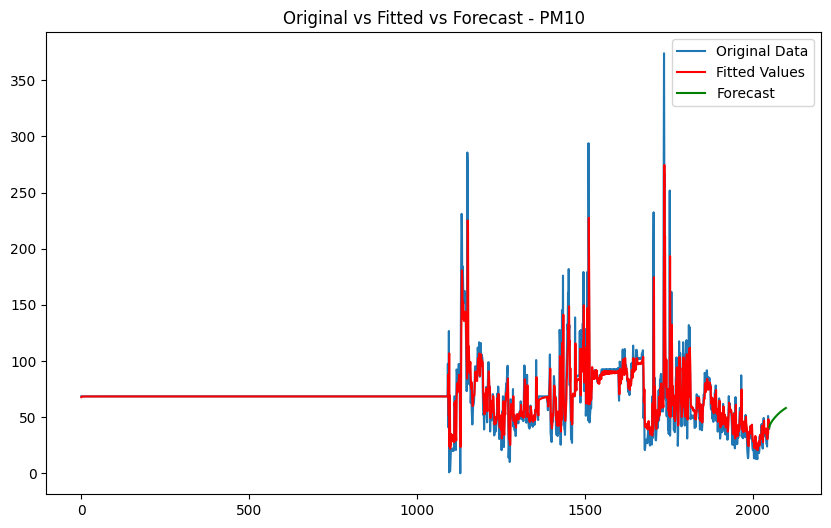

127.0.0.1 - - [15/Aug/2023 15:01:12] "GET /visualize/PM10 HTTP/1.1" 200 -


In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
import tkinter as tk
from tkinter import ttk
from flask import Flask, render_template_string

# Load your data
data = pd.read_excel(r"C:\Users\Moh\Downloads\pre process\1.xlsx")
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

app = Flask(__name__)

def fit_arima_and_forecast(data_col, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=(3, 0, 3))
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def plot_data_forecast(data_col, results_ARIMA, forecast, forecast_steps, title):
    plt.figure(figsize=(10, 6))
    plt.plot(data_col, label='Original Data')
    plt.plot(results_ARIMA.fittedvalues, color='red', label='Fitted Values')
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Forecast')
    plt.legend()
    plt.title(title)
    plt.show()

@app.route('/')
def home():
    return render_template_string(
        '''
        <!doctype html>
        <title>Visualizations</title>
        <h1>Choose a Pollutant</h1>
        <a href="/visualize/PM2.5">PM2.5</a><br>
        <a href="/visualize/PM10">PM10</a><br>
        <a href="/visualize/NO2">NO2</a><br>
        '''
    )

@app.route('/visualize/<pollutant>')
def visualize(pollutant):
    data_col = data[pollutant]
    forecast_steps = 50
    results_ARIMA, forecast = fit_arima_and_forecast(data_col, forecast_steps)
    title = f'Original vs Fitted vs Forecast - {pollutant}'
    plot_data_forecast(data_col, results_ARIMA, forecast, forecast_steps, title)
    return f'Visualizations for {pollutant}'

if __name__ == '__main__':
    app.run()


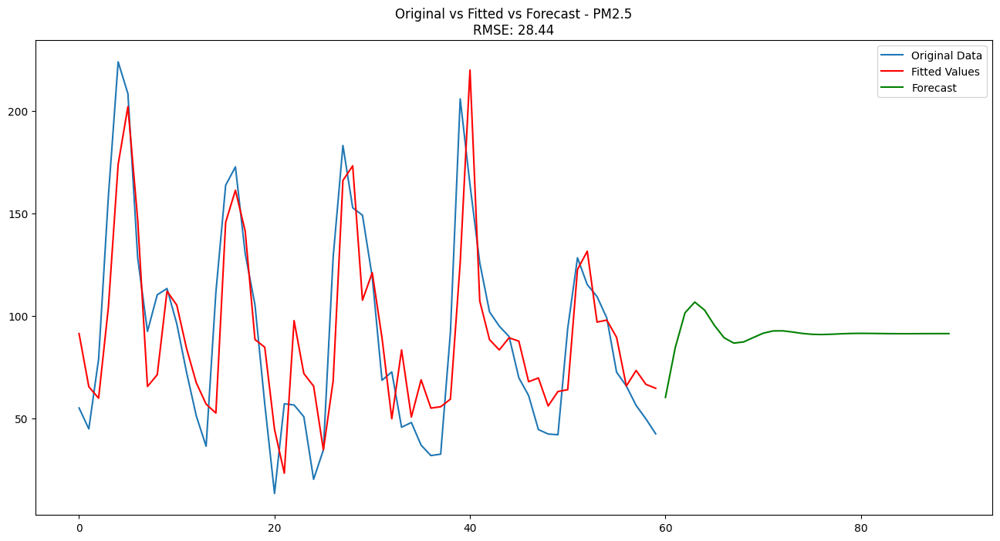

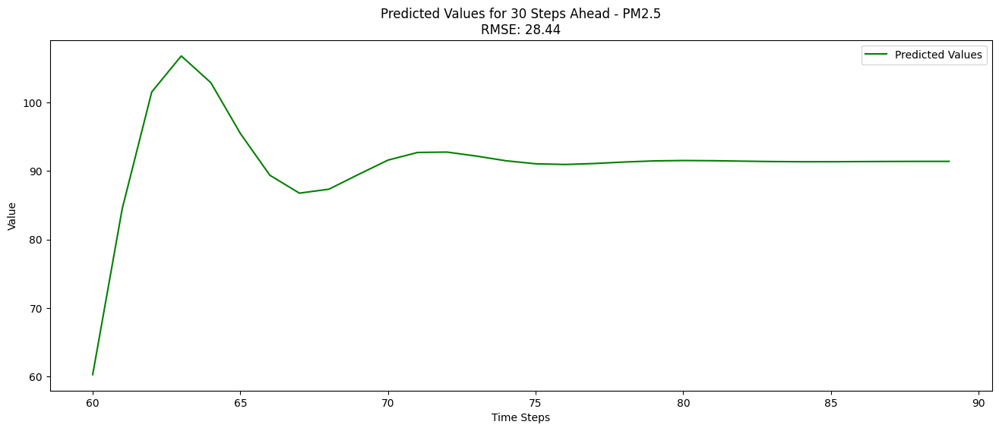

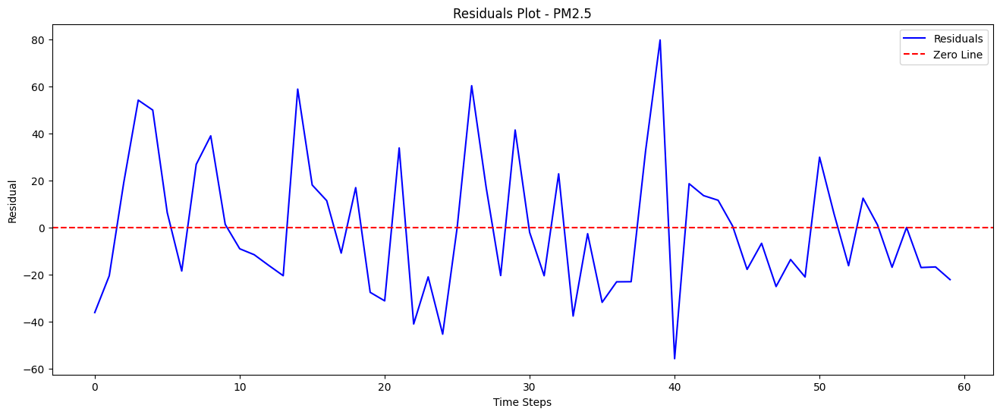

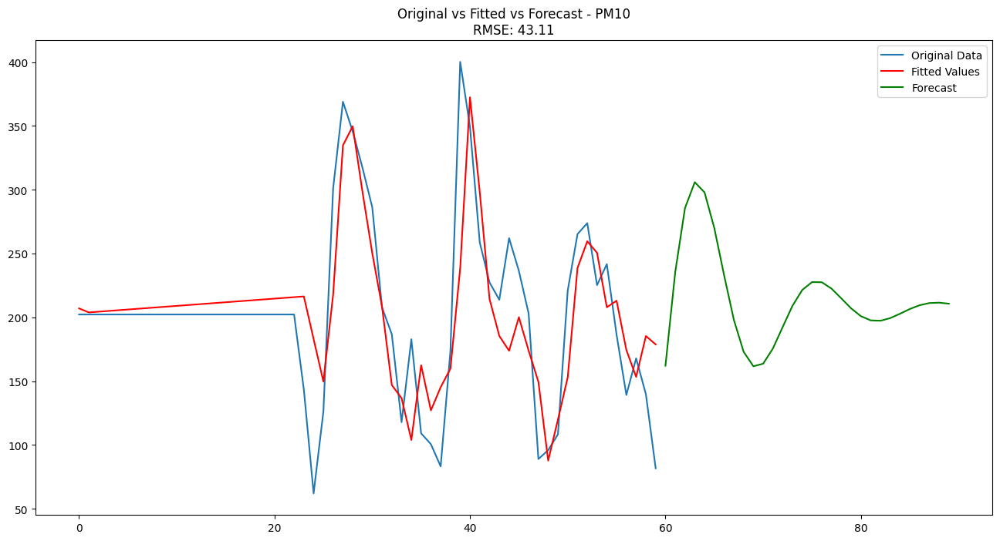

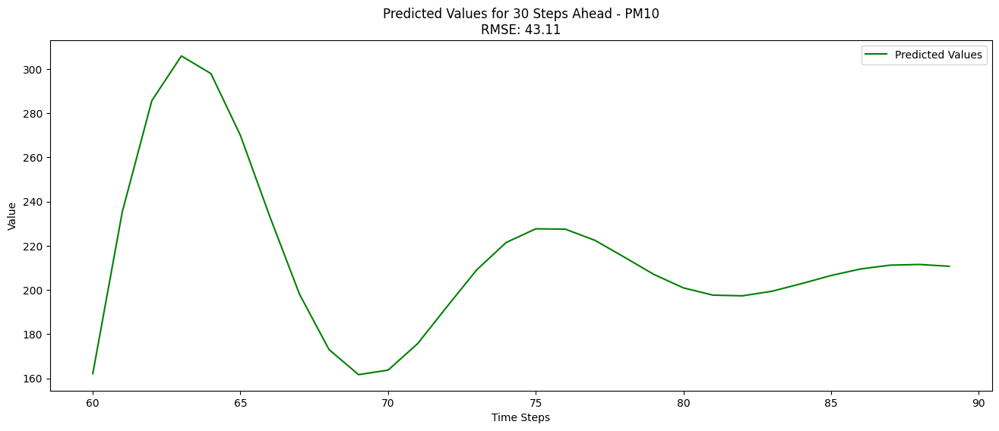

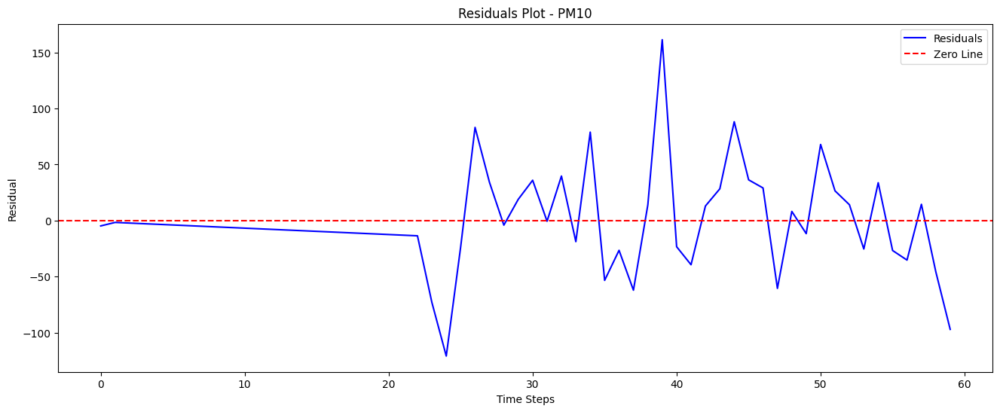

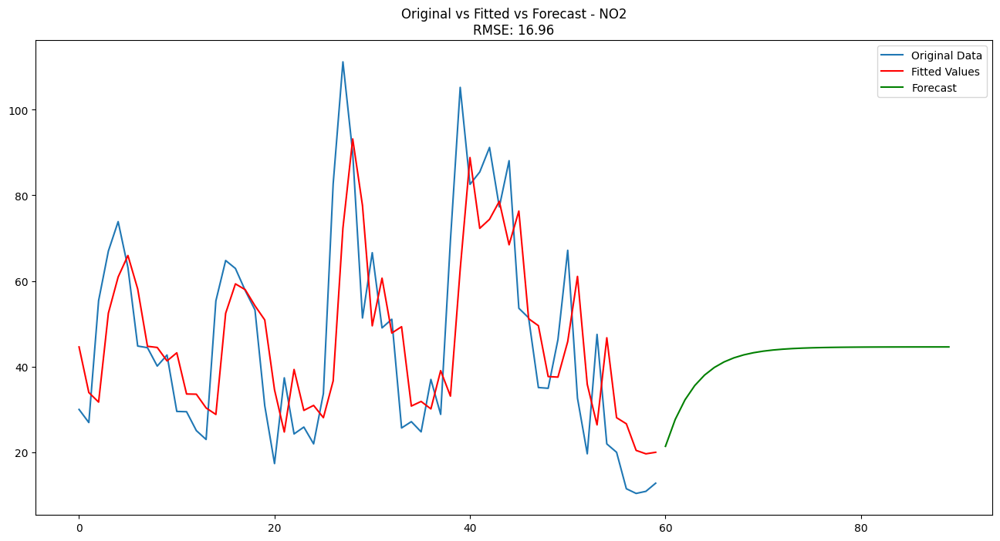

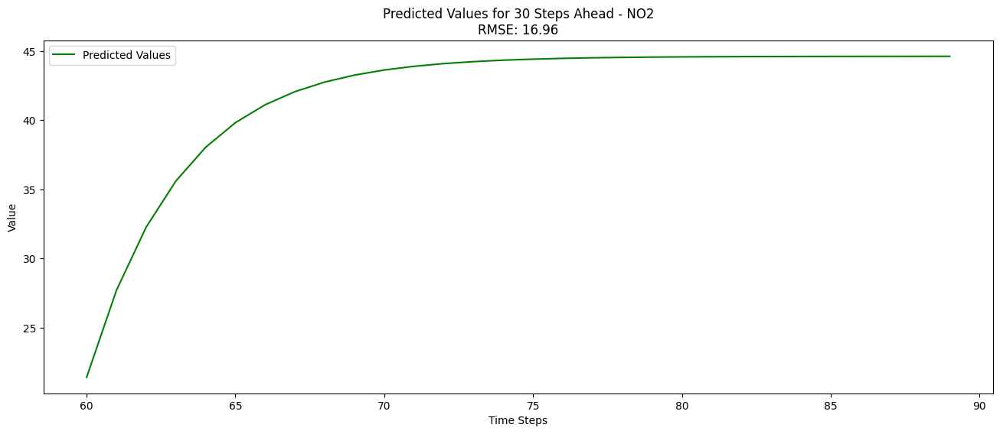

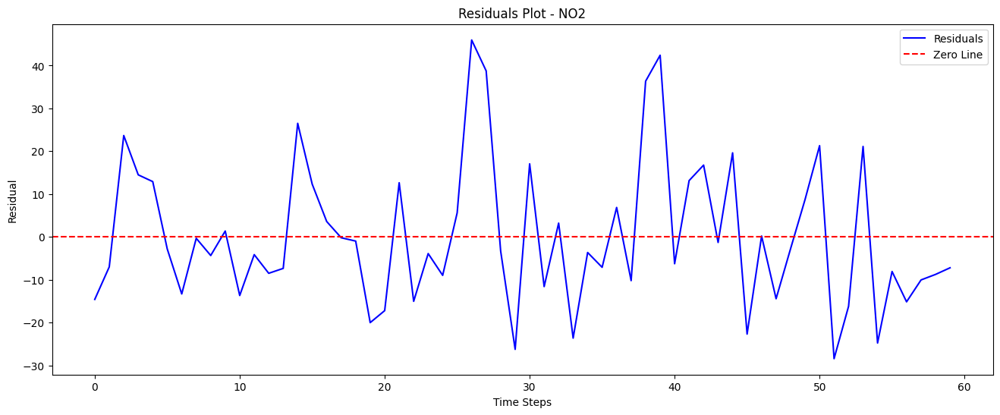

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


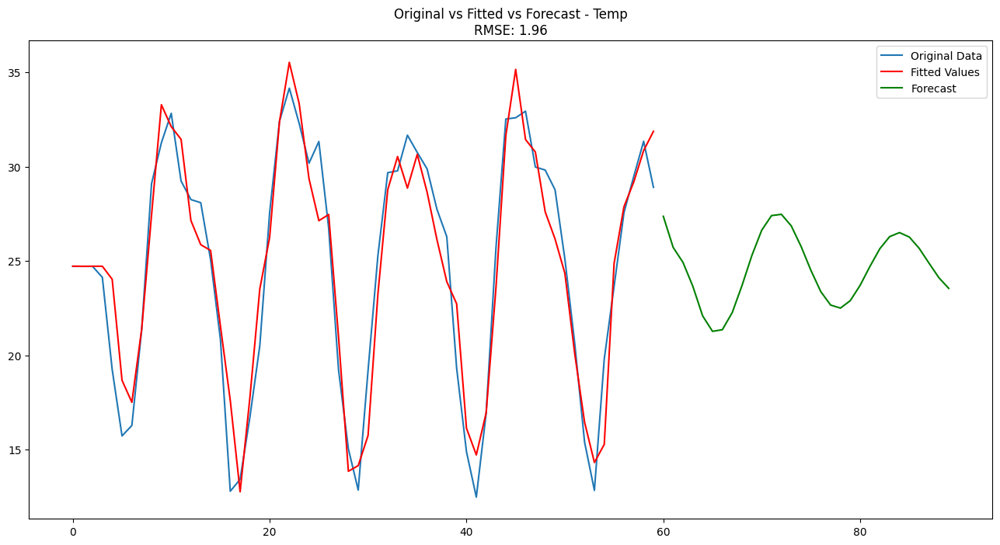

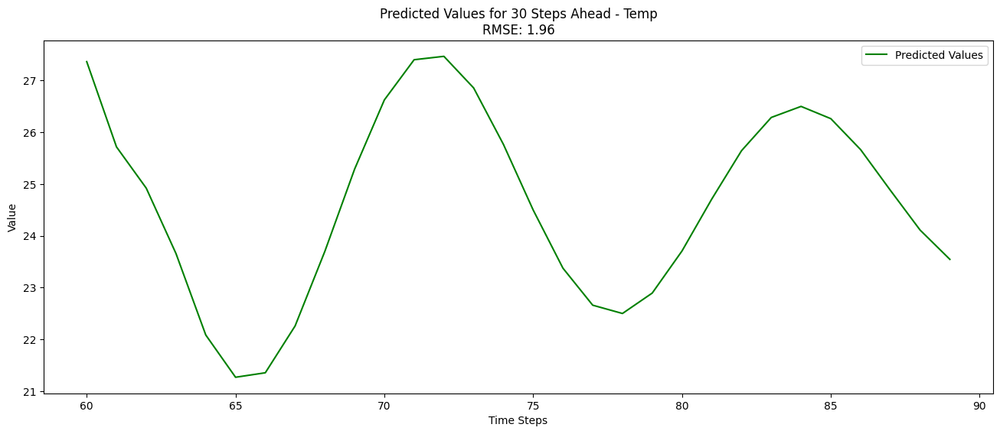

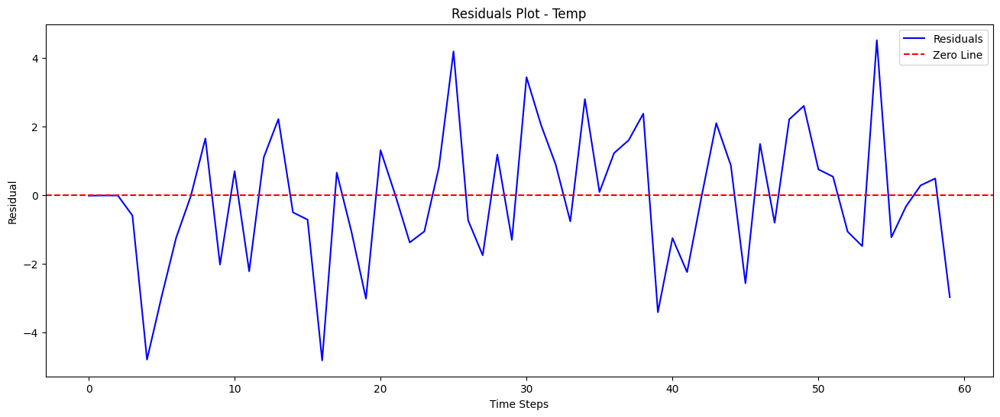

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


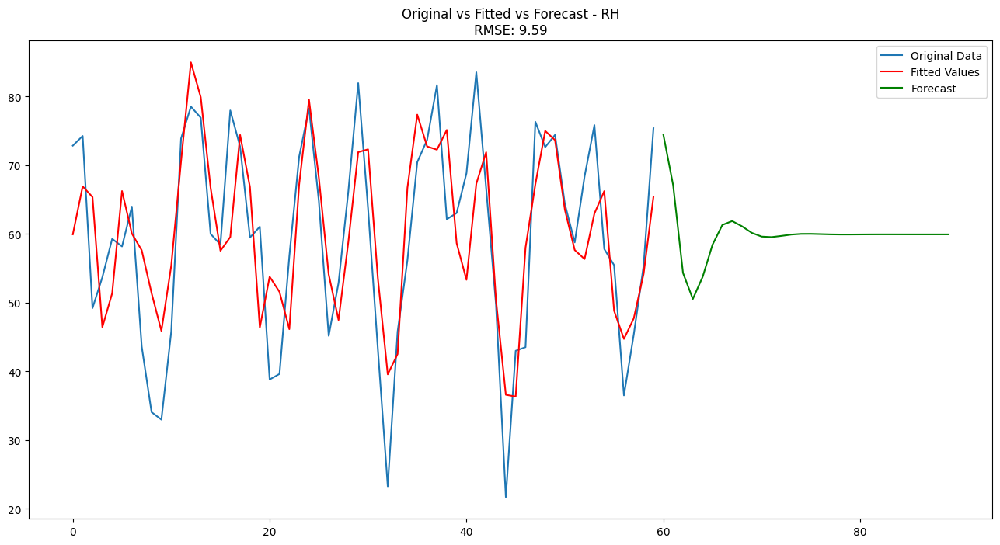

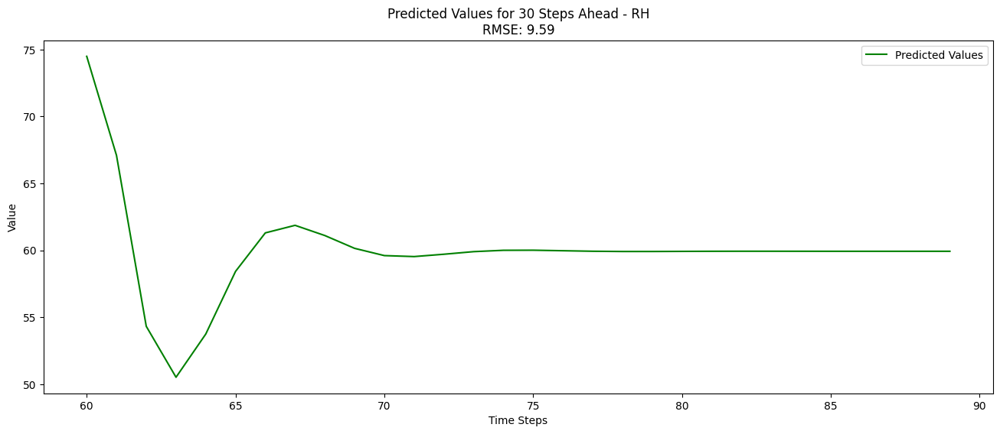

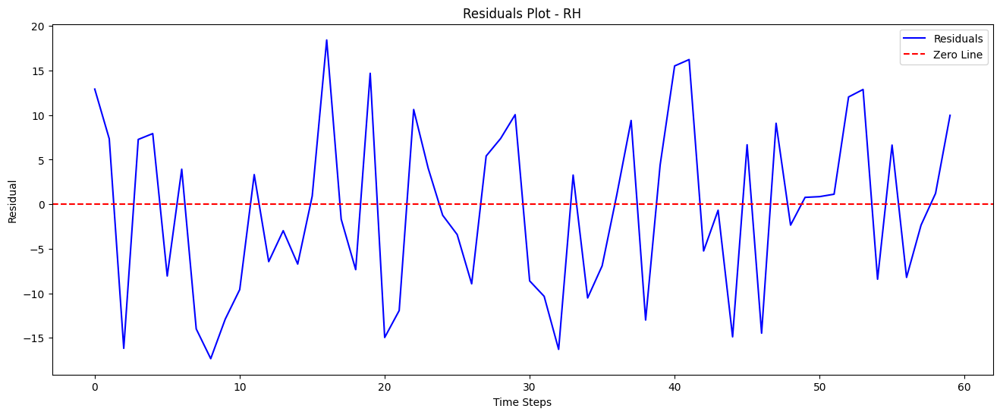

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
import numpy as np

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\Dilshad_Garden.csv")

# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

def fit_arima_and_forecast(data_col, order, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=order)
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def automated_arima(data_col, forecast_steps):
    model = auto_arima(data_col, seasonal=False, suppress_warnings=True)
    order = model.order
    results_ARIMA, forecast = fit_arima_and_forecast(data_col, order, forecast_steps)
    return results_ARIMA, forecast

# For each pollutant column, fit ARIMA and forecast
pollutants = ['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']
forecast_steps = 30  # Define the number of forecast steps to 30

for pollutant in pollutants:
    data_col = data[pollutant]

    results_ARIMA, forecast = automated_arima(data_col, forecast_steps)

    # Calculate RMSE
    rmse = np.sqrt(((results_ARIMA.fittedvalues - data_col) ** 2).mean())

    # Plotting the original data, fitted values, and forecast
    plt.figure(figsize=(16, 8))
    plt.plot(data_col, label='Original Data')
    plt.plot(results_ARIMA.fittedvalues, color='red', label='Fitted Values')
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Forecast')
    plt.legend()
    plt.title(f"Original vs Fitted vs Forecast - {pollutant}\nRMSE: {rmse:.2f}")
    plt.show()

    # Plotting the predicted values for 30 steps
    plt.figure(figsize=(16, 6))
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Predicted Values')
    plt.xlabel('Time Steps')
    plt.ylabel('Value')
    plt.title(f'Predicted Values for {forecast_steps} Steps Ahead - {pollutant}\nRMSE: {rmse:.2f}')
    plt.legend()
    plt.show()

    # Plotting residuals
    residuals = data_col - results_ARIMA.fittedvalues
    plt.figure(figsize=(16, 6))
    plt.plot(residuals, color='blue', label='Residuals')
    plt.axhline(y=0, color='red', linestyle='--', label='Zero Line')
    plt.xlabel('Time Steps')
    plt.ylabel('Residual')
    plt.title(f'Residuals Plot - {pollutant}')
    plt.legend()
    plt.show()


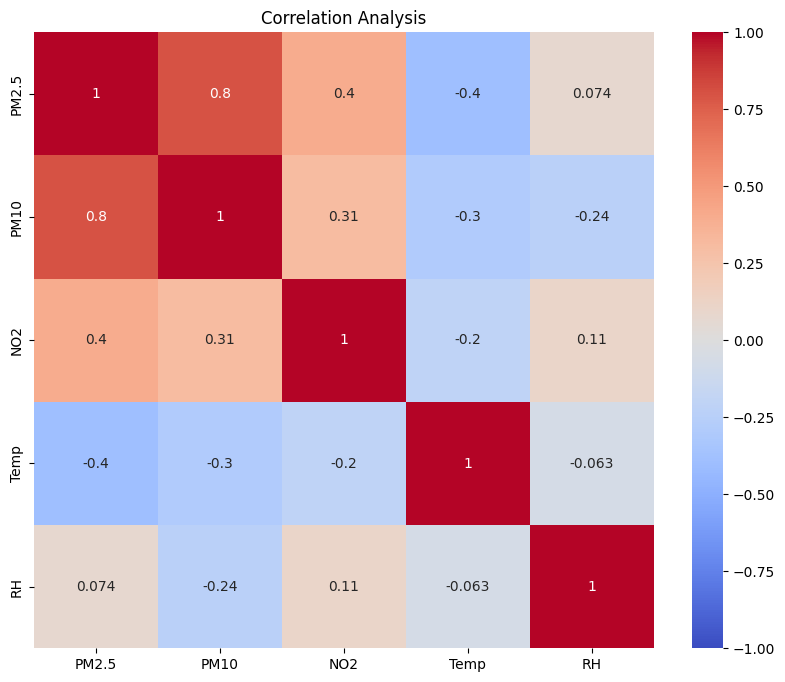

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\1.csv")

# Extract relevant columns
relevant_columns = ['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']
relevant_data = data[relevant_columns]

# Calculate correlation matrix
correlation_matrix = relevant_data.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Analysis')
plt.show()


             PM2.5         PM10          NO2         Temp           RH
count  1826.000000  1826.000000  1826.000000  1826.000000  1826.000000
mean    108.416294   218.014497    39.943173    24.845647    56.568067
std      85.492241   129.188313    29.372160     7.507347    18.929223
min       1.000000     1.000000     1.060000     3.060000     9.620000
25%      45.190000   114.307500    21.792500    19.340000    43.962500
50%      79.465000   204.325000    36.240000    26.250000    60.245000
75%     145.800000   297.922500    45.680000    31.007500    69.602500
max     631.850000  1000.000000   276.460000    42.830000    95.880000


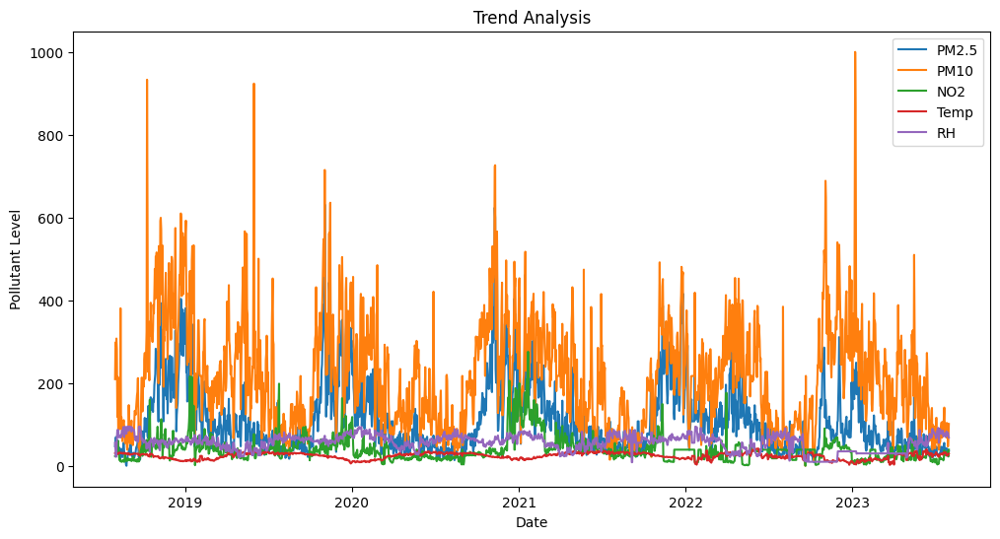

C:\Users\Moh\AppData\Local\Temp\ipykernel_20848\3637341930.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=data['From Date'], y=data['PM2.5'], estimator='mean', ci=None)


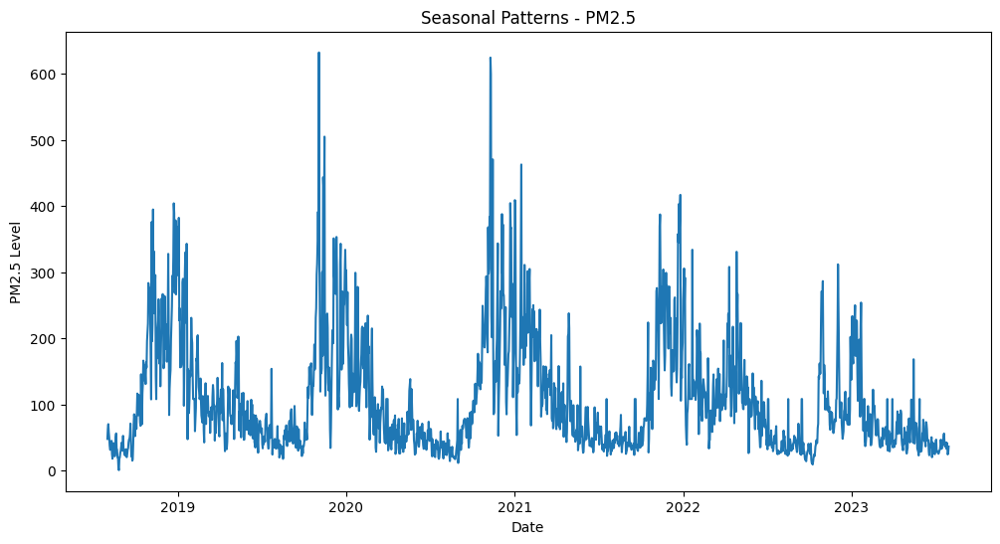

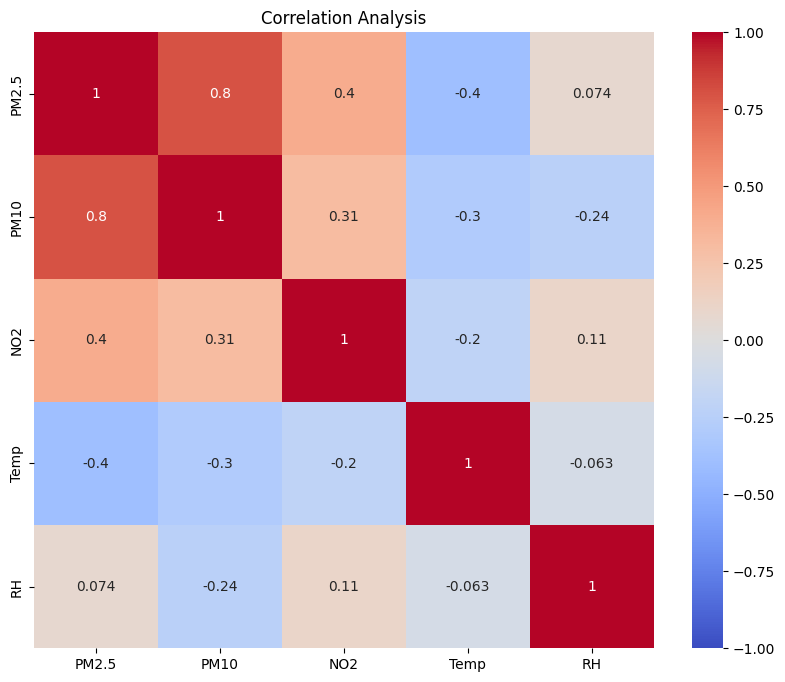

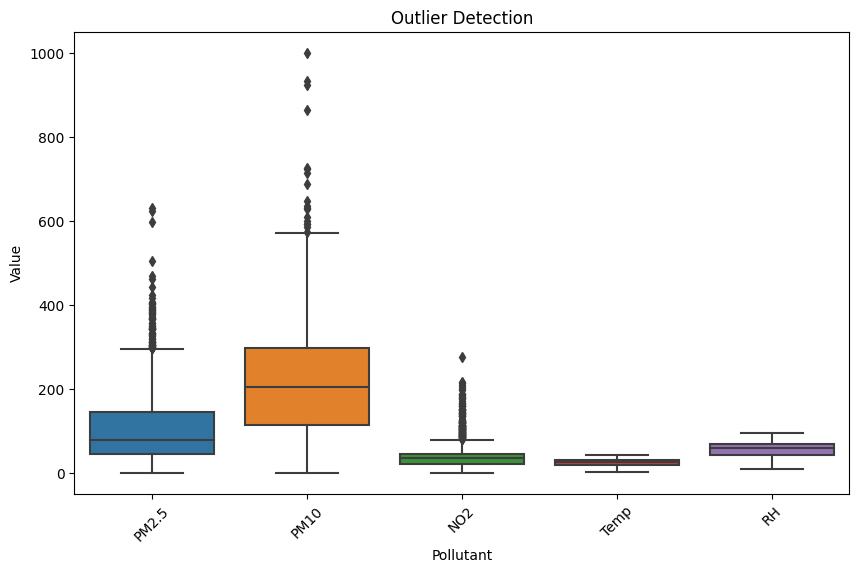

C:\Users\Moh\AppData\Local\Temp\ipykernel_20848\3637341930.py:57: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(len(pollutants), 1, i)


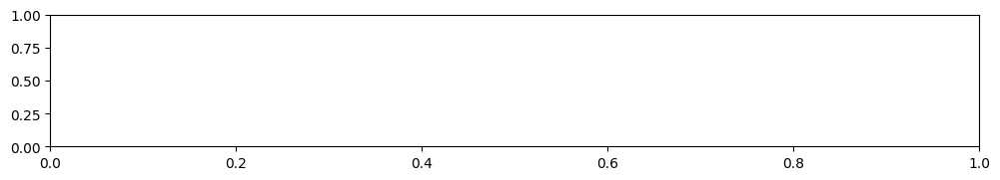

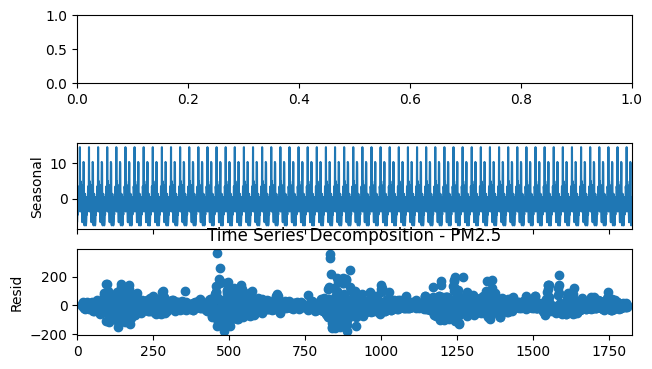

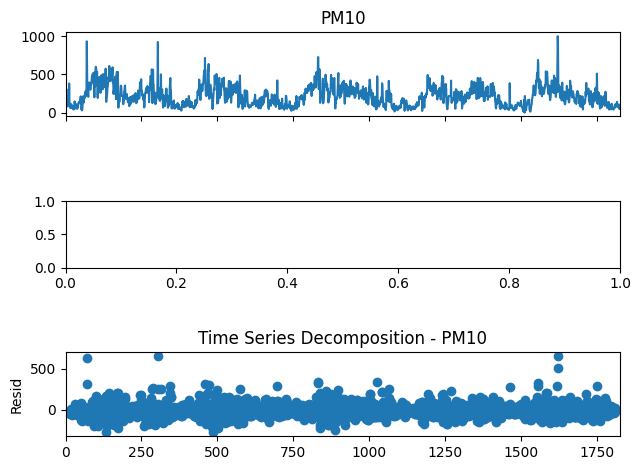

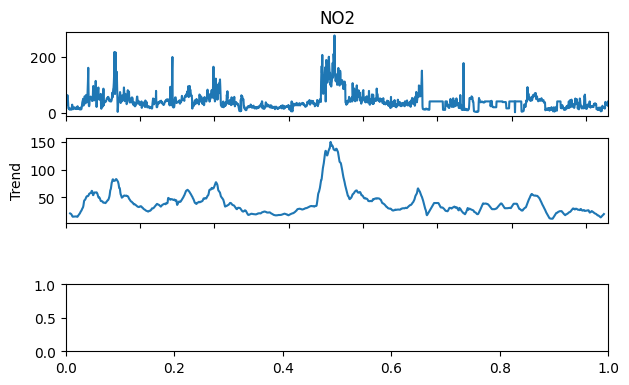

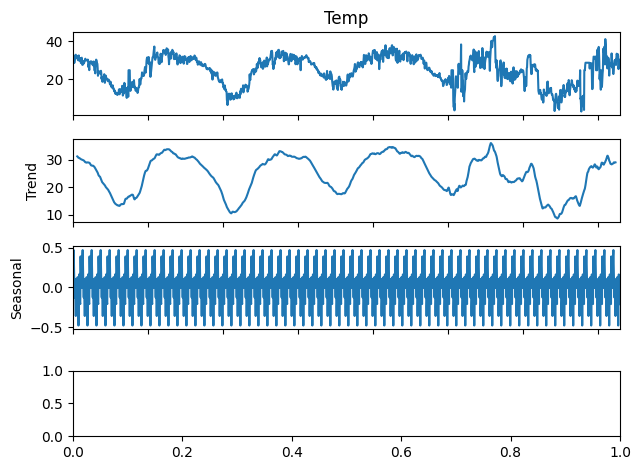

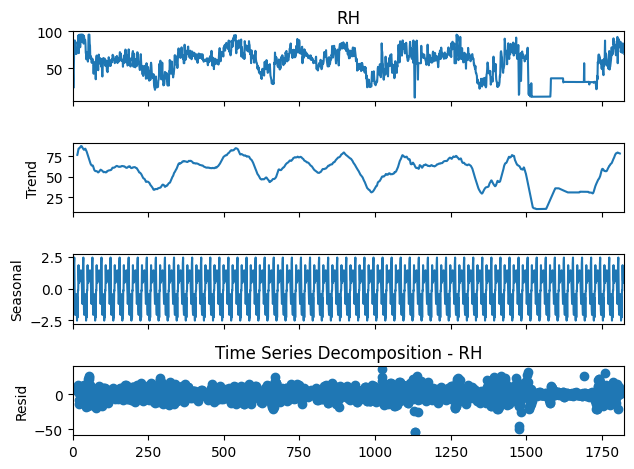

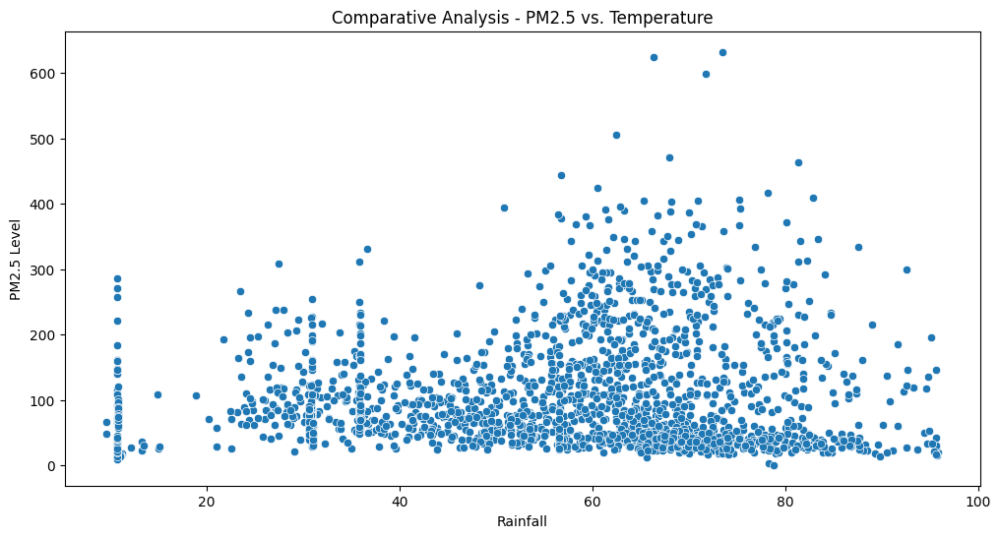

C:\Users\Moh\AppData\Local\Temp\ipykernel_20848\3637341930.py:78: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


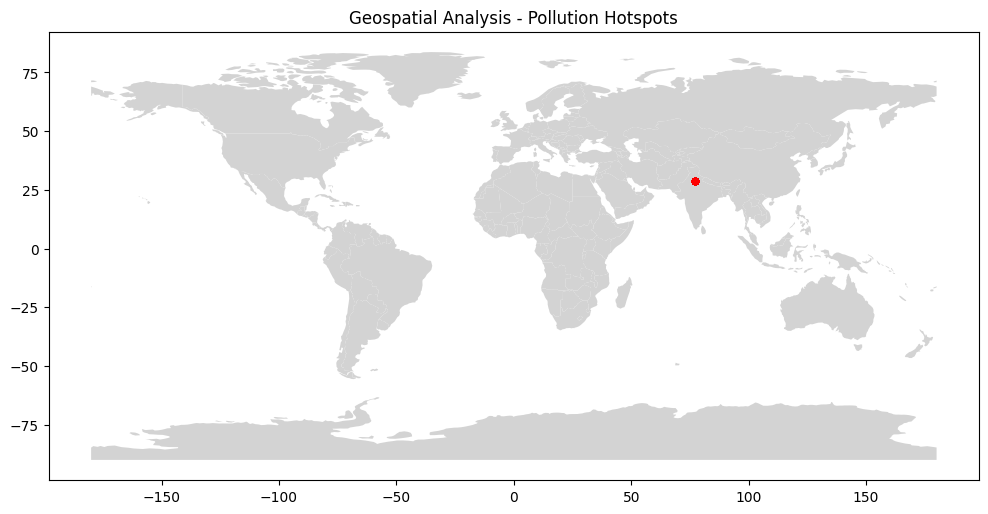

In [31]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Load your data (assuming you've already loaded and preprocessed the data)
data = pd.read_csv(r"D:\Sandipan\Final\1.csv")

# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

# Pollutants to analyze
pollutants = ['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']

# 1. Descriptive Statistics
descriptive_stats = data[pollutants].describe()
print(descriptive_stats)

# 2. Trend Analysis
plt.figure(figsize=(12, 6))
for pollutant in pollutants:
    plt.plot(data['From Date'], data[pollutant], label=pollutant)
plt.xlabel('Date')
plt.ylabel('Pollutant Level')
plt.title('Trend Analysis')
plt.legend()
plt.show()

# 3. Seasonal Patterns
plt.figure(figsize=(12, 6))
sns.lineplot(x=data['From Date'], y=data['PM2.5'], estimator='mean', ci=None)
plt.xlabel('Date')
plt.ylabel('PM2.5 Level')
plt.title('Seasonal Patterns - PM2.5')
plt.show()

# 4. Correlation Analysis
correlation_matrix = data[pollutants].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Analysis')
plt.show()

# 5. Outlier Detection (Box Plot)
plt.figure(figsize=(10, 6))
sns.boxplot(data=data[pollutants])
plt.xlabel('Pollutant')
plt.ylabel('Value')
plt.title('Outlier Detection')
plt.xticks(rotation=45)
plt.show()

# 6. Time Series Decomposition
plt.figure(figsize=(12, 10))
for i, pollutant in enumerate(pollutants, 1):
    plt.subplot(len(pollutants), 1, i)
    decomposition = seasonal_decompose(data[pollutant], model='additive', period=30)  # Assuming daily data
    decomposition.plot()
    plt.title(f"Time Series Decomposition - {pollutant}")
plt.tight_layout()
plt.show()

# 7. Comparative Analysis (PM2.5 vs. Temp)
plt.figure(figsize=(12, 6))
sns.scatterplot(x=data['RH'], y=data['PM2.5'])
plt.xlabel('Rainfall')
plt.ylabel('PM2.5 Level')
plt.title('Comparative Analysis - PM2.5 vs. Temperature')
plt.show()

# 9. Geospatial Analysis (if you have latitude and longitude columns)
import geopandas as gpd
from shapely.geometry import Point

geometry = [Point(xy) for xy in zip(data['Longitude'], data['Latitude'])]
gdf = gpd.GeoDataFrame(data, geometry=geometry)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

fig, ax = plt.subplots(figsize=(12, 8))
world.plot(ax=ax, color='lightgrey')
gdf.plot(ax=ax, markersize=20, color='red', alpha=0.7)
plt.title('Geospatial Analysis - Pollution Hotspots')
plt.show()


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import plotly.express as px


In [5]:
# Load the CSV file into a pandas DataFrame
data = pd.read_csv(r"D:\Sandipan\Final\1.csv")

# Display basic information about the DataFrame
print(data.info())
print(data.head())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   From Date  1826 non-null   object 
 1   Latitude   1826 non-null   float64
 2   Longitude  1826 non-null   float64
 3   PM2.5      1826 non-null   float64
 4   PM10       1826 non-null   float64
 5   NO2        1826 non-null   float64
 6   Temp       1826 non-null   float64
 7   RH         1826 non-null   float64
dtypes: float64(7), object(1)
memory usage: 114.3+ KB
None
    From Date  Latitude  Longitude  PM2.5    PM10    NO2   Temp     RH
0  01/08/2018  28.75005  77.111261  48.14  210.13  24.10  31.51  56.54
1  02/08/2018  28.75005  77.111261  63.71  298.48  24.28  32.84  38.98
2  03/08/2018  28.75005  77.111261  70.47  291.24  23.87  32.59  22.63
3  04/08/2018  28.75005  77.111261  58.23  308.24  29.22  32.54  35.96
4  05/08/2018  28.75005  77.111261  50.05  282.07  36.26  31.17  66.06


In [6]:
# Get basic statistics for numerical columns
basic_stats = data.describe()
print(basic_stats)


           Latitude    Longitude        PM2.5         PM10          NO2  \
count  1.826000e+03  1826.000000  1826.000000  1826.000000  1826.000000   
mean   2.875005e+01    77.111261   108.416294   218.014497    39.943173   
std    3.553687e-15     0.000000    85.492241   129.188313    29.372160   
min    2.875005e+01    77.111261     1.000000     1.000000     1.060000   
25%    2.875005e+01    77.111261    45.190000   114.307500    21.792500   
50%    2.875005e+01    77.111261    79.465000   204.325000    36.240000   
75%    2.875005e+01    77.111261   145.800000   297.922500    45.680000   
max    2.875005e+01    77.111261   631.850000  1000.000000   276.460000   

              Temp           RH  
count  1826.000000  1826.000000  
mean     24.845647    56.568067  
std       7.507347    18.929223  
min       3.060000     9.620000  
25%      19.340000    43.962500  
50%      26.250000    60.245000  
75%      31.007500    69.602500  
max      42.830000    95.880000  


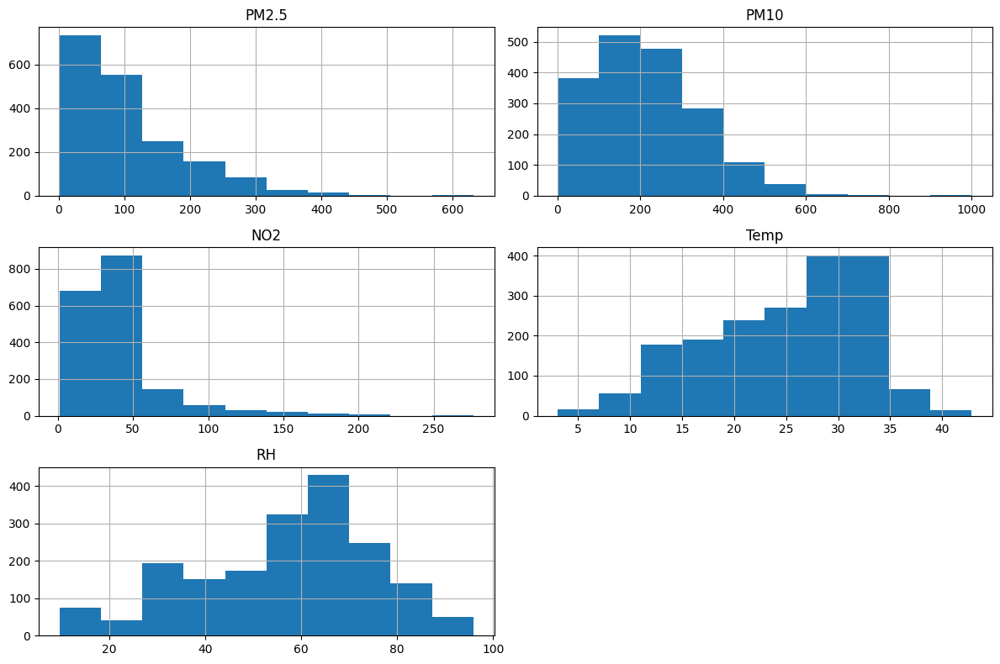

In [7]:
# Plot histograms for PM2.5, PM10, NO2, Temp, and RH
data[['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']].hist(bins=10, figsize=(12, 8))
plt.tight_layout()
plt.show()


C:\Users\Moh\AppData\Local\Temp\ipykernel_20120\996858994.py:6: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


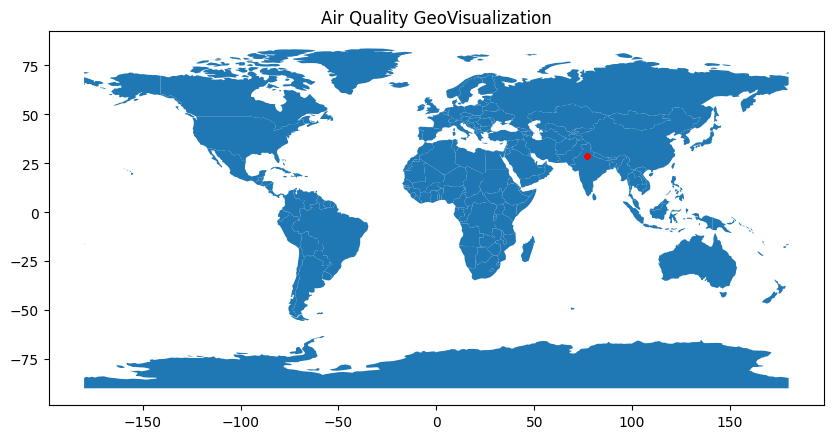

In [10]:
# Create a GeoDataFrame using latitude and longitude
geometry = gpd.points_from_xy(data['Longitude'], data['Latitude'])
gdf = gpd.GeoDataFrame(data, geometry=geometry)

# Plot the data on a map using GeoPandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
ax = world.plot(figsize=(10, 8))
gdf.plot(ax=ax, color='red', markersize=10)
plt.title('Air Quality GeoVisualization')
plt.show()


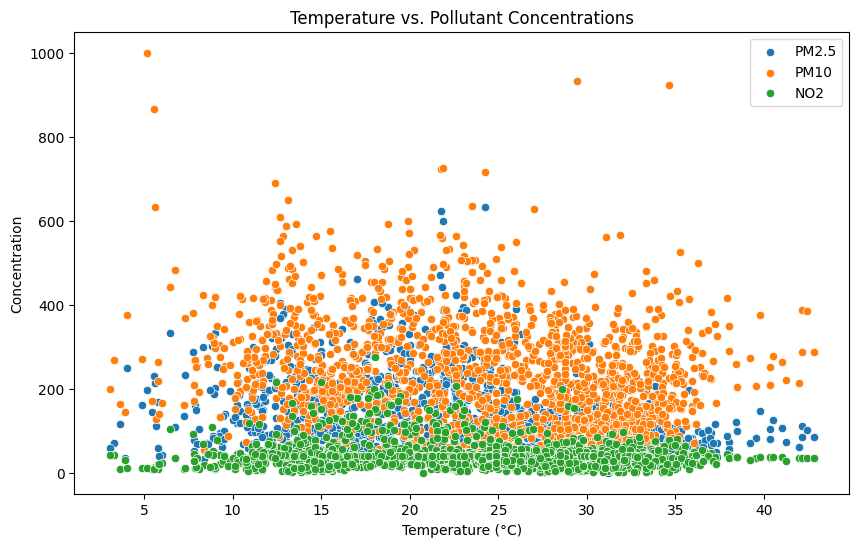

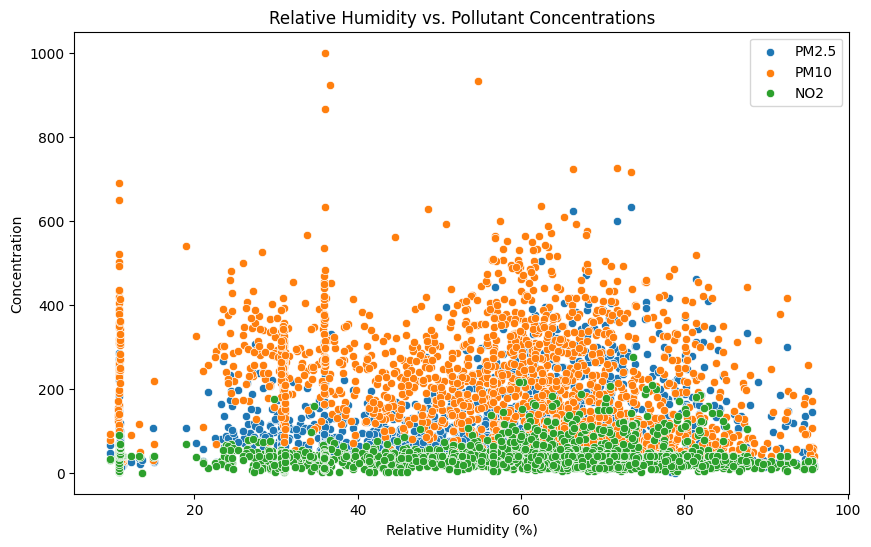

In [11]:
# Create a scatter plot comparing Temp with PM2.5, PM10, and NO2
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temp', y='PM2.5', data=data)
sns.scatterplot(x='Temp', y='PM10', data=data)
sns.scatterplot(x='Temp', y='NO2', data=data)
plt.legend(['PM2.5', 'PM10', 'NO2'])
plt.xlabel('Temperature (°C)')
plt.ylabel('Concentration')
plt.title('Temperature vs. Pollutant Concentrations')
plt.show()

# Create a scatter plot comparing RH with PM2.5, PM10, and NO2
plt.figure(figsize=(10, 6))
sns.scatterplot(x='RH', y='PM2.5', data=data)
sns.scatterplot(x='RH', y='PM10', data=data)
sns.scatterplot(x='RH', y='NO2', data=data)
plt.legend(['PM2.5', 'PM10', 'NO2'])
plt.xlabel('Relative Humidity (%)')
plt.ylabel('Concentration')
plt.title('Relative Humidity vs. Pollutant Concentrations')
plt.show()


c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


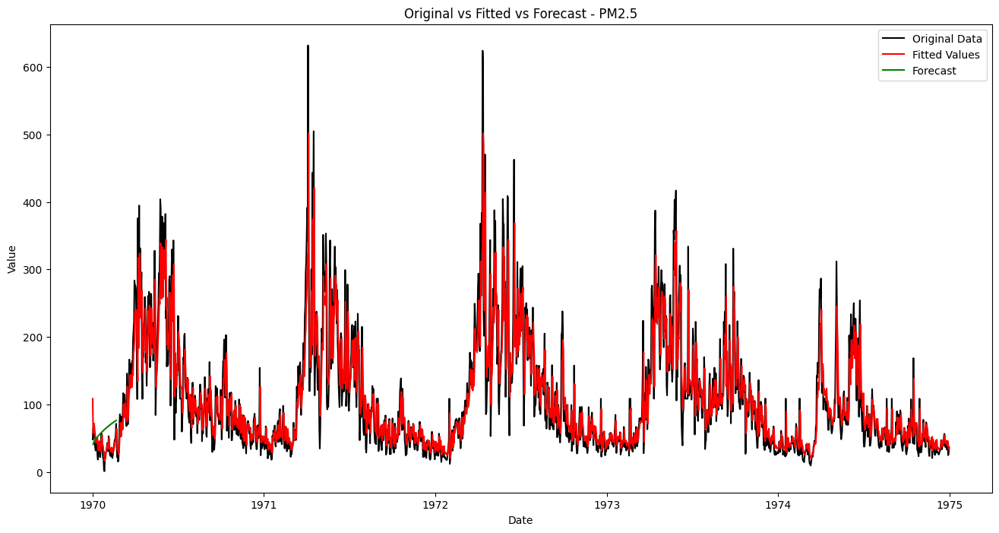

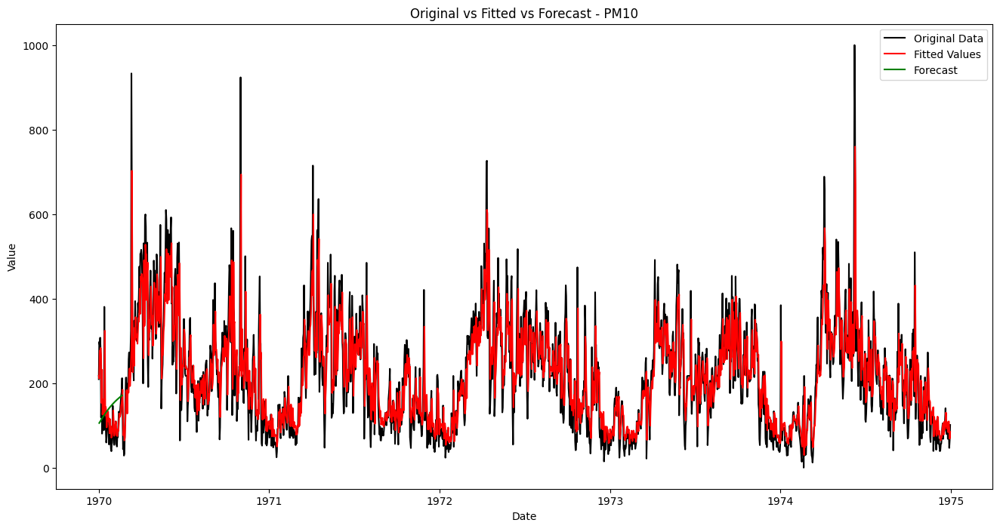

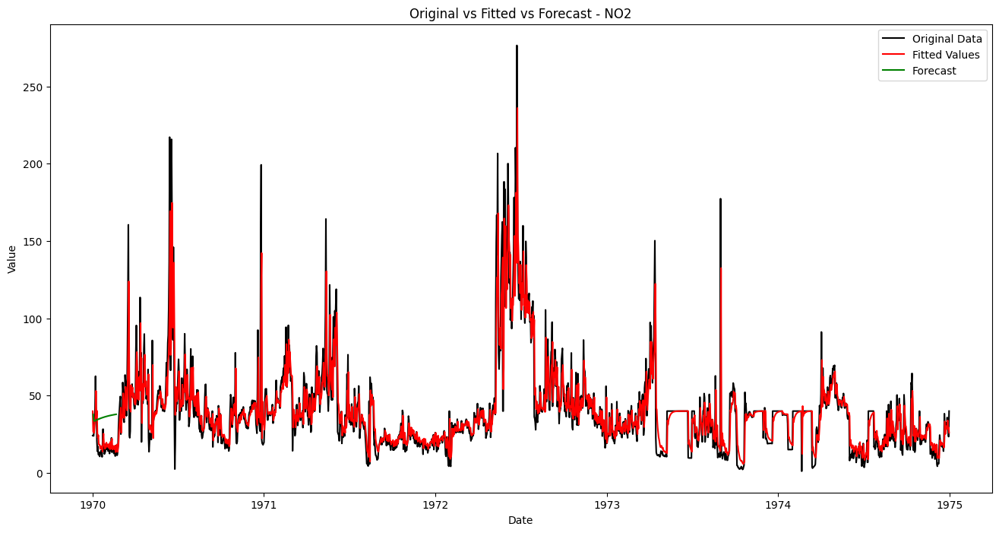

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


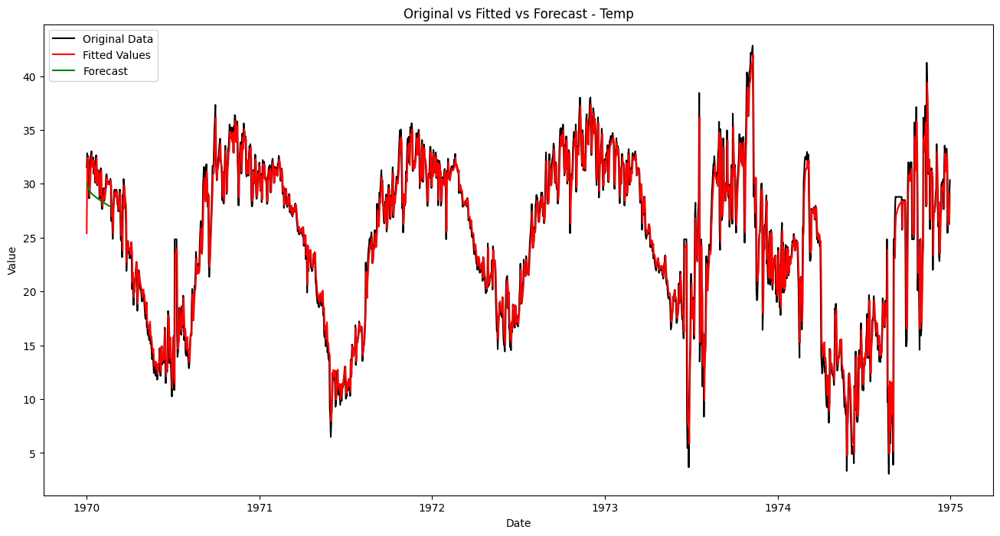

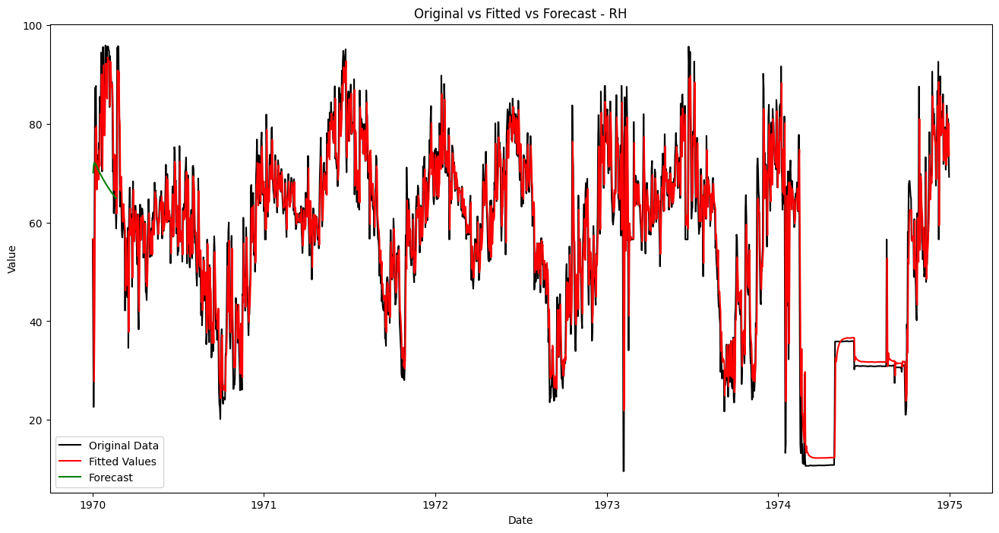

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ValueError: x and y must have same first dimension, but have shapes (304,) and (306,)

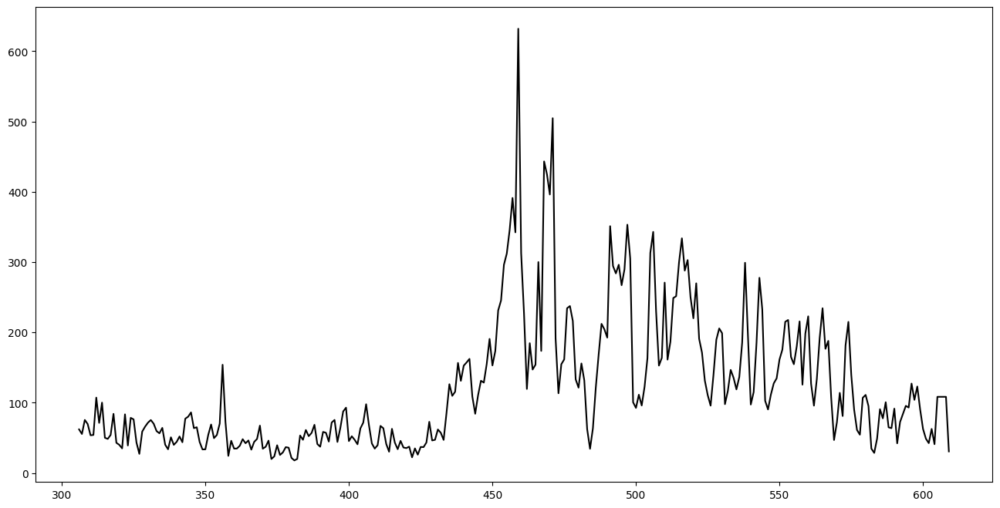

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit
import numpy as np

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\1.csv")

# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

def fit_arima_and_forecast(data_col, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=(3, 0, 3))
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

# ... (previous code)

def plot_data_forecast(data_col, results_ARIMA, forecast, forecast_steps):
    plt.figure(figsize=(16, 8))
    
    # Plot the original data
    plt.plot(data_col.index, data_col.values, label='Original Data', color='black')
    
    # Plot the fitted values
    plt.plot(data_col.index, results_ARIMA.fittedvalues, color='red', label='Fitted Values')
    
    # Plot the forecast
    forecast_index = pd.date_range(start=data_col.index[-1], periods=forecast_steps+1, freq='D')[1:]
    plt.plot(forecast_index, forecast, color='green', label='Forecast')
    
    plt.legend()
    plt.title(f"Original vs Fitted vs Forecast - {data_col.name}")
    plt.xlabel("Date")
    plt.ylabel("Value")
    plt.show()

# ... (previous code)

# For each pollutant column, fit ARIMA, forecast, and visualize
pollutants = ['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']
forecast_steps = 50  # Define the number of forecast steps

for pollutant in pollutants:
    data_col = data[pollutant]

    results_ARIMA, forecast = fit_arima_and_forecast(data_col, forecast_steps)

    # Plot data, fitted values, and forecast for the selected pollutant
    plot_data_forecast(data_col, results_ARIMA, forecast, forecast_steps)
    
    # ... (rest of the visualization code)



# Cross-validation
pollutant = 'PM2.5'
data_col = data[pollutant]
forecast_steps = 50

# Number of splits for cross-validation
n_splits = 5
tscv = TimeSeriesSplit(n_splits=n_splits)

for train_index, test_index in tscv.split(data_col):
    train_data = data_col[train_index]
    test_data = data_col[test_index]
    
    results_ARIMA, forecast = fit_arima_and_forecast(train_data, len(test_data))
    
    # Plot the actual data, fitted values, and forecast for each fold
    plot_data_forecast(test_data, results_ARIMA, forecast, len(test_data))


c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\

Epoch 1/10
56/56 [==============================] - 3s 9ms/step - loss: 0.0270
Epoch 2/10
56/56 [==============================] - 1s 10ms/step - loss: 0.0141
Epoch 3/10
56/56 [==============================] - 1s 12ms/step - loss: 0.0138
Epoch 4/10
56/56 [==============================] - 1s 10ms/step - loss: 0.0137
Epoch 5/10
56/56 [==============================] - 1s 10ms/step - loss: 0.0135
Epoch 6/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0134
Epoch 7/10
56/56 [==============================] - 1s 10ms/step - loss: 0.0135
Epoch 8/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0133
Epoch 9/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0133
Epoch 10/10
1/1 [==============================] - 0s 208ms/step


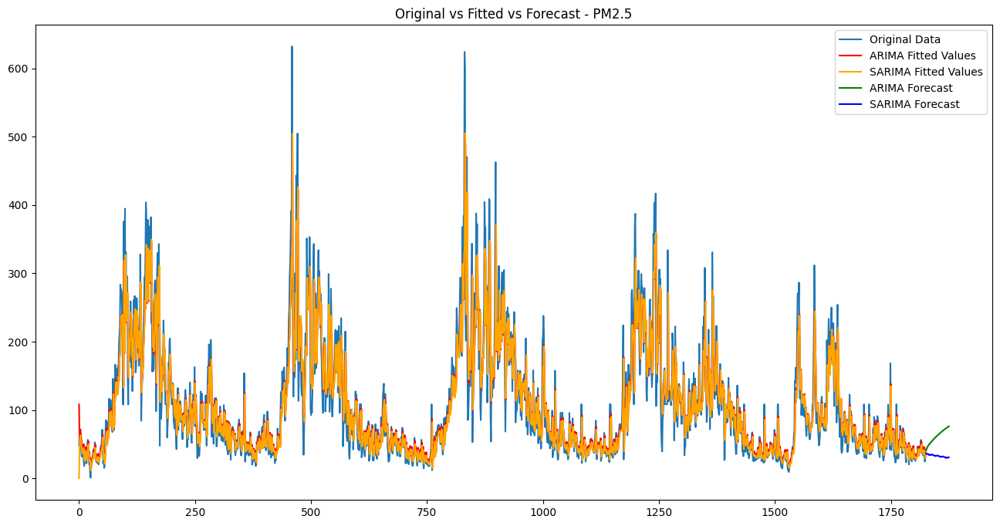

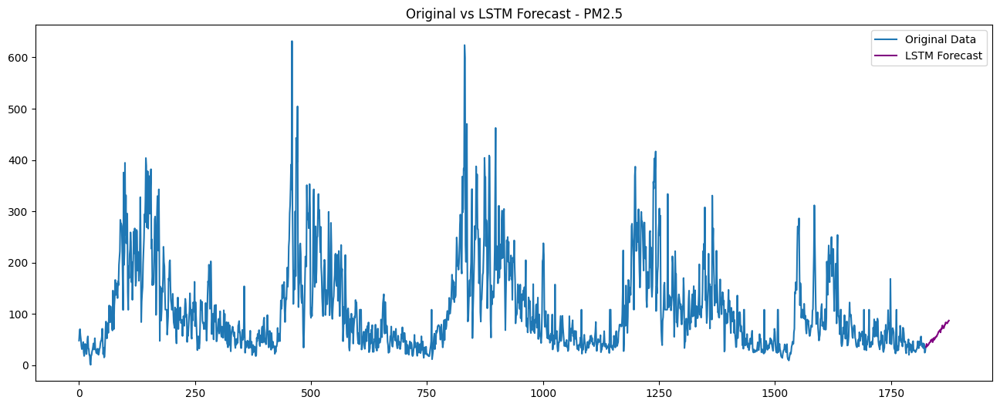

Epoch 1/10
56/56 [==============================] - 2s 8ms/step - loss: 0.0319
Epoch 2/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0143
Epoch 3/10
56/56 [==============================] - 0s 6ms/step - loss: 0.0141
Epoch 4/10
56/56 [==============================] - 0s 6ms/step - loss: 0.0140
Epoch 5/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0140
Epoch 6/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0139
Epoch 7/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0138
Epoch 8/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0138
Epoch 9/10
56/56 [==============================] - 0s 6ms/step - loss: 0.0137
Epoch 10/10
1/1 [==============================] - 0s 283ms/step


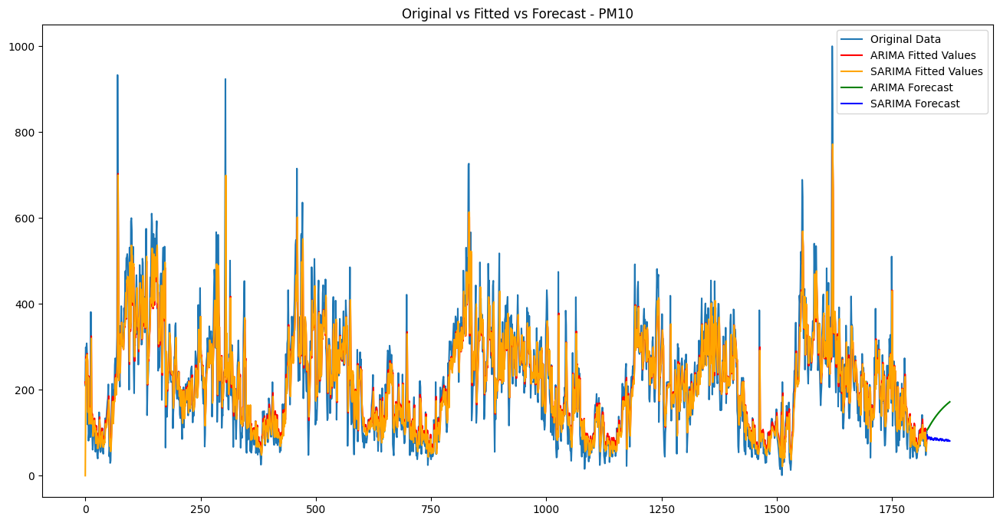

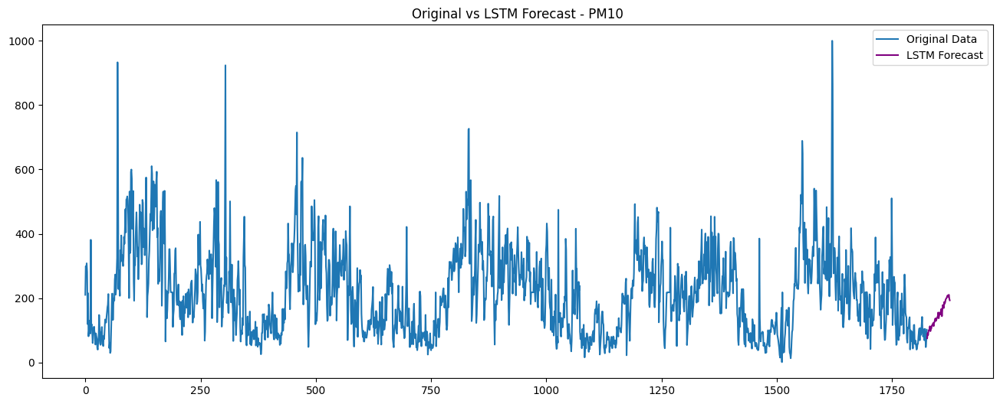

Epoch 1/10
56/56 [==============================] - 2s 8ms/step - loss: 0.0189
Epoch 2/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0093
Epoch 3/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0091
Epoch 4/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0090
Epoch 5/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0089
Epoch 6/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0090
Epoch 7/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0089
Epoch 8/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0089
Epoch 9/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0089
Epoch 10/10
1/1 [==============================] - 0s 235ms/step


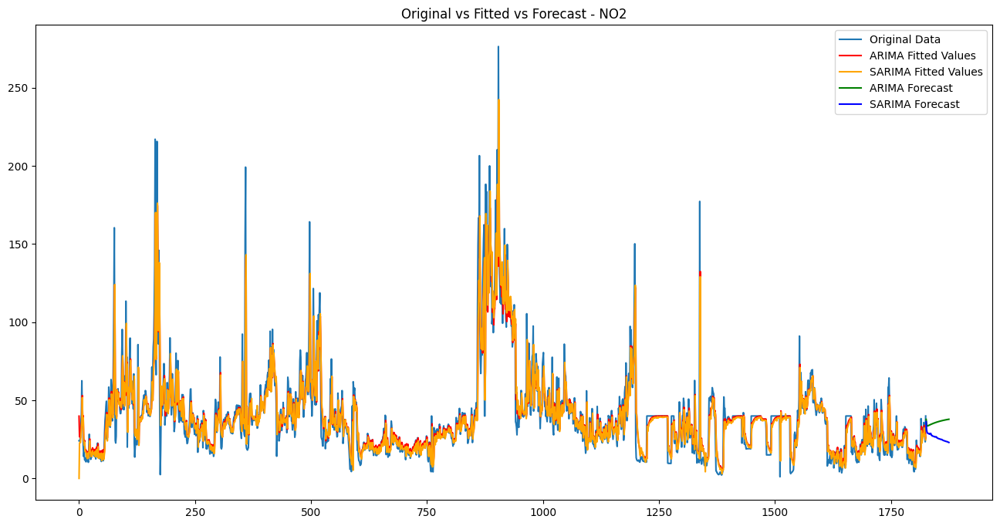

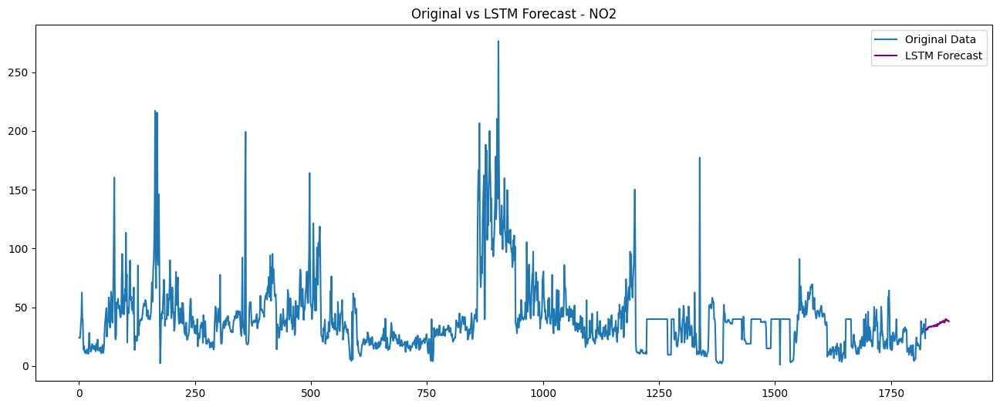

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Epoch 1/10
56/56 [==============================] - 3s 9ms/step - loss: 0.1496
Epoch 2/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0204
Epoch 3/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0198
Epoch 4/10
56/56 [==============================] - 0s 9ms/step - loss: 0.0199
Epoch 5/10
56/56 [==============================] - 0s 9ms/step - loss: 0.0199
Epoch 6/10
56/56 [==============================] - 0s 9ms/step - loss: 0.0199
Epoch 7/10
56/56 [==============================] - 0s 9ms/step - loss: 0.0196
Epoch 8/10
56/56 [==============================] - 1s 9ms/step - loss: 0.0198
Epoch 9/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0195
Epoch 10/10
1/1 [==============================] - 0s 189ms/step


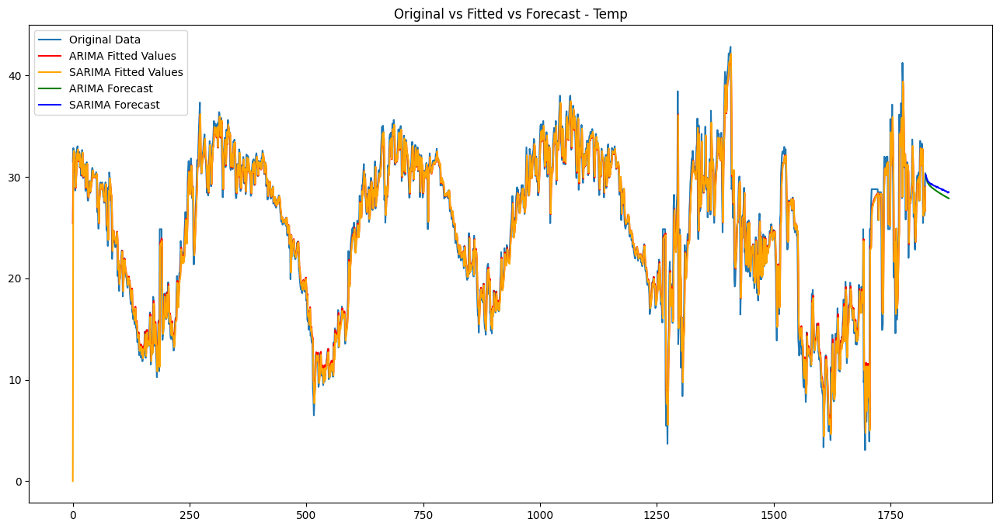

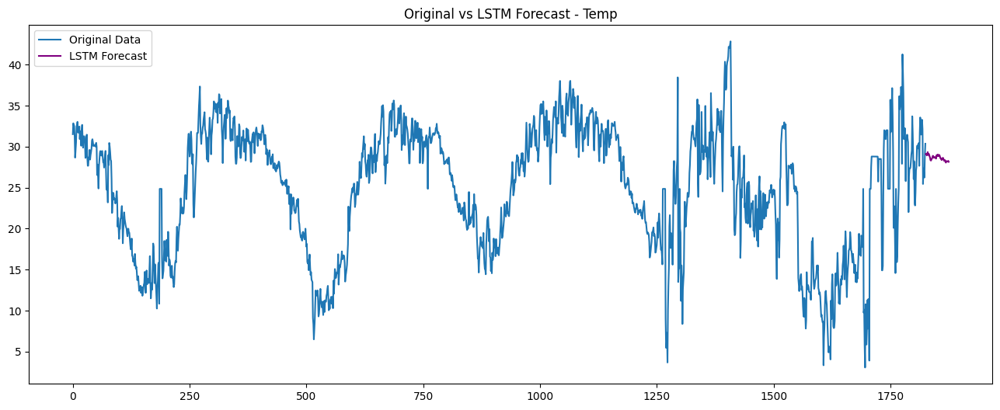

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Epoch 1/10
56/56 [==============================] - 2s 9ms/step - loss: 0.1607
Epoch 2/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0327
Epoch 3/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0308
Epoch 4/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0305
Epoch 5/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0297
Epoch 6/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0295
Epoch 7/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0290
Epoch 8/10
56/56 [==============================] - 1s 9ms/step - loss: 0.0288
Epoch 9/10
56/56 [==============================] - 0s 9ms/step - loss: 0.0291
Epoch 10/10
1/1 [==============================] - 0s 245ms/step


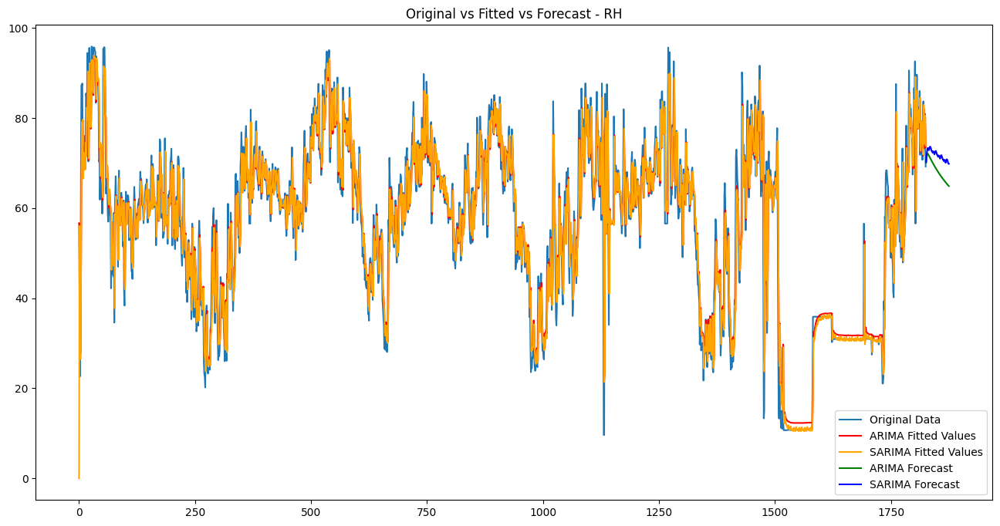

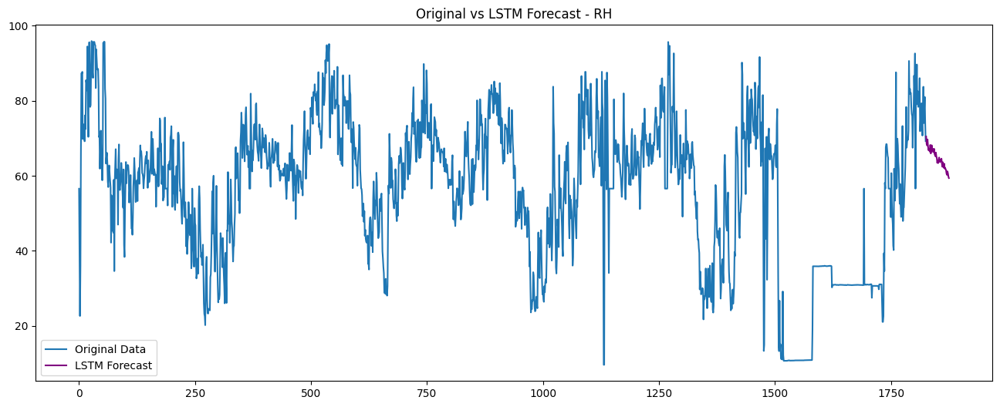

The best model is: LSTM with MSE: 14.405126354924867


c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
c:\m_pf\anaconda\envs\test\Lib\

Epoch 1/10
56/56 [==============================] - 3s 9ms/step - loss: 0.0293
Epoch 2/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0142
Epoch 3/10
56/56 [==============================] - 0s 9ms/step - loss: 0.0138
Epoch 4/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0138
Epoch 5/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0136
Epoch 6/10
56/56 [==============================] - 0s 7ms/step - loss: 0.0135
Epoch 7/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0134
Epoch 8/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0134
Epoch 9/10
56/56 [==============================] - 0s 8ms/step - loss: 0.0134
Epoch 10/10
1/1 [==============================] - 0s 173ms/step


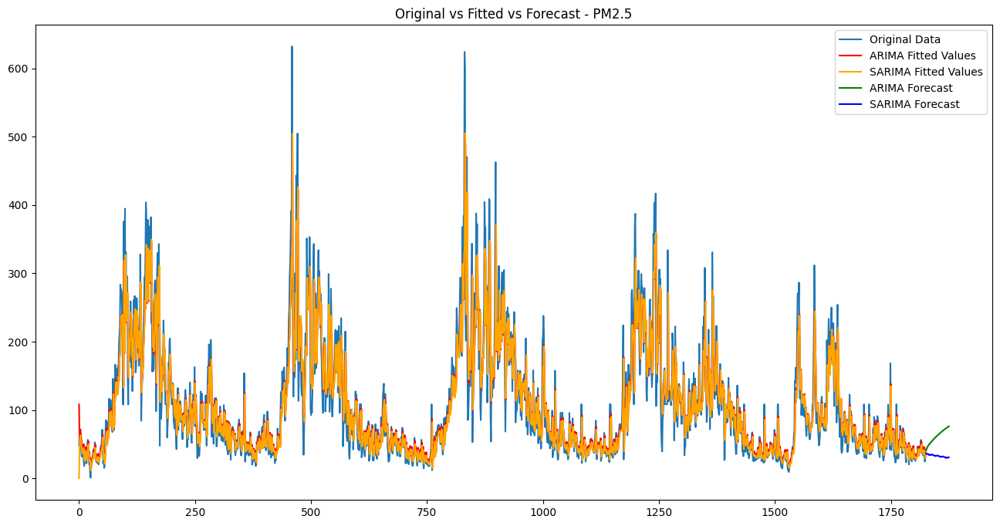

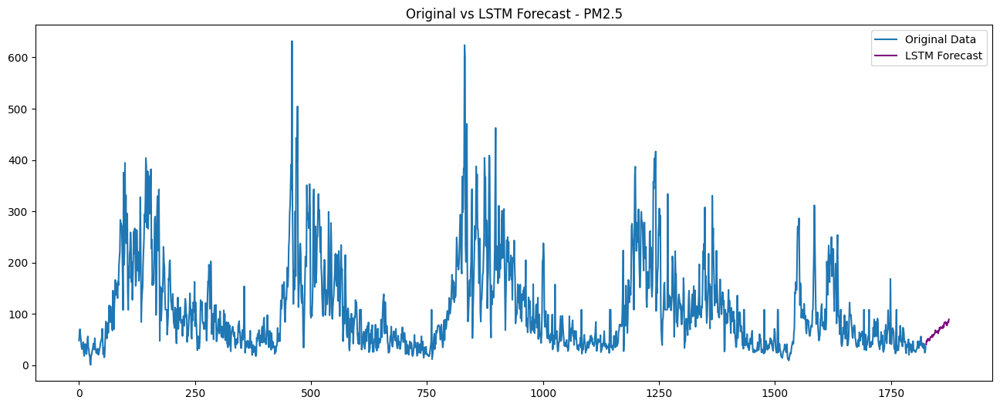

KeyboardInterrupt: 

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\1.csv")

# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

def fit_arima_and_forecast(data_col, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=(3, 0, 3))
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def fit_sarima_and_forecast(data_col, forecast_steps):
    # Fit SARIMA model using statsmodels
    model = SARIMAX(data_col, order=(3, 0, 3), seasonal_order=(1, 0, 1, 12))
    results_SARIMA = model.fit()

    # Forecast future steps
    forecast = results_SARIMA.get_forecast(steps=forecast_steps)
    return results_SARIMA, forecast.predicted_mean

def fit_lstm_and_forecast(data_col, forecast_steps):
    # Normalize data
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(data_col.values.reshape(-1, 1))
    
    # Prepare sequences
    window_size = 10  # Adjust window size
    X = []
    y = []
    for i in range(len(scaled_data) - window_size - forecast_steps):
        X.append(scaled_data[i:i+window_size])
        y.append(scaled_data[i+window_size:i+window_size+forecast_steps])
    X = np.array(X)
    y = np.array(y)
    
    # Build LSTM model
    model = Sequential()
    model.add(LSTM(64, activation='relu', input_shape=(window_size, 1)))
    model.add(Dense(forecast_steps))
    model.compile(optimizer='adam', loss='mse')

    # Fit LSTM model
    model.fit(X, y, epochs=10)  # Adjust epochs as needed
    
    # Forecast using the trained LSTM model
    last_sequence = scaled_data[-window_size:].reshape(1, window_size, 1)
    forecast = model.predict(last_sequence)
    forecast = scaler.inverse_transform(forecast.reshape(-1, 1))
    return forecast.flatten()

def plot_data_forecast(data_col, results_ARIMA, forecast_ARIMA, forecast_SARIMA, forecast_steps):
    plt.figure(figsize=(16, 8))
    plt.plot(data_col, label='Original Data')
    plt.plot(results_ARIMA.fittedvalues, color='red', label='ARIMA Fitted Values')
    plt.plot(results_SARIMA.fittedvalues, color='orange', label='SARIMA Fitted Values')
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast_ARIMA, color='green', label='ARIMA Forecast')
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast_SARIMA, color='blue', label='SARIMA Forecast')
    plt.legend()
    plt.title(f"Original vs Fitted vs Forecast - {data_col.name}")
    plt.show()

def plot_lstm_forecast(data_col, forecast_LSTM, forecast_steps):
    plt.figure(figsize=(16, 6))
    plt.plot(data_col, label='Original Data')
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast_LSTM, color='purple', label='LSTM Forecast')
    plt.legend()
    plt.title(f"Original vs LSTM Forecast - {data_col.name}")
    plt.show()

best_model = None
best_mse = float('inf')  # Initialize with a high value

for pollutant in pollutants:
    data_col = data[pollutant]
    
    results_ARIMA, forecast_ARIMA = fit_arima_and_forecast(data_col, forecast_steps)
    results_SARIMA, forecast_SARIMA = fit_sarima_and_forecast(data_col, forecast_steps)
    forecast_LSTM = fit_lstm_and_forecast(data_col, forecast_steps)
    
    # Calculate Mean Squared Error for each model
    mse_ARIMA = ((forecast_ARIMA - data_col[-forecast_steps:]) ** 2).mean()
    mse_SARIMA = ((forecast_SARIMA - data_col[-forecast_steps:]) ** 2).mean()
    mse_LSTM = ((forecast_LSTM - data_col[-forecast_steps:]) ** 2).mean()
    
    # Choose the model with the lowest MSE
    if mse_ARIMA < best_mse:
        best_model = 'ARIMA'
        best_mse = mse_ARIMA
        best_forecast = forecast_ARIMA
    if mse_SARIMA < best_mse:
        best_model = 'SARIMA'
        best_mse = mse_SARIMA
        best_forecast = forecast_SARIMA
    if mse_LSTM < best_mse:
        best_model = 'LSTM'
        best_mse = mse_LSTM
        best_forecast = forecast_LSTM
    
    plot_data_forecast(data_col, results_ARIMA, forecast_ARIMA, forecast_SARIMA, forecast_steps)
    plot_lstm_forecast(data_col, forecast_LSTM, forecast_steps)

print(f"The best model is: {best_model} with MSE: {best_mse}")

# For each pollutant column, fit models, forecast, and visualize
pollutants = ['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']
forecast_steps = 50  # Define the number of forecast steps

for pollutant in pollutants:
    data_col = data[pollutant]
    
    results_ARIMA, forecast_ARIMA = fit_arima_and_forecast(data_col, forecast_steps)
    results_SARIMA, forecast_SARIMA = fit_sarima_and_forecast(data_col, forecast_steps)
    forecast_LSTM = fit_lstm_and_forecast(data_col, forecast_steps)
    
    plot_data_forecast(data_col, results_ARIMA, forecast_ARIMA, forecast_SARIMA, forecast_steps)
    plot_lstm_forecast(data_col, forecast_LSTM, forecast_steps)


c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


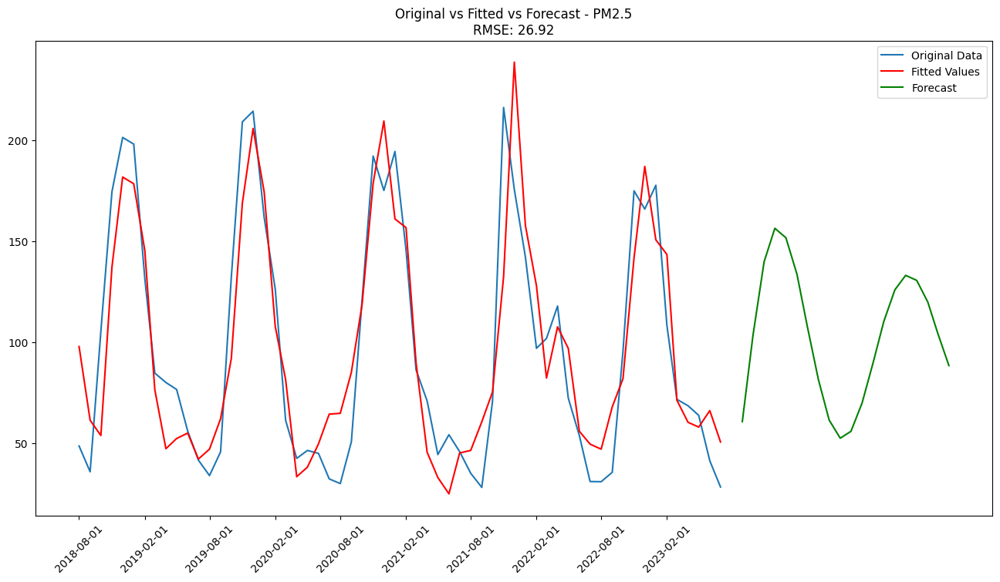

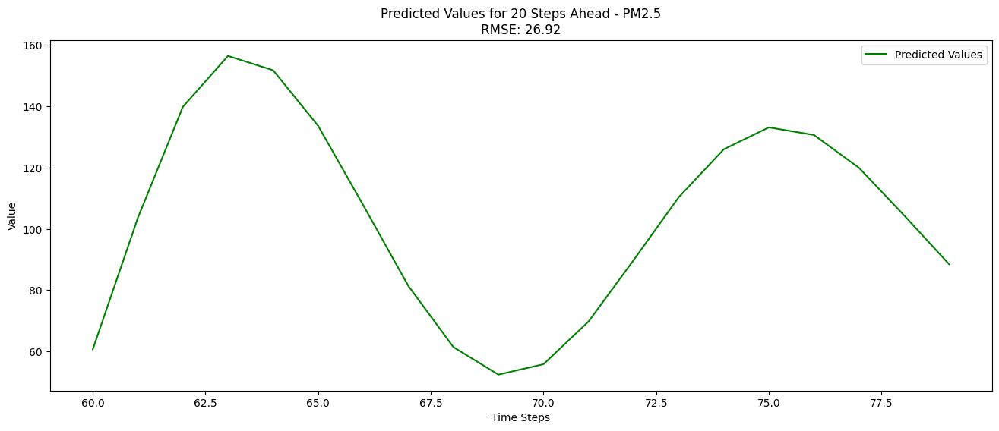

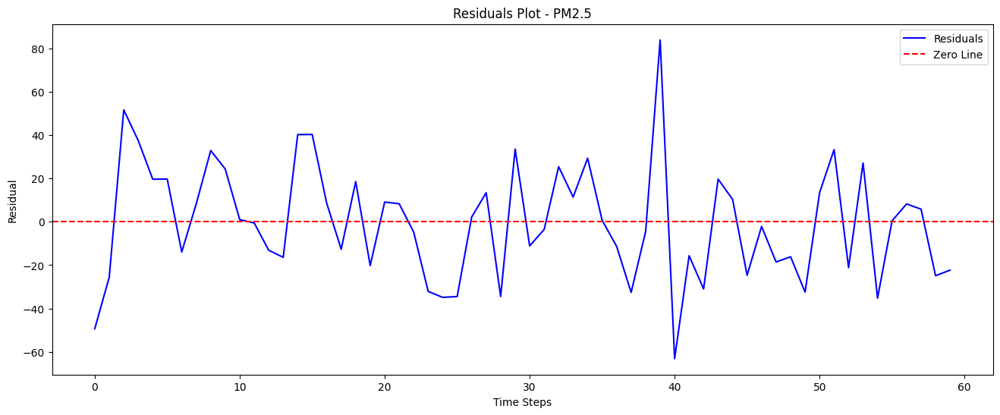

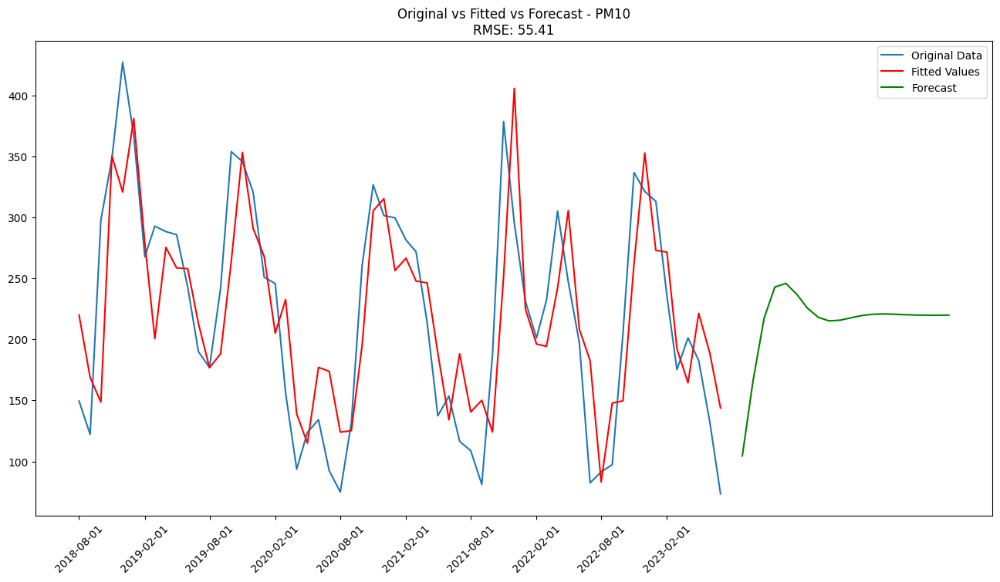

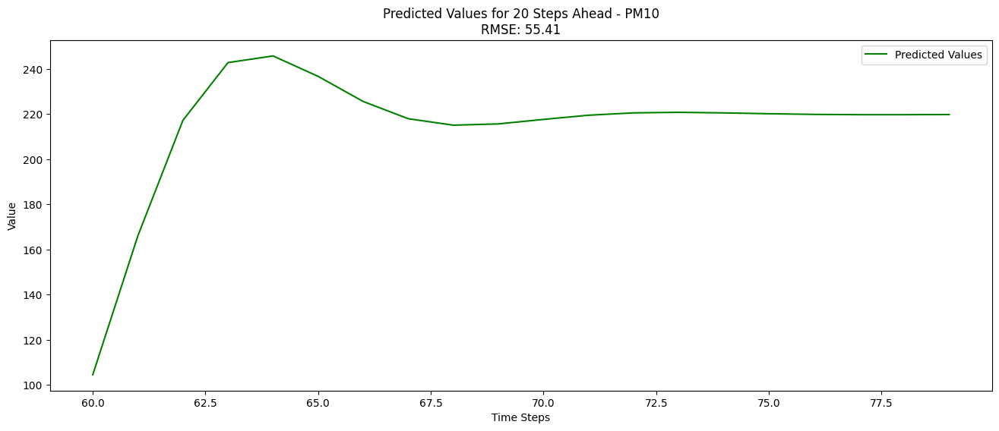

...

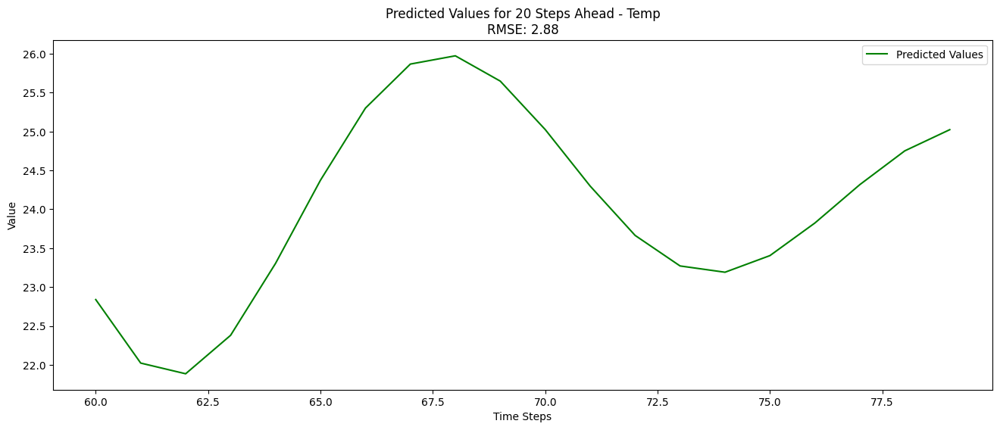

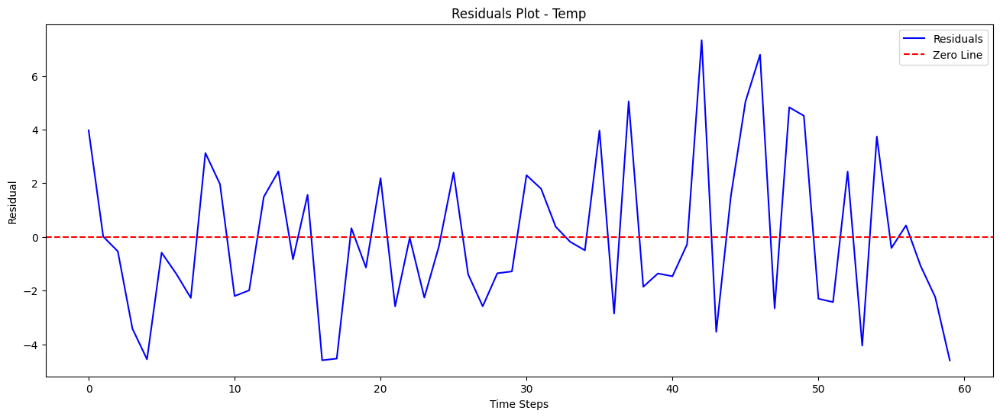

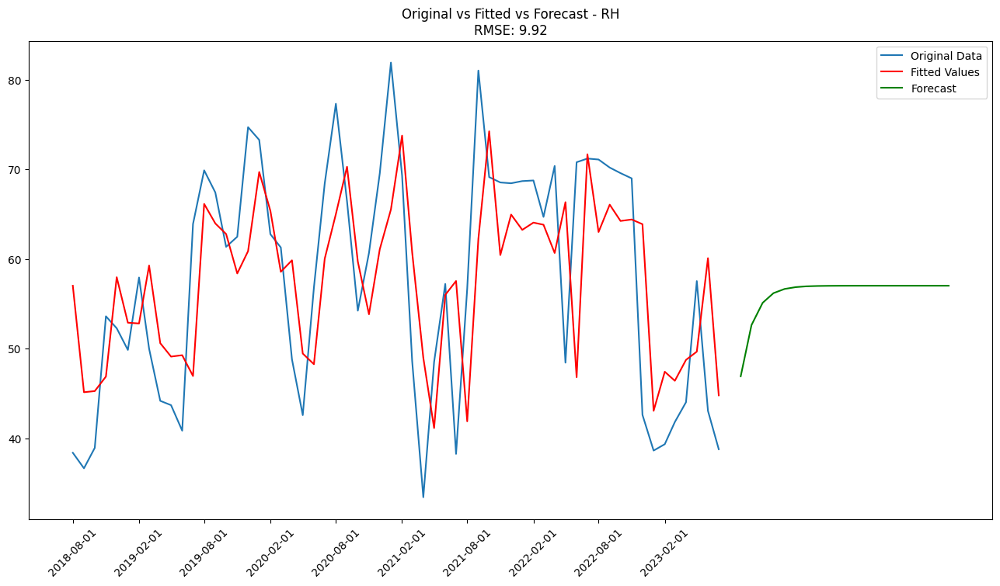

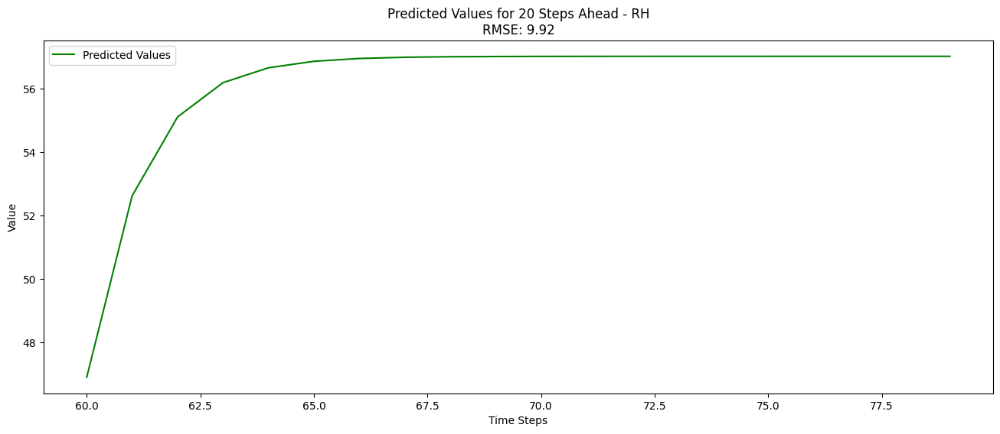

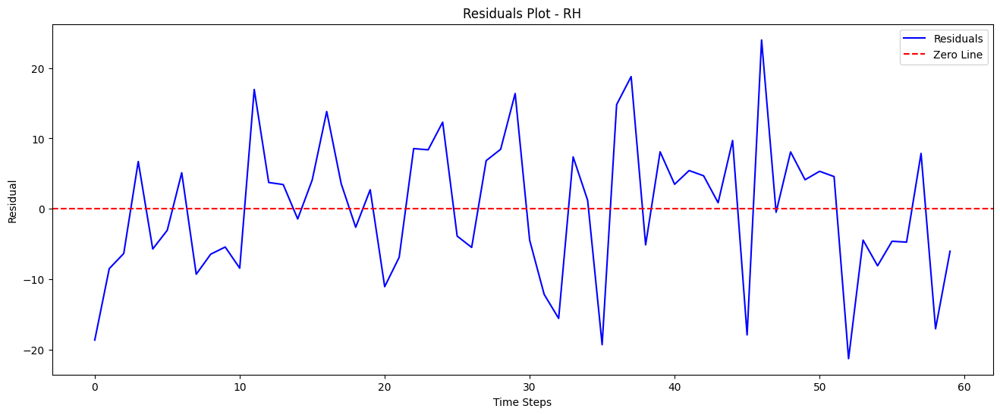

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
import numpy as np

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\Sirifort.csv")

# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

def fit_arima_and_forecast(data_col, order, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=order)
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def automated_arima(data_col, forecast_steps):
    model = auto_arima(data_col, seasonal=False, suppress_warnings=True)
    order = model.order
    results_ARIMA, forecast = fit_arima_and_forecast(data_col, order, forecast_steps)
    return results_ARIMA, forecast

pollutants = ['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']
forecast_steps = 20 # Define the number of forecast steps to 30

for pollutant in pollutants:
    data_col = data[pollutant]

    results_ARIMA, forecast = automated_arima(data_col, forecast_steps)

    # Calculate RMSE
    rmse = np.sqrt(((results_ARIMA.fittedvalues - data_col) ** 2).mean())

    # Plotting the original data, fitted values, and forecast
    plt.figure(figsize=(16, 8))
    plt.plot(data['From Date'], data_col, label='Original Data')
    selected_dates = data['From Date'][::int(len(data_col) / 10)]  # Adjust the interval as needed
    plt.xticks(selected_dates, [d.strftime('%Y-%m-%d') for d in selected_dates], rotation=45)  # Rotate the date labels for better visibility

    plt.plot(data['From Date'], results_ARIMA.fittedvalues, color='red', label='Fitted Values')
    forecast_dates = pd.date_range(start=data['From Date'].iloc[-1], periods=forecast_steps+1, freq='M')[1:]  # Create forecast date range
    plt.plot(forecast_dates, forecast, color='green', label='Forecast')
    plt.legend()
    plt.title(f"Original vs Fitted vs Forecast - {pollutant}\nRMSE: {rmse:.2f}")
    plt.show()

    # Plotting the predicted values for 30 steps
    plt.figure(figsize=(16, 6))
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Predicted Values')
    plt.xlabel('Time Steps')
    plt.ylabel('Value')
    plt.title(f'Predicted Values for {forecast_steps} Steps Ahead - {pollutant}\nRMSE: {rmse:.2f}')
    plt.legend()
    plt.show()

    # Plotting residuals
    residuals = data_col - results_ARIMA.fittedvalues
    plt.figure(figsize=(16, 6))
    plt.plot(residuals, color='blue', label='Residuals')
    plt.axhline(y=0, color='red', linestyle='--', label='Zero Line')
    plt.xlabel('Time Steps')
    plt.ylabel('Residual')
    plt.title(f'Residuals Plot - {pollutant}')
    plt.legend()
    plt.show()

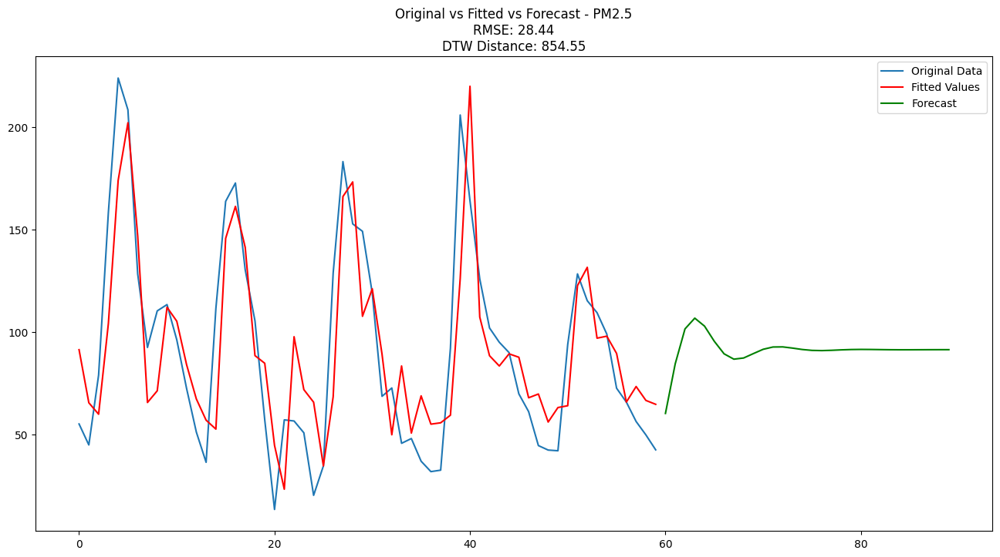

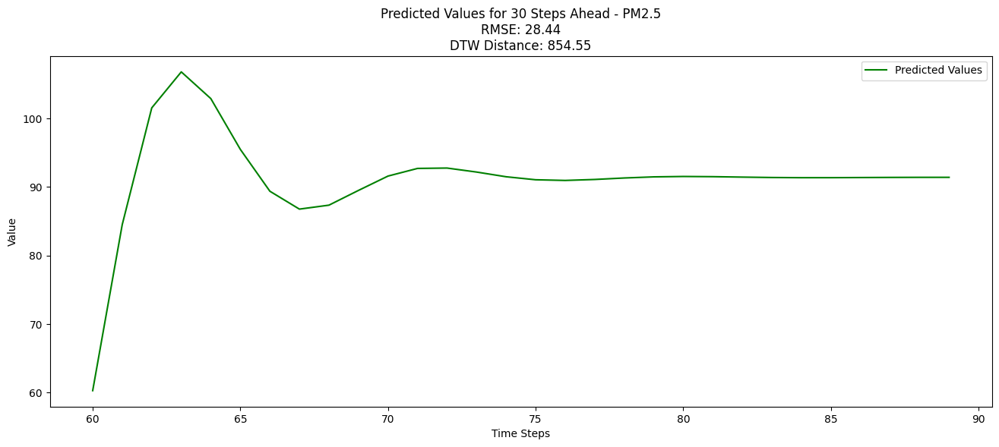

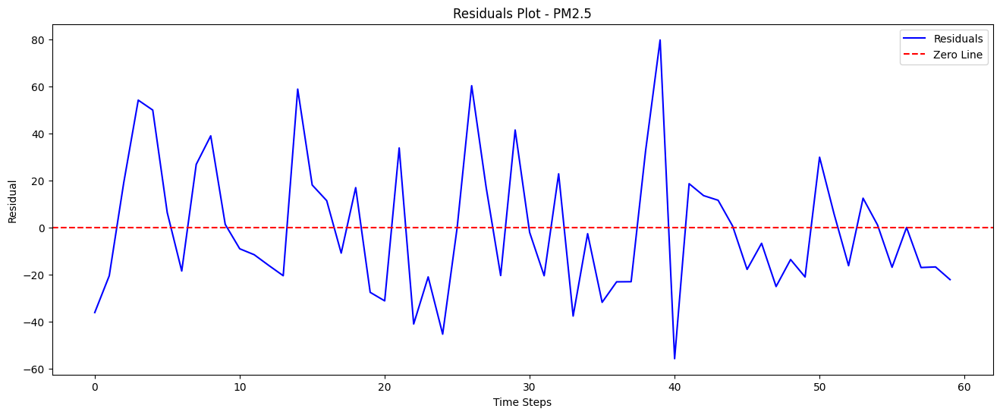

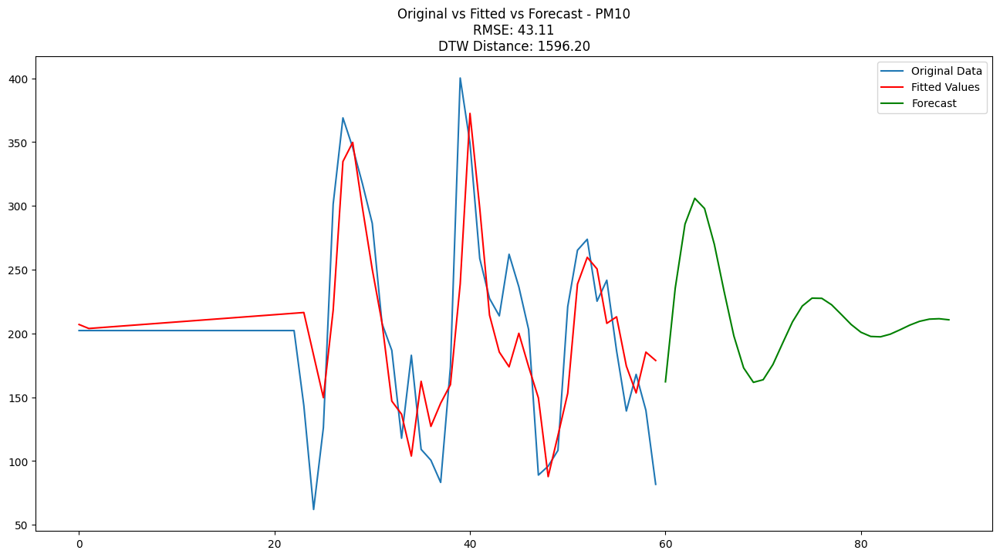

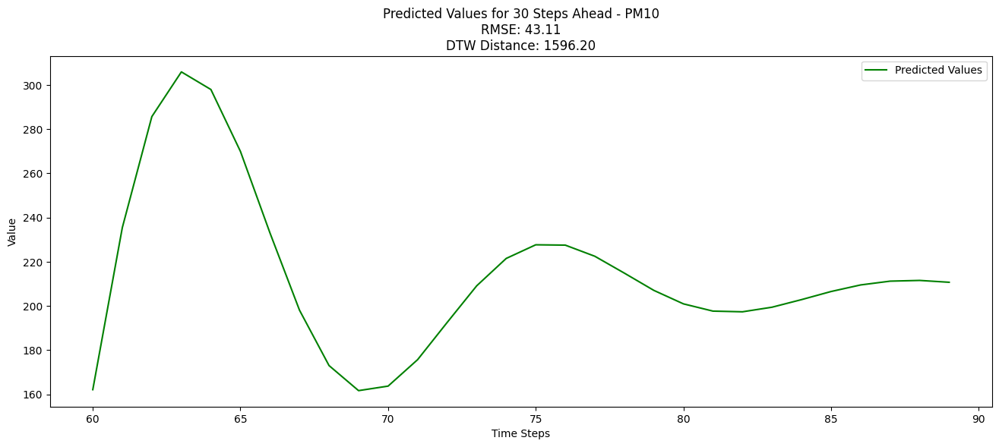

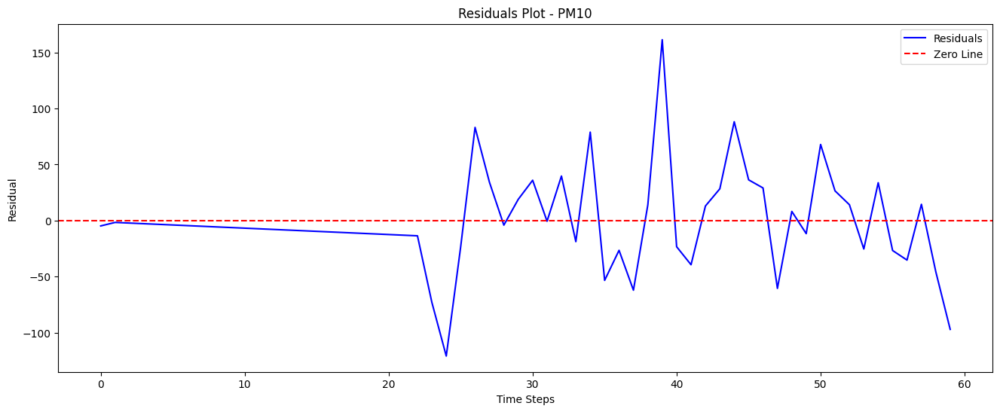

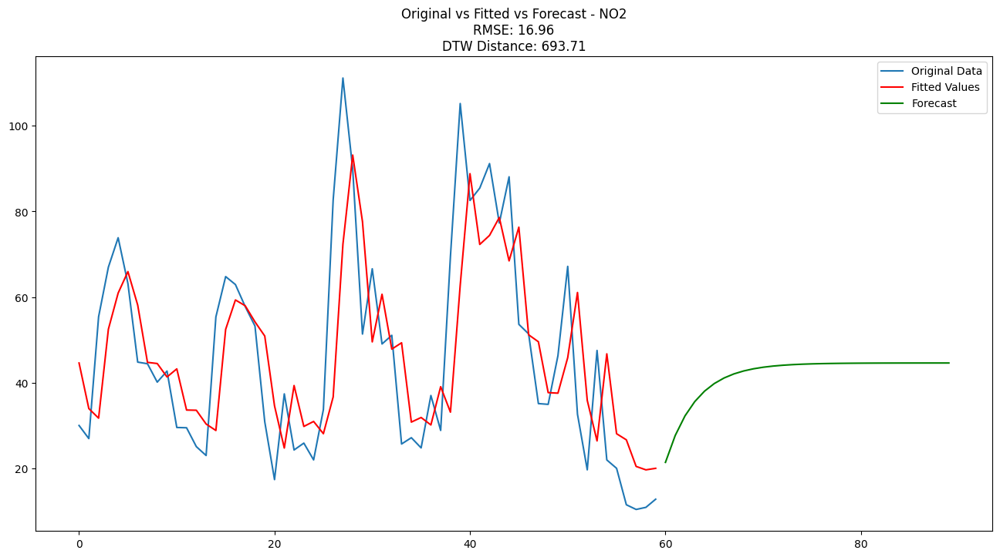

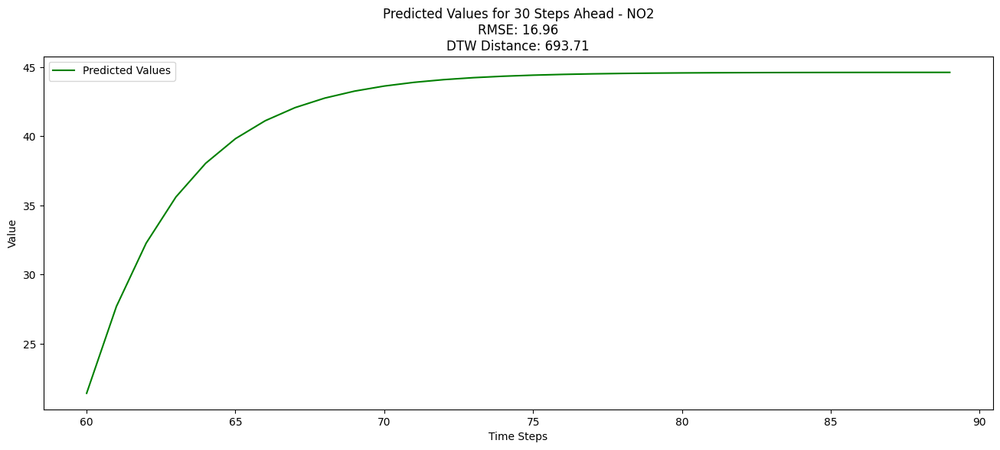

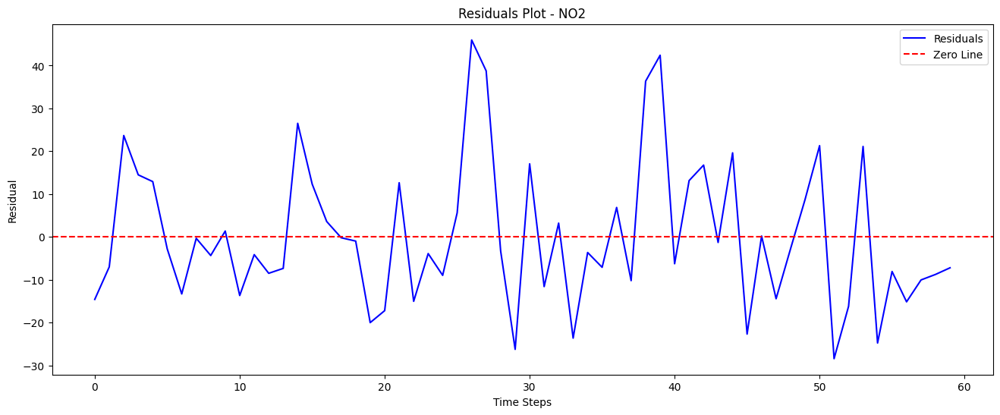

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


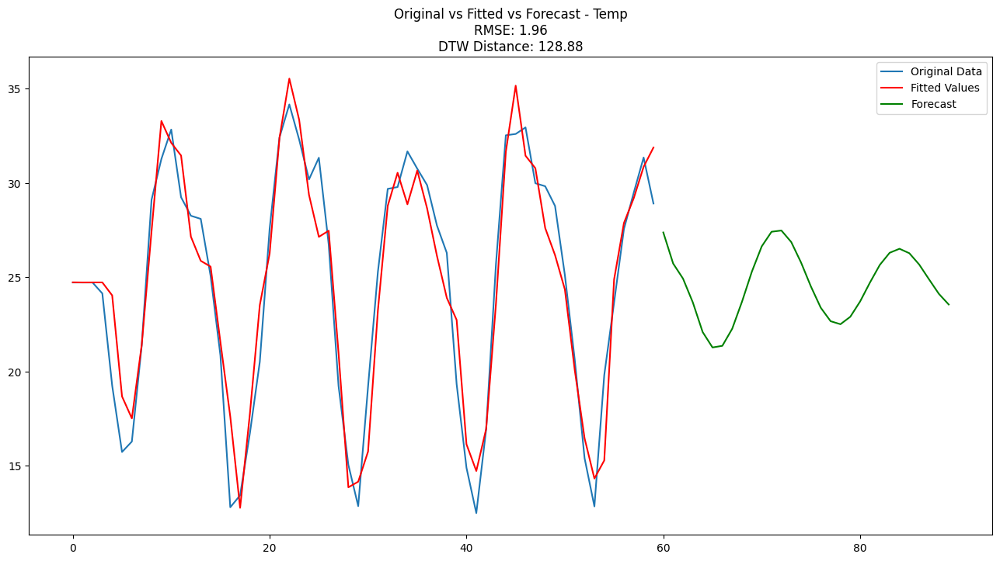

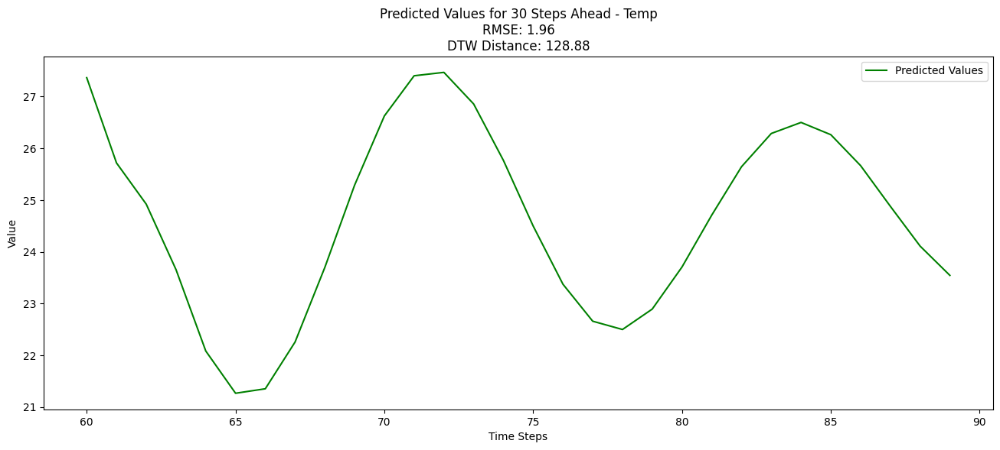

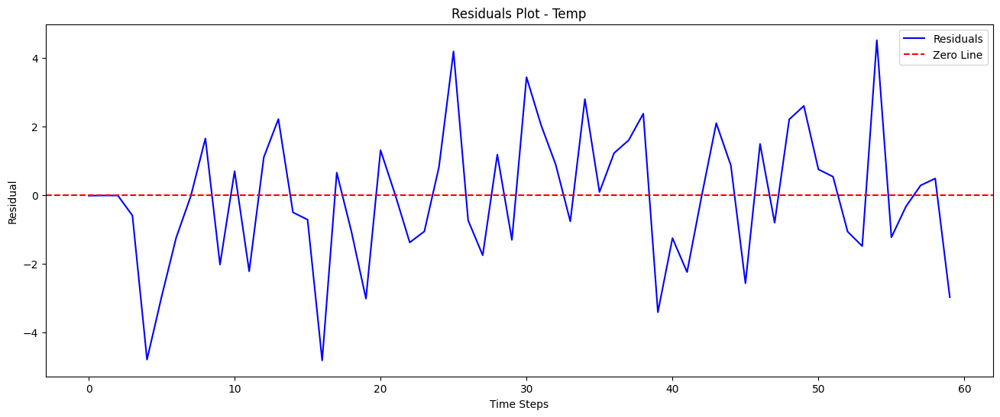

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


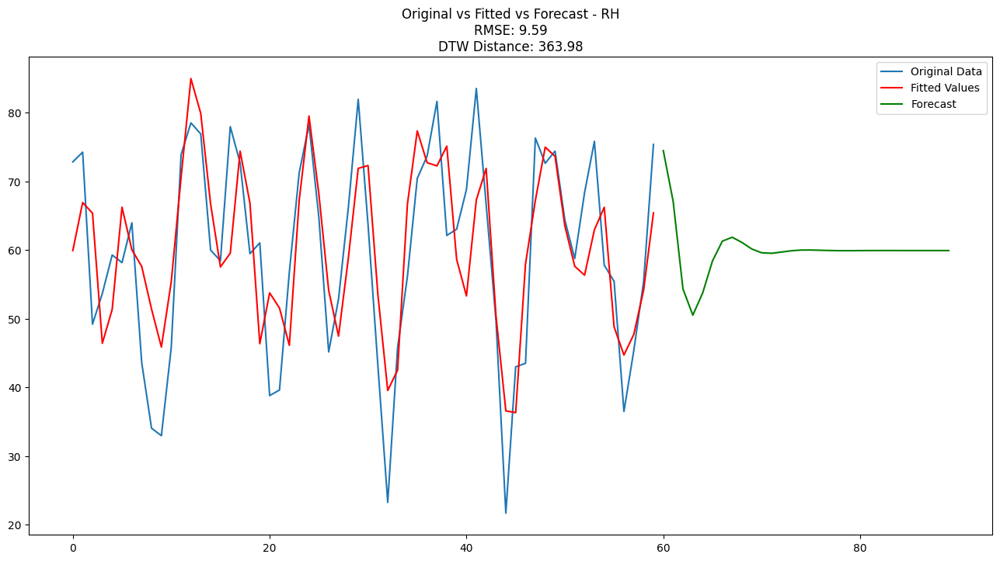

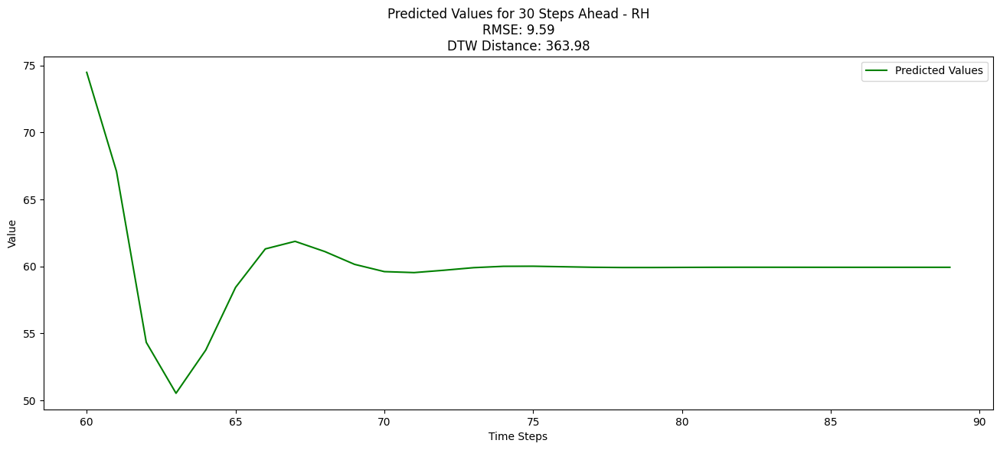

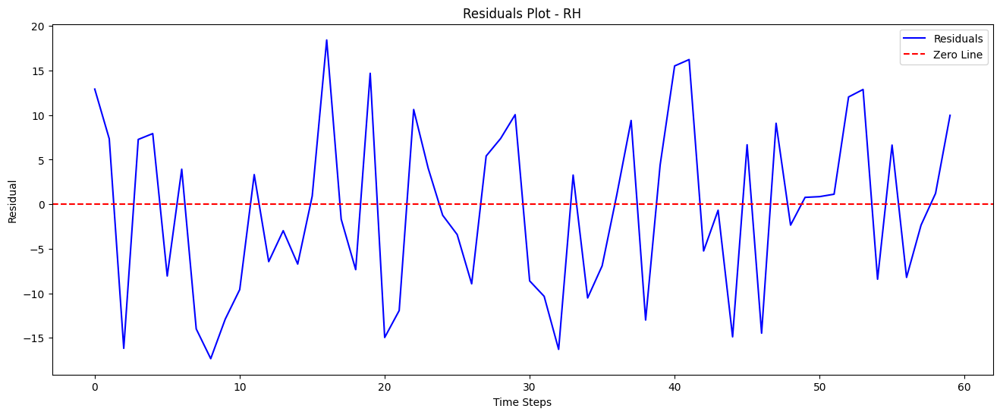

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima
import numpy as np
from fastdtw import fastdtw  # Import the fastdtw function

# Load your data
data = pd.read_csv(r"D:\Sandipan\Final\Dilshad_Garden.csv")

# Convert date column to datetime and sort
data['From Date'] = pd.to_datetime(data['From Date'], dayfirst=True)
data.sort_values(by='From Date', inplace=True)

def fit_arima_and_forecast(data_col, order, forecast_steps):
    # Fit ARIMA model using statsmodels
    model = ARIMA(data_col, order=order)
    results_ARIMA = model.fit()

    # Forecast future steps
    forecast = results_ARIMA.forecast(steps=forecast_steps)
    return results_ARIMA, forecast

def automated_arima(data_col, forecast_steps):
    model = auto_arima(data_col, seasonal=False, suppress_warnings=True)
    order = model.order
    results_ARIMA, forecast = fit_arima_and_forecast(data_col, order, forecast_steps)
    return results_ARIMA, forecast

# For each pollutant column, fit ARIMA and forecast
pollutants = ['PM2.5', 'PM10', 'NO2', 'Temp', 'RH']
forecast_steps = 30  # Define the number of forecast steps to 30

for pollutant in pollutants:
    data_col = data[pollutant]

    results_ARIMA, forecast = automated_arima(data_col, forecast_steps)

    # Calculate RMSE
    rmse = np.sqrt(((results_ARIMA.fittedvalues - data_col) ** 2).mean())

    # Calculate DTW distance between forecast and actual values
    distance, _ = fastdtw(data_col[-forecast_steps:], forecast)

    # Plotting the original data, fitted values, and forecast
    plt.figure(figsize=(16, 8))
    plt.plot(data_col, label='Original Data')
    plt.plot(results_ARIMA.fittedvalues, color='red', label='Fitted Values')
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Forecast')
    plt.legend()
    plt.title(f"Original vs Fitted vs Forecast - {pollutant}\nRMSE: {rmse:.2f}\nDTW Distance: {distance:.2f}")
    plt.show()

    # Plotting the predicted values for 30 steps
    plt.figure(figsize=(16, 6))
    plt.plot(range(len(data_col), len(data_col) + forecast_steps), forecast, color='green', label='Predicted Values')
    plt.xlabel('Time Steps')
    plt.ylabel('Value')
    plt.title(f'Predicted Values for {forecast_steps} Steps Ahead - {pollutant}\nRMSE: {rmse:.2f}\nDTW Distance: {distance:.2f}')
    plt.legend()
    plt.show()

    # Plotting residuals
    residuals = data_col - results_ARIMA.fittedvalues
    plt.figure(figsize=(16, 6))
    plt.plot(residuals, color='blue', label='Residuals')
    plt.axhline(y=0, color='red', linestyle='--', label='Zero Line')
    plt.xlabel('Time Steps')
    plt.ylabel('Residual')
    plt.title(f'Residuals Plot - {pollutant}')
    plt.legend()
    plt.show()


In [5]:
from statsmodels.tsa.seasonal import STL

for pollutant in pollutants:
    data_col = data[pollutant]
    
    stl_result = STL(data_col, seasonal=13)
    seasonal, trend, residual = stl_result.seasonal, stl_result.trend, stl_result.resid
    
    plt.figure(figsize=(16, 8))
    plt.subplot(3, 1, 1)
    plt.plot(data_col, label='Original Data')
    plt.legend()
    plt.subplot(3, 1, 2)
    plt.plot(trend, color='red', label='Trend')
    plt.legend()
    plt.subplot(3, 1, 3)
    plt.plot(seasonal, color='green', label='Seasonal')
    plt.legend()
    plt.show()
    
    plt.figure(figsize=(16, 6))
    plt.plot(residual, color='blue', label='Residuals')
    plt.axhline(y=0, color='red', linestyle='--', label='Zero Line')
    plt.xlabel('Time Steps')
    plt.ylabel('Residual')
    plt.title(f'Seasonal Decomposition - {pollutant}')
    plt.legend()
    plt.show()


ValueError: Unable to determine period from endog

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


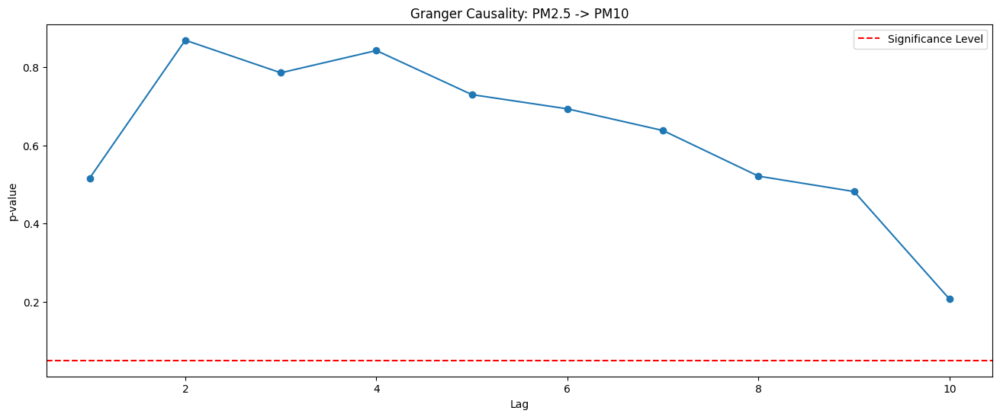

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


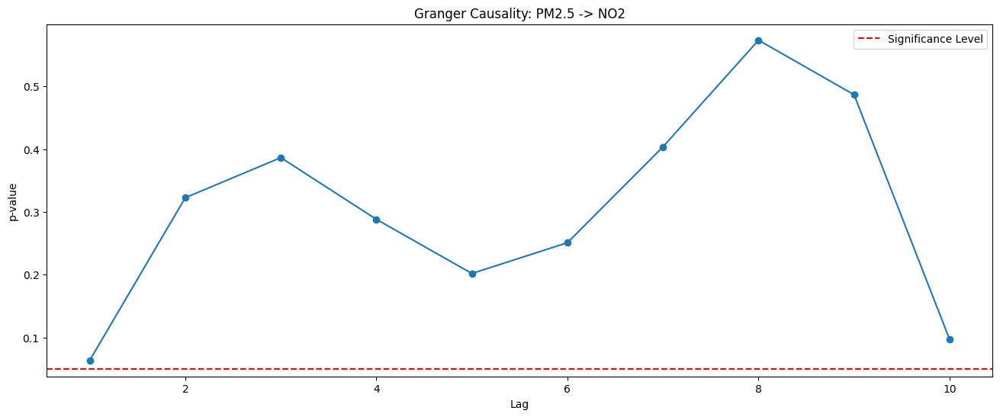

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


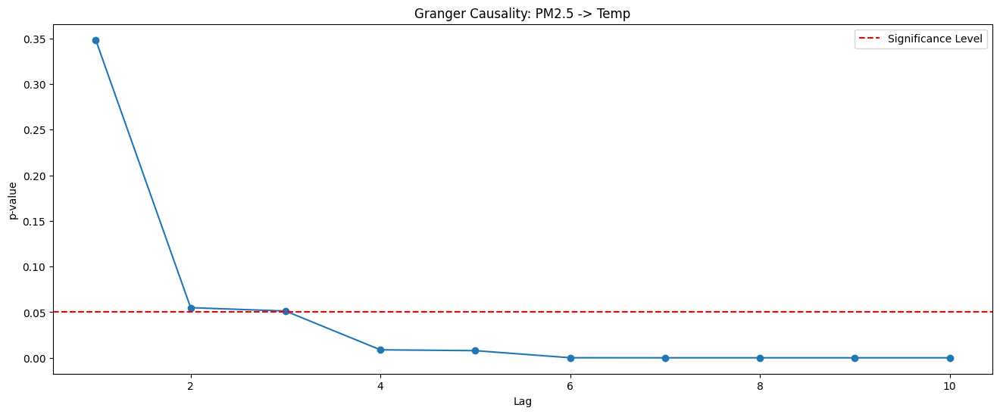

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


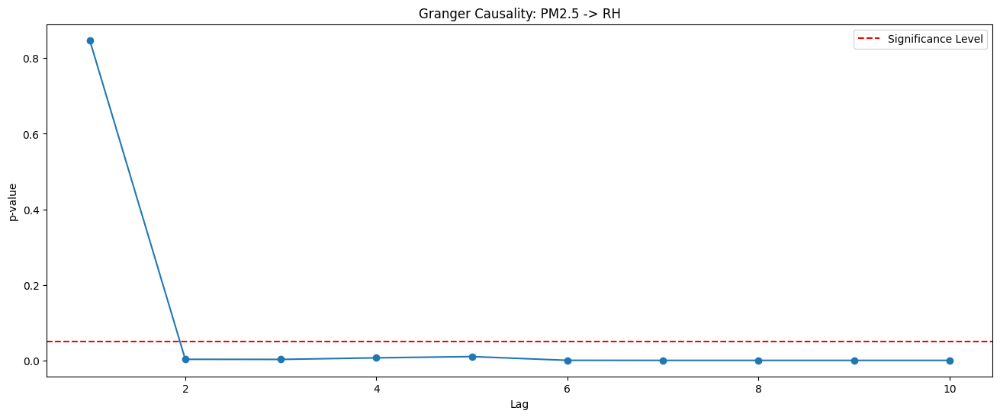

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


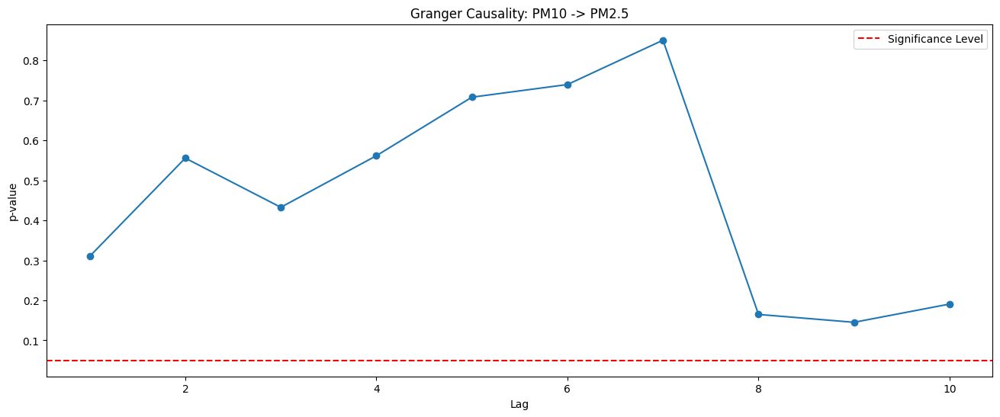

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


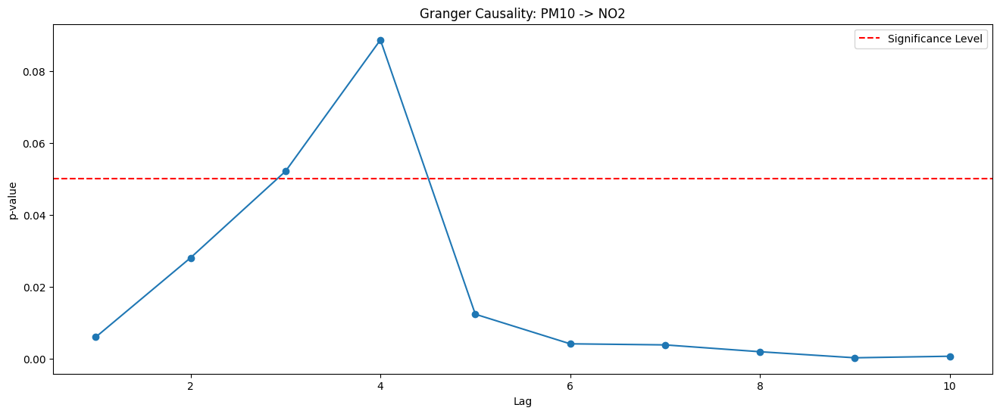

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


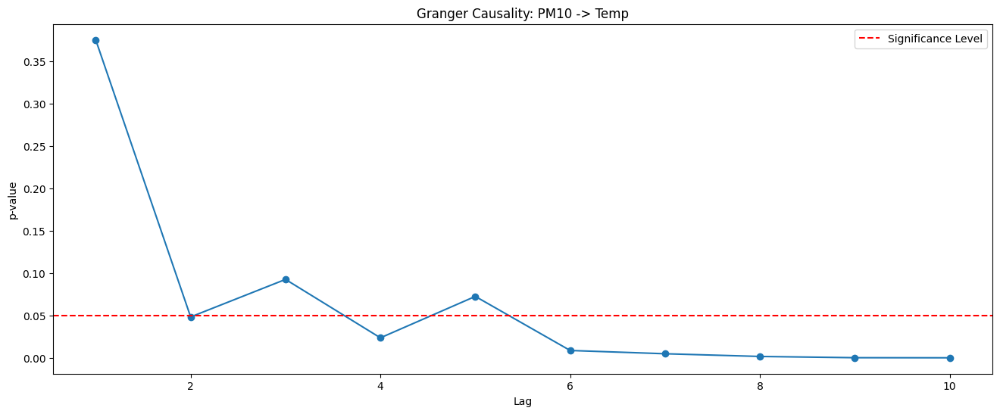

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


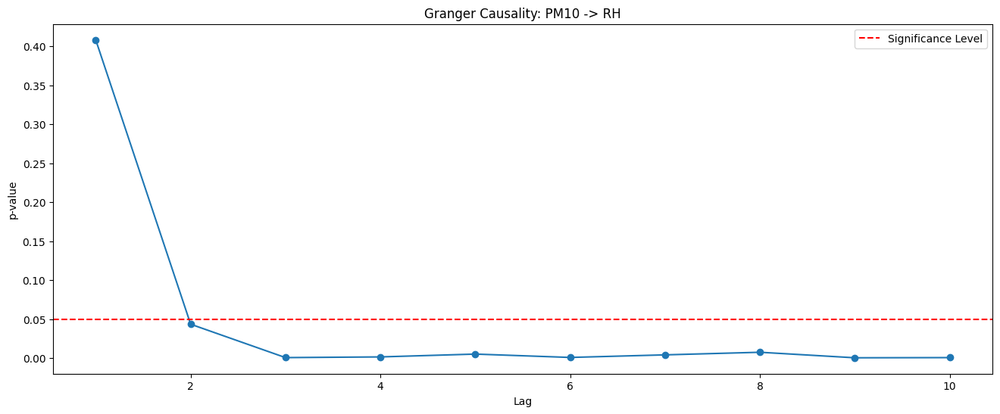

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


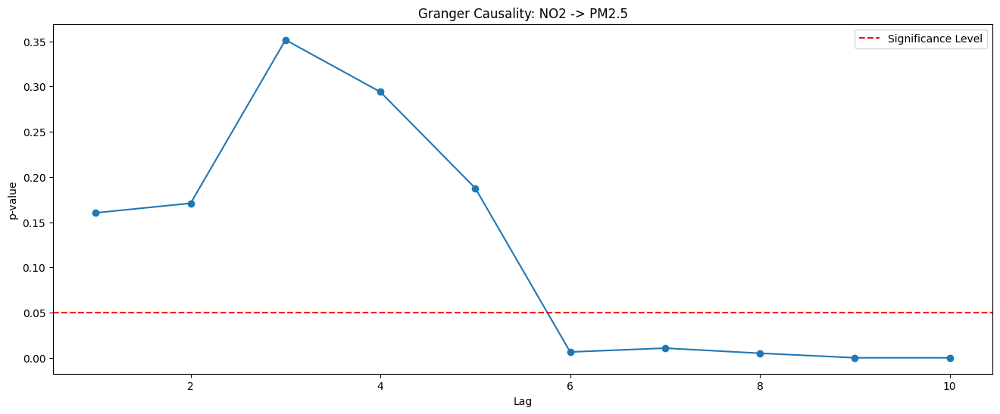

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


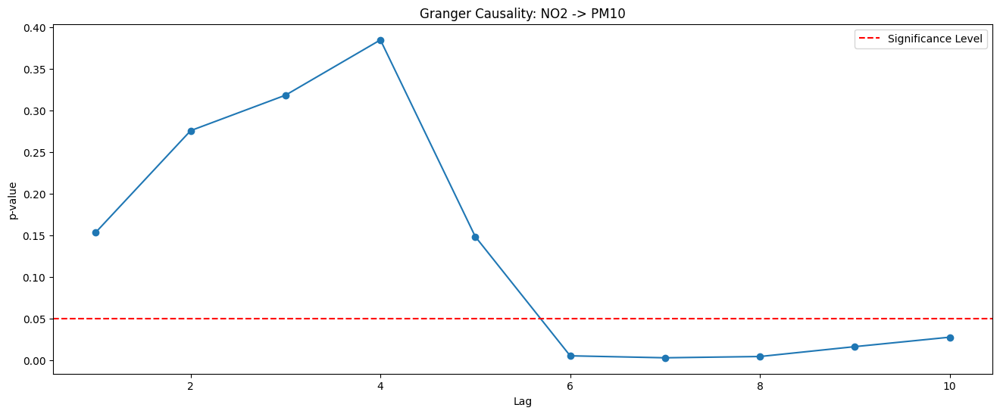

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


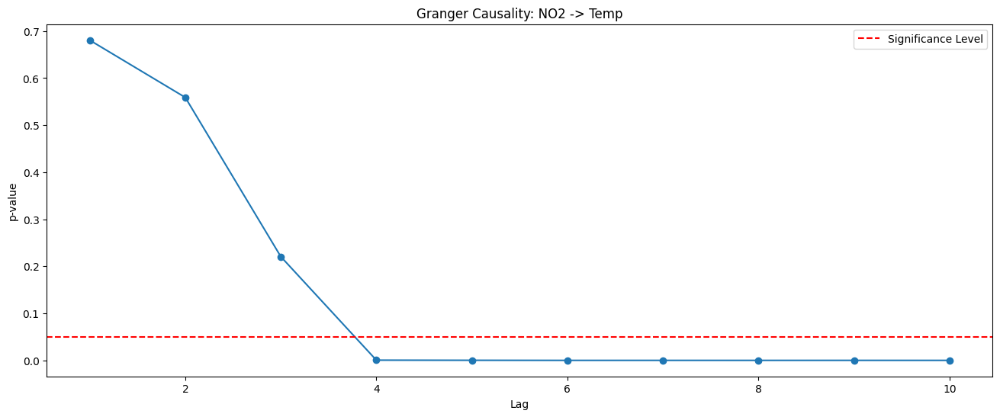

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


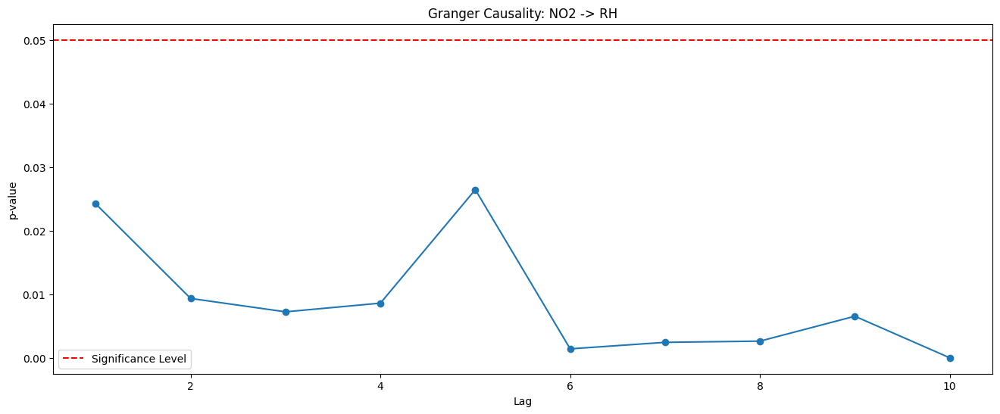

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


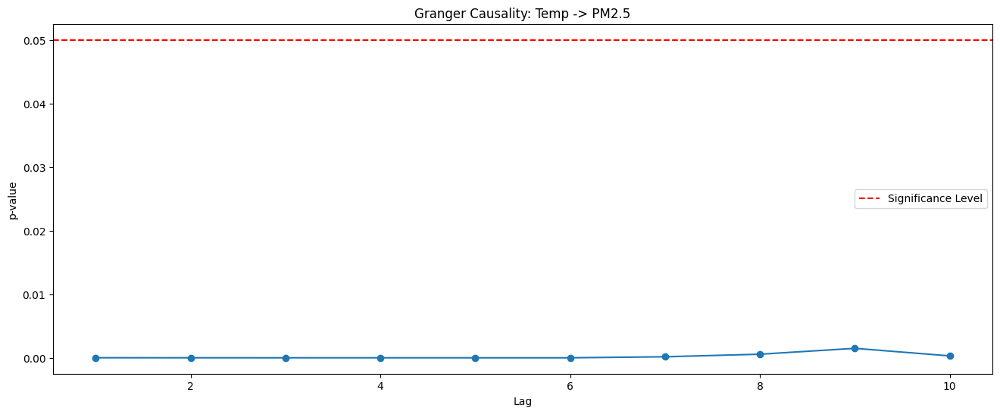

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


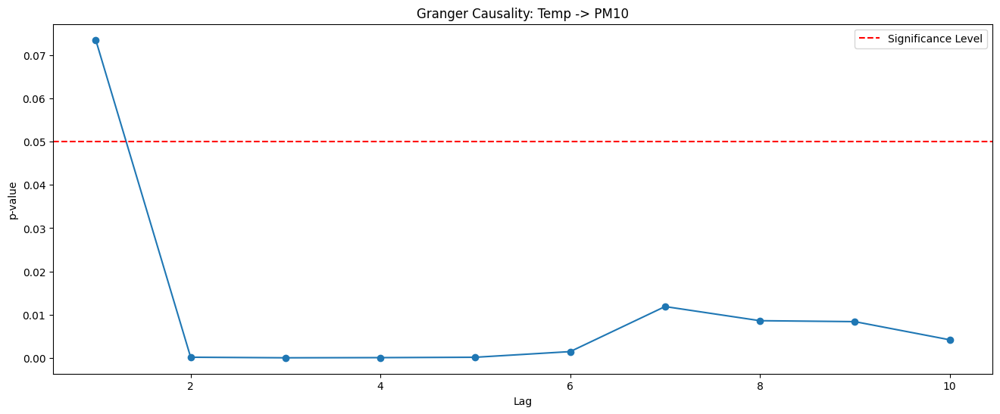

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


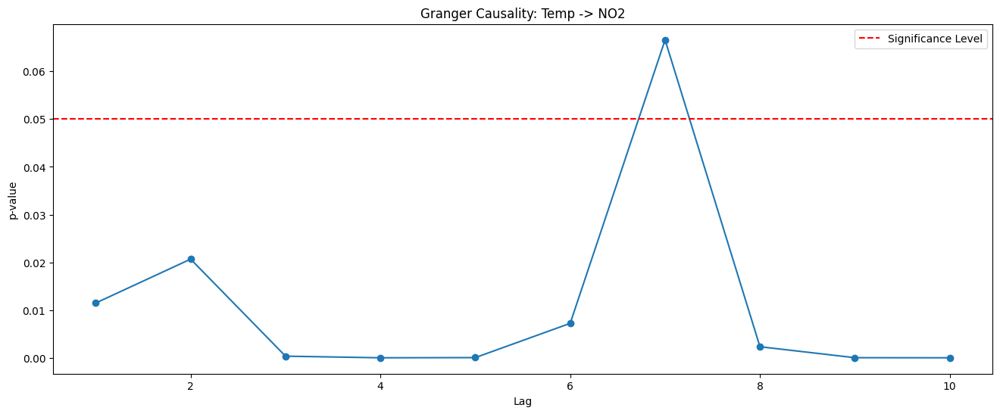

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


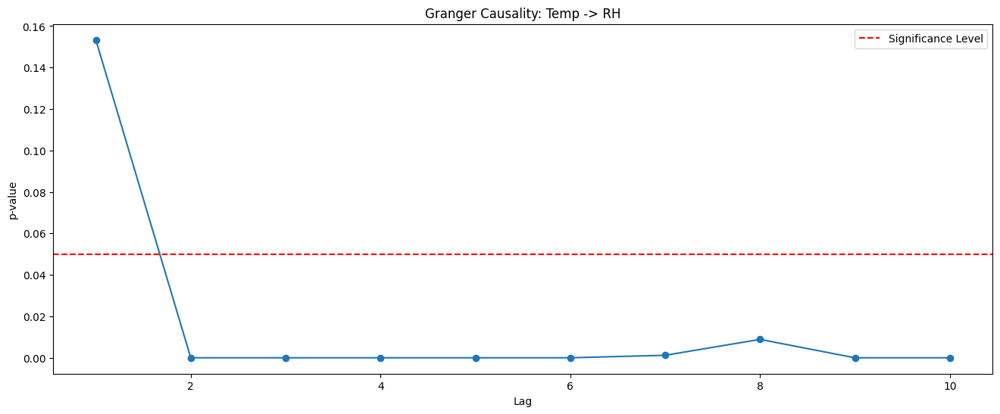

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


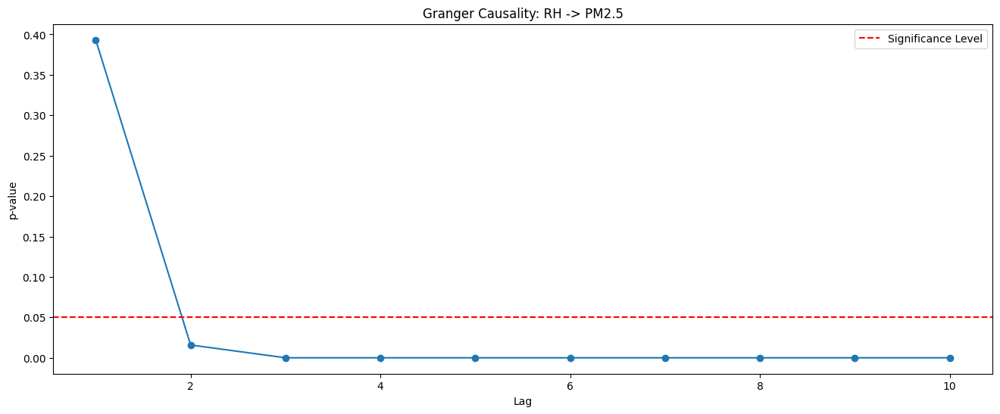

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


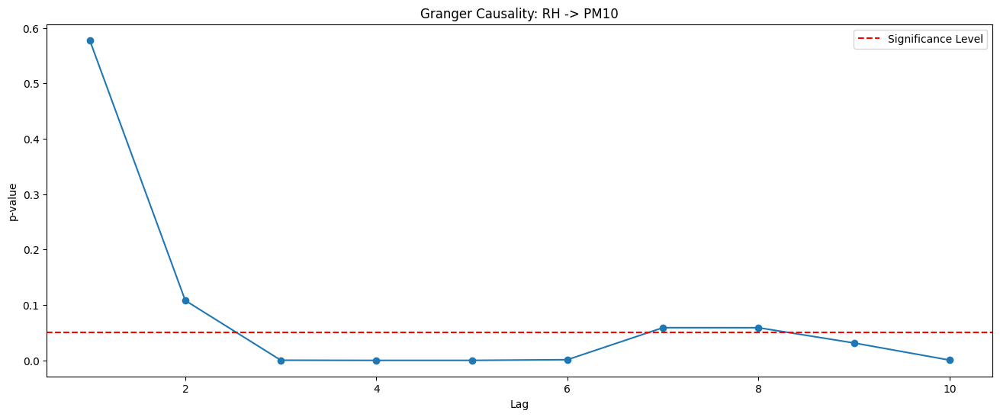

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


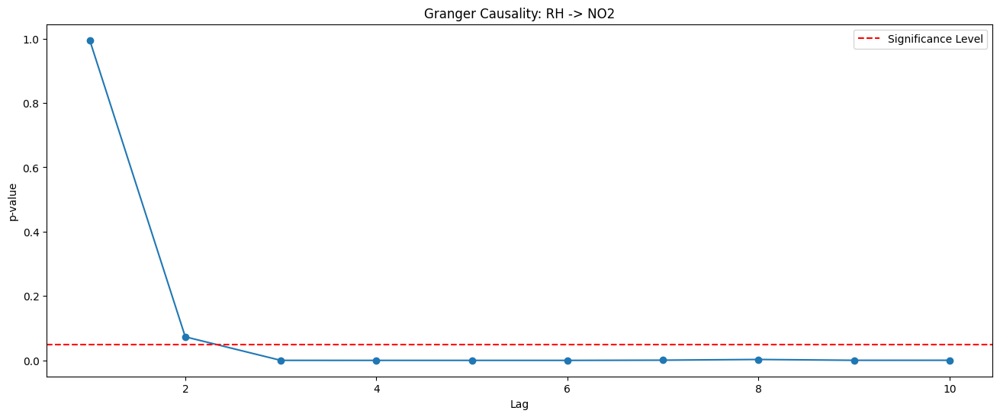

c:\m_pf\anaconda\envs\test\Lib\site-packages\statsmodels\tsa\stattools.py:1488: FutureWarning: verbose is deprecated since functions should not print results
  warnings.warn(


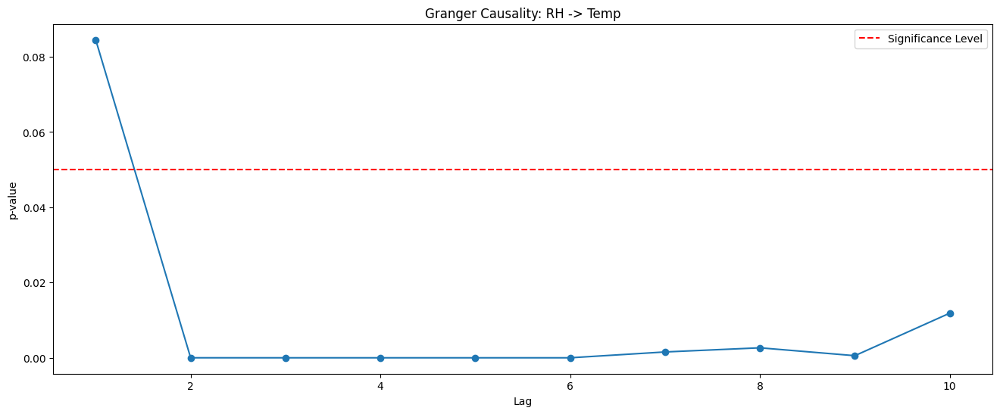

In [7]:
from statsmodels.tsa.stattools import grangercausalitytests

max_lag = 10  # Define the maximum lag for Granger Causality test

for pollutant in pollutants:
    for other_pollutant in pollutants:
        if pollutant != other_pollutant:
            data_subset = data[[pollutant, other_pollutant]].dropna()
            result = grangercausalitytests(data_subset, max_lag, verbose=False)
            p_values = [result[i+1][0]['ssr_chi2test'][1] for i in range(max_lag)]
            
            plt.figure(figsize=(16, 6))
            plt.plot(range(1, max_lag + 1), p_values, marker='o')
            plt.xlabel('Lag')
            plt.ylabel('p-value')
            plt.title(f'Granger Causality: {pollutant} -> {other_pollutant}')
            plt.axhline(y=0.05, color='red', linestyle='--', label='Significance Level')
            plt.legend()
            plt.show()
